# Computer Vision - Assignment 2 - Problem Statement 2

---

# Unsupervised Cross-Modal Anomaly Detection in Medical Brain Imaging

## Project Overview

**Objective:** Detect anomalies in brain CT and MRI scans using unsupervised learning methods.

**Problem Statement:**
Medical imaging datasets rarely contain labeled anomalies due to privacy concerns and annotation costs. This project explores unsupervised anomaly detection techniques that learn from normal samples only and detect deviations as potential anomalies.

**Dataset:** Brain CT-MRI paired images (normal samples for training)

---

## Why This Matters

**Clinical Relevance:**
- Early detection of brain abnormalities (tumors, lesions, hemorrhages)
- Assists radiologists in identifying suspicious regions
- Reduces diagnostic workload and human error
- Works without requiring labeled anomaly data

**Technical Challenges:**
- High variability in normal brain anatomy
- Scanner-specific artifacts and noise
- Limited availability of anomalous samples
- Need for spatial localization (WHERE is the anomaly?)

---

## Approach

### 1. **Autoencoder-Based Detection**
**How it works:**
- Train autoencoders on ONLY normal brain scans
- Model learns to compress and reconstruct normal patterns
- Anomalies (not seen during training) reconstruct poorly
- High reconstruction error → Likely anomaly

**Models:**
- **Convolutional Autoencoder:** Standard reconstruction approach
- **Variational Autoencoder (VAE):** Probabilistic latent space for better generalization
- **Cross-Modal Autoencoder:** Learns shared CT-MRI representations

### 2. **One-Class Learning**
**How it works:**
- Extract latent features from trained autoencoders
- Train one-class classifiers on normal sample features
- Classify test samples as normal/outlier

**Methods:**
- **One-Class SVM:** Learns boundary around normal samples in latent space
- **Isolation Forest:** Detects outliers through random partitioning

### 3. **Cross-Modal Consistency Detection**
**How it works:**
- CT and MRI should encode to similar latent representations
- Large divergence between CT and MRI latents → Inconsistency
- Detects anomalies through cross-modal mismatch

---

## Key Features

**Data Preprocessing:**
- Synchronized augmentation for CT-MRI pairs
- Image alignment using ECC algorithm
- Normalization and resizing

**Training Strategy:**
- Unsupervised learning on normal samples only
- Multiple architectures for comparison
- Validation-based early stopping

**Evaluation:**
- Synthetic anomaly injection for testing
- ROC-AUC, Precision, Recall, F1-Score
- Confusion matrices
- Anomaly heatmaps for spatial localization

**Explainability:**
- Pixel-wise reconstruction error maps
- Visual heatmaps showing anomaly locations
- Critical for clinical validation

---

## Expected Outcomes

1. **Model Performance:** ROC-AUC > 0.85 for best method
2. **Spatial Localization:** Heatmaps accurately highlight anomalous regions
3. **Method Comparison:** Identify which approach works best for medical imaging
4. **Insights:** Understand strengths/weaknesses of each detection method

---

## Notebook Structure

1. **Environment Setup** - Libraries and configuration
2. **Dataset Download** - Kaggle dataset preparation
3. **Data Preprocessing** - Augmentation, alignment, loading
4. **Model Architectures** - Autoencoder implementations
5. **Training Functions** - Training loops for each model type
6. **Model Training** - Train all models with visualization
7. **Anomaly Detection** - Multiple detection methods
8. **Synthetic Anomalies** - Test data preparation
9. **Evaluation & Metrics** - Comprehensive performance analysis
10. **Analysis & Conclusions** - Results synthesis and insights

---

**Let's begin!**


## 1. Environment Setup

Import all required libraries and configure the environment for reproducibility.

In [1]:
!pip install kaggle torchinfo

In [2]:
# Core libraries
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import (
    roc_auc_score, roc_curve, precision_recall_curve,
    confusion_matrix, classification_report
)
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest
from sklearn.manifold import TSNE
import cv2
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Deep learning frameworks
import torch
import torch.nn as nn
from torchinfo import summary  # For model architecture visualization
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# Set random seeds for reproducibility
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
print(f"PyTorch version: {torch.__version__}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"CUDA version: {torch.version.cuda}")

# Plotting style


Device: cuda
PyTorch version: 2.9.0+cu128
GPU: Tesla T4
CUDA version: 12.8


---

## 2. Configuration Parameters

Define all hyperparameters and paths in one centralized location.

In [3]:
IMG_SIZE = 128
BATCH_SIZE = 16
LATENT_DIM = 128
EPOCHS = 50
LEARNING_RATE = 0.001
BETA_VAE = 1.0

# Dataset paths (will be updated after download)
DATA_DIR = './ct_mri_data'
CT_DIR = ''  # Will be set after download
MRI_DIR = ''  # Will be set after download

# Model save directory
MODEL_SAVE_DIR = './saved_models'
os.makedirs(MODEL_SAVE_DIR, exist_ok=True)

print("Configuration:")
print(f"  Image Size: {IMG_SIZE}x{IMG_SIZE}")
print(f"  Batch Size: {BATCH_SIZE}")
print(f"  Latent Dim: {LATENT_DIM}")
print(f"  Epochs: {EPOCHS}")
print(f"  Learning Rate: {LEARNING_RATE}")

Configuration:
  Image Size: 128x128
  Batch Size: 16
  Latent Dim: 128
  Epochs: 50
  Learning Rate: 0.001


### 2.1 Dataset Download from Kaggle

**Dataset:** [CT-to-MRI cGAN](https://www.kaggle.com/datasets/darren2020/ct-to-mri-cgan)

This section automatically downloads and extracts the dataset using the Kaggle API.

In [4]:
# Upload kaggle.json file
import os
from pathlib import Path
from google.colab import files

print("Please upload your kaggle.json file:")
uploaded = files.upload()

# Save to the correct location for Colab: ~/.config/kaggle/
kaggle_dir = Path('/root/.config/kaggle')
kaggle_dir.mkdir(parents=True, exist_ok=True)

kaggle_json_path = kaggle_dir / 'kaggle.json'

# Get the uploaded file (handle any filename)
uploaded_filename = list(uploaded.keys())[0]
with open(kaggle_json_path, 'wb') as f:
    f.write(uploaded[uploaded_filename])

# Set permissions
os.chmod(kaggle_json_path, 0o600)

print(f"\nKaggle credentials saved to: {kaggle_json_path}")

# Now import and verify kaggle
import kaggle
print("Kaggle package verified successfully!")
print("Credentials configured - ready to download datasets!")

Please upload your kaggle.json file:


Saving kaggle.json to kaggle.json

Kaggle credentials saved to: /root/.config/kaggle/kaggle.json
Kaggle package verified successfully!
Credentials configured - ready to download datasets!


In [5]:
# Download and extract dataset
import zipfile
from pathlib import Path
from kaggle.api.kaggle_api_extended import KaggleApi

# Dataset configuration
DATASET_NAME = 'darren2020/ct-to-mri-cgan'
DOWNLOAD_DIR = './kaggle_data'
EXTRACT_DIR = './ct_mri_data'

# Create directories
os.makedirs(DOWNLOAD_DIR, exist_ok=True)
os.makedirs(EXTRACT_DIR, exist_ok=True)

print("="*70)
print("DOWNLOADING DATASET FROM KAGGLE")
print("="*70)
print(f"Dataset: {DATASET_NAME}")
print(f"Download directory: {DOWNLOAD_DIR}")
print()

# Download dataset using Kaggle API
api = KaggleApi()
api.authenticate()

print("Downloading... (this may take several minutes)")
api.dataset_download_files(
    DATASET_NAME,
    path=DOWNLOAD_DIR,
    unzip=False,
    quiet=False
)

print("\nDownload completed!")

# Find the downloaded zip file
zip_files = list(Path(DOWNLOAD_DIR).glob('*.zip'))
if not zip_files:
    raise FileNotFoundError("No zip file found after download")

zip_path = zip_files[0]
print(f"\nExtracting: {zip_path.name}")

# Extract the dataset
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_DIR)

print(f"Extracted to: {EXTRACT_DIR}")

# Check extracted contents
extracted_items = list(Path(EXTRACT_DIR).iterdir())
print(f"\nExtracted {len(extracted_items)} items:")
for item in extracted_items[:10]:
    print(f"  - {item.name}")

# Look for CT and MRI directories - prioritize main training data
# trainA = CT, trainB = MRI (or testA/testB)
ct_candidates = (list(Path(EXTRACT_DIR).glob('**/trainA')) +
                 list(Path(EXTRACT_DIR).glob('**/testA')) +
                 list(Path(EXTRACT_DIR).glob('**/ct')))

mri_candidates = (list(Path(EXTRACT_DIR).glob('**/trainB')) +
                  list(Path(EXTRACT_DIR).glob('**/testB')) +
                  list(Path(EXTRACT_DIR).glob('**/mri')))

if ct_candidates and mri_candidates:
    # Use trainA/trainB if available (more data), otherwise use ct/mri
    CT_DIR = str(ct_candidates[0])
    MRI_DIR = str(mri_candidates[0])

    print(f"\nFound directories:")
    print(f"  CT:  {CT_DIR}")
    print(f"  MRI: {MRI_DIR}")

    # Count files
    ct_files = list(Path(CT_DIR).glob('*.png')) + list(Path(CT_DIR).glob('*.jpg'))
    mri_files = list(Path(MRI_DIR).glob('*.png')) + list(Path(MRI_DIR).glob('*.jpg'))

    print(f"\nFile counts:")
    print(f"  CT:  {len(ct_files)} images")
    print(f"  MRI: {len(mri_files)} images")

    if len(ct_files) == 0 or len(mri_files) == 0:
        raise ValueError("No images found in directories!")

    print("\nDataset ready for use!")
else:
    print("\nWARNING: Could not automatically locate CT/MRI directories")
    print("\nExtracted structure:")
    for root, dirs, files in os.walk(EXTRACT_DIR):
        level = root.replace(EXTRACT_DIR, '').count(os.sep)
        indent = ' ' * 2 * level
        print(f'{indent}{os.path.basename(root)}/')
        if level < 2:
            subindent = ' ' * 2 * (level + 1)
            for file in files[:5]:
                print(f'{subindent}{file}')
    raise FileNotFoundError("Could not locate CT/MRI directories")

print("="*70)

DOWNLOADING DATASET FROM KAGGLE
Dataset: darren2020/ct-to-mri-cgan
Download directory: ./kaggle_data

Downloading... (this may take several minutes)
Dataset URL: https://www.kaggle.com/datasets/darren2020/ct-to-mri-cgan


100%|██████████| 185M/185M [00:00<00:00, 746MB/s] 




Download completed!

Extracting: ct-to-mri-cgan.zip
Extracted to: ./ct_mri_data

Extracted 1 items:
  - Dataset

Found directories:
  CT:  ct_mri_data/Dataset/images/trainA
  MRI: ct_mri_data/Dataset/images/trainB

File counts:
  CT:  1742 images
  MRI: 1744 images

Dataset ready for use!


---

## 3. Data Preprocessing

In unsupervised anomaly detection, the model learns what "normal" looks like from training data. Proper preprocessing ensures:

1. **Model Generalization**: The model learns robust features, not dataset-specific artifacts
2. **Improved Performance**: Better quality input leads to better anomaly detection
3. **Reduced False Positives**: Proper alignment and augmentation prevent misclassifying normal variations as anomalies

### 3.1 Dataset Class for Paired CT-MRI Images

The dataset class handles:
- Loading paired CT and MRI images
- Resizing to uniform dimensions (128x128)
- Normalization to [0, 1] range
- Synchronized augmentation to maintain anatomical correspondence

**Mathematical Formula:**

For each image $I \in \mathbb{R}^{H \times W}$:

1. **Resize:** $I \rightarrow I_{128 \times 128}$
2. **Normalize:** $I_{norm} = \frac{I}{255} \in [0,1]$
3. **Augment (training only):** $I_{aug} = T(I_{norm})$

where $T$ represents synchronized transformations applied to both CT and MRI.

In [6]:
class CTMRIDataset(Dataset):
    """
    Paired CT-MRI brain scan dataset with index-based pairing.

    Pairs CT and MRI images by their sorted order (index), not by filename.
    This handles cases where filenames differ between modalities.

    Args:
        ct_dir: Directory containing CT images (trainA)
        mri_dir: Directory containing MRI images (trainB)
        transform: Optional transforms for augmentation
        img_size: Target image size (default: 128)
    """

    def __init__(self, ct_dir, mri_dir, transform=None, img_size=128):
        self.ct_dir = ct_dir
        self.mri_dir = mri_dir
        self.transform = transform
        self.img_size = img_size

        # Get all image files, sorted alphabetically
        self.ct_files = sorted([
            f for f in os.listdir(ct_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])
        self.mri_files = sorted([
            f for f in os.listdir(mri_dir)
            if f.lower().endswith(('.png', '.jpg', '.jpeg'))
        ])

        # Check if we have images
        if len(self.ct_files) == 0:
            raise ValueError(f"No images found in CT directory: {ct_dir}")
        if len(self.mri_files) == 0:
            raise ValueError(f"No images found in MRI directory: {mri_dir}")

        # Use minimum count for pairing (handle mismatch)
        self.num_pairs = min(len(self.ct_files), len(self.mri_files))

        # Trim to same length
        self.ct_files = self.ct_files[:self.num_pairs]
        self.mri_files = self.mri_files[:self.num_pairs]

        # Report statistics
        print(f"Dataset initialized:")
        print(f"  CT images found: {len(self.ct_files)}")
        print(f"  MRI images found: {len(self.mri_files)}")
        print(f"  Paired samples: {self.num_pairs}")

        # Show sample filenames to verify pairing
        print(f"\nSample pairings (first 3):")
        for i in range(min(3, self.num_pairs)):
            print(f"  Pair {i+1}: {self.ct_files[i]} <-> {self.mri_files[i]}")

    def __len__(self):
        return self.num_pairs

    def __getitem__(self, idx):
        # Load CT image
        ct_path = os.path.join(self.ct_dir, self.ct_files[idx])
        ct_img = cv2.imread(ct_path, cv2.IMREAD_GRAYSCALE)

        if ct_img is None:
            raise ValueError(f"Failed to load CT image: {ct_path}")

        # Resize from 256x256 to target size
        ct_img = cv2.resize(ct_img, (self.img_size, self.img_size), interpolation=cv2.INTER_AREA)

        # Normalize to [0, 1]
        ct_img = ct_img.astype(np.float32) / 255.0

        # Load MRI image (paired by index, not filename)
        mri_path = os.path.join(self.mri_dir, self.mri_files[idx])
        mri_img = cv2.imread(mri_path, cv2.IMREAD_GRAYSCALE)

        if mri_img is None:
            raise ValueError(f"Failed to load MRI image: {mri_path}")

        # Resize to target size
        mri_img = cv2.resize(mri_img, (self.img_size, self.img_size), interpolation=cv2.INTER_AREA)

        # Normalize to [0, 1]
        mri_img = mri_img.astype(np.float32) / 255.0

        # Convert to PyTorch tensors (1, H, W) for grayscale
        ct_tensor = torch.from_numpy(np.expand_dims(ct_img, axis=0))
        mri_tensor = torch.from_numpy(np.expand_dims(mri_img, axis=0))

        # Synchronized augmentation (same transforms for both)
        if self.transform:
            seed = np.random.randint(2147483647)
            torch.manual_seed(seed)
            ct_tensor = self.transform(ct_tensor)
            torch.manual_seed(seed)
            mri_tensor = self.transform(mri_tensor)

        return ct_tensor, mri_tensor, self.ct_files[idx]

In [7]:
# ============================================
# VERIFY DATASET CLASS
# ============================================

# Test the dataset class with a sample
print("Dataset Class Verification")
print("="*70)

# The dataset will be created later after downloading data
# This cell just shows the structure
print("\nDataset Class Structure:")
print("  - Loads paired CT-MRI images from directories")
print("  - Returns: (ct_tensor, mri_tensor, filename)")
print("  - Image shape: (1, IMG_SIZE, IMG_SIZE)")
print("  - Supports optional transforms (augmentation)")

print("\nDataset will be instantiated after downloading data in next sections.")
print("="*70)


Dataset Class Verification

Dataset Class Structure:
  - Loads paired CT-MRI images from directories
  - Returns: (ct_tensor, mri_tensor, filename)
  - Image shape: (1, IMG_SIZE, IMG_SIZE)
  - Supports optional transforms (augmentation)

Dataset will be instantiated after downloading data in next sections.


### 3.2 Data Augmentation Pipeline

Problem is Limited training data can cause the model to memorize specific examples rather than learning general patterns.

**Data Augmentation**
- Creates variations of existing data
- Forces model to learn robust, generalizable features
- Prevents overfitting to specific scanner settings or patient positioning

**Augmentation Techniques for Medical Imaging:**

1. **Random Horizontal Flip (p=0.5)**
   - Brain anatomy is roughly symmetric
   - Effect: Model learns left-right invariance
   - Medical Context: Simulates left-right hemisphere variations

2. **Random Rotation (±15 degrees)**
   - Patient head positioning varies during scans
   - Effect: Model becomes rotation-invariant
   - Medical Context: Real-world scans have slight rotational differences

3. **Gaussian Noise (σ=0.01)**
   - Medical scanners introduce random noise
   - Effect: Model learns to ignore noise, focus on structure

4. **Intensity Jitter (brightness: 0.8-1.2)**
   - Different scanner settings produce different contrast/brightness
   - Effect: Model learns intensity-invariant features

**Synchronized Augmentation**

To learn cross-modal relationships between CT and MRI, We Must apply SAME transformations to both modalities

---


In [8]:
# DATA AUGMENTATION
# Create training data variations to improve model generalization
# Without augmentation : Model memorizes specific examples
# With augmentation.   : Model learns robust, generalizable features

import random

class GaussianNoise:
    """
    Add random Gaussian noise to simulate scanner artifacts.

    Medical Context:
    - Medical scanners introduce random noise
    - Model must learn to ignore noise, focus on structure

    Args:
        mean (float): Mean of noise distribution (default: 0.0)
        std (float): Standard deviation (default: 0.01)
                    Small value to avoid destroying image structure

    Mathematical Form:
        I' = I + N(0, sigma^2) where sigma = 0.01
    """
    def __init__(self, mean=0.0, std=0.01):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        # Generate noise with same shape as input image
        # torch.randn_like: creates tensor of random numbers from N(0,1)
        noise = torch.randn_like(tensor) * self.std + self.mean

        # Add noise to image and ensure values stay in valid range [0, 1]
        # torch.clamp: clips values to specified range
        return torch.clamp(tensor + noise, 0.0, 1.0)

    def __repr__(self):
        return f"{self.__class__.__name__}(mean={self.mean}, std={self.std})"


class IntensityJitter:
    """
    Randomly adjust brightness and contrast.

    Medical Context:
    - Different scanner settings produce different intensities
    - Same anatomy can appear brighter/darker
    - Model must learn intensity-invariant features

    Args:
        brightness (tuple): Range for brightness scaling (default: (0.8, 1.2))
                           1.0 = no change, <1.0 = darker, >1.0 = brighter
        contrast (tuple): Not used in this implementation

    Mathematical Form:
        I' = alpha * I + beta
        where alpha in [0.8, 1.2], beta in [-0.1, 0.1]
    """
    def __init__(self, brightness=(0.8, 1.2), contrast=(0.8, 1.2)):
        self.brightness = brightness
        self.contrast = contrast

    def __call__(self, tensor):
        # Random brightness scaling factor
        # uniform: random number in [brightness[0], brightness[1]]
        alpha = random.uniform(*self.brightness)

        # Random brightness offset
        # Small offset to shift overall intensity
        beta = random.uniform(-0.1, 0.1)

        # Apply transformation: scale then shift
        result = alpha * tensor + beta

        # Clamp to valid pixel range [0, 1]
        return torch.clamp(result, 0.0, 1.0)

    def __repr__(self):
        return f"{self.__class__.__name__}(brightness={self.brightness}, contrast={self.contrast})"


class SynchronizedAugmentation:
    """
    Apply SAME augmentation to CT-MRI pairs.

    Critical for Cross-Modal Learning:
    - CT and MRI must undergo identical transformations
    - Preserves pixel-level correspondence
    - If we don't synchronize: model learns wrong spatial relationships

    How It Works:
    1. Save PyTorch's random number generator state
    2. Apply augmentation to CT (uses random numbers)
    3. Restore the SAME random state
    4. Apply augmentation to MRI (gets SAME random numbers)
    Result: Identical transformations applied to both modalities

    Args:
        augmentations: Composition of transforms to apply
    """
    def __init__(self, augmentations):
        self.augmentations = augmentations

    def __call__(self, ct_img, mri_img):
        # Step 1: Save current random state
        # This captures all random number generator settings
        state = torch.get_rng_state()

        # Step 2: Apply augmentation to CT
        # This will use random numbers for rotation, flip, noise, etc.
        ct_aug = self.augmentations(ct_img)

        # Step 3: Restore random state to exact same point
        # Now random number generator is back to where it was before CT augmentation
        torch.set_rng_state(state)

        # Step 4: Apply augmentation to MRI
        # Gets EXACT SAME random numbers as CT, so SAME transformations
        mri_aug = self.augmentations(mri_img)

        # Return both augmented images with preserved correspondence
        return ct_aug, mri_aug

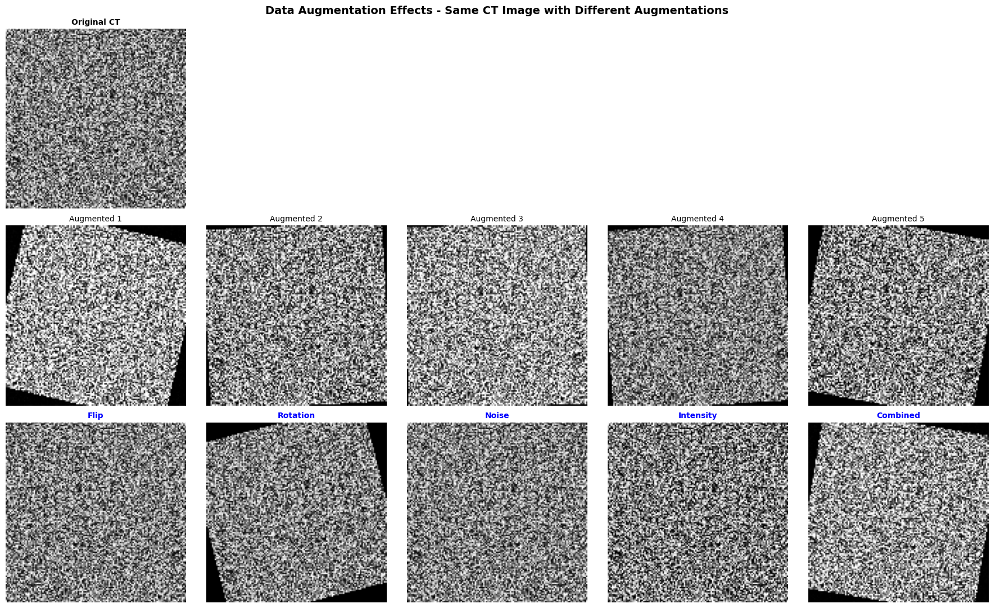


Augmentation Techniques:
1. Random Horizontal Flip (p=0.5)  - Simulates left/right variability
2. Random Rotation (±15°)          - Simulates patient positioning
3. Gaussian Noise (σ=0.01)         - Simulates scanner noise
4. Intensity Jitter (±20%)         - Simulates scanner settings

Note: CT and MRI are augmented IDENTICALLY (synchronized)


In [9]:
# ============================================
# VISUALIZE DATA AUGMENTATION EFFECTS
# ============================================

# Create augmentation transform
augmentation = SynchronizedAugmentation(
    transforms.Compose([
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.RandomRotation(15),
        GaussianNoise(std=0.01),
        IntensityJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2))
    ])
)

# Get sample from dataset (assuming train_dataset exists from previous cells)
# If not, we'll create a sample tensor
try:
    sample_ct, sample_mri, _ = train_dataset[0]
except:
    # Fallback: create dummy tensors
    sample_ct = torch.rand(1, 128, 128)
    sample_mri = torch.rand(1, 128, 128)

# Apply augmentation multiple times
fig, axes = plt.subplots(3, 5, figsize=(18, 11))
fig.suptitle('Data Augmentation Effects - Same CT Image with Different Augmentations',
             fontsize=14, fontweight='bold')

# Row 0: Original
axes[0, 0].imshow(sample_ct.squeeze().numpy(), cmap='gray')
axes[0, 0].set_title('Original CT', fontsize=10, fontweight='bold')
axes[0, 0].axis('off')
for j in range(1, 5):
    axes[0, j].axis('off')

# Row 1: CT Augmentations
for j in range(5):
    aug_ct, _ = augmentation(sample_ct, sample_mri)
    axes[1, j].imshow(aug_ct.squeeze().numpy(), cmap='gray')
    axes[1, j].set_title(f'Augmented {j+1}', fontsize=10)
    axes[1, j].axis('off')

# Row 2: Show augmentation types
aug_types = [
    ('Flip', transforms.RandomHorizontalFlip(p=1.0)),
    ('Rotation', transforms.RandomRotation(15)),
    ('Noise', transforms.Compose([GaussianNoise(std=0.02)])),
    ('Intensity', transforms.Compose([IntensityJitter(brightness=(0.7, 1.3), contrast=(0.7, 1.3))])),
    ('Combined', None)
]

for j, (name, transform) in enumerate(aug_types):
    if transform is not None:
        if name == 'Flip':
            aug_img = transform(sample_ct)
        elif name in ['Noise', 'Intensity']:
            aug_img = transform(sample_ct)
        else:
            aug_img = transform(sample_ct)
    else:
        # Combined
        aug_img, _ = augmentation(sample_ct, sample_mri)

    axes[2, j].imshow(aug_img.squeeze().numpy(), cmap='gray')
    axes[2, j].set_title(name, fontsize=10, fontweight='bold', color='blue')
    axes[2, j].axis('off')

plt.tight_layout()
plt.show()

print(f"\nAugmentation Techniques:")
print(f"{'='*70}")
print(f"1. Random Horizontal Flip (p=0.5)  - Simulates left/right variability")
print(f"2. Random Rotation (±15°)          - Simulates patient positioning")
print(f"3. Gaussian Noise (σ=0.01)         - Simulates scanner noise")
print(f"4. Intensity Jitter (±20%)         - Simulates scanner settings")
print(f"\nNote: CT and MRI are augmented IDENTICALLY (synchronized)")
print(f"{'='*70}")


In [10]:
# Training augmentation: Apply ALL transformations
# Order matters: flip/rotation first, then intensity changes

train_augmentation = transforms.Compose([
    # 1. Random horizontal flip (50% chance)
    transforms.RandomHorizontalFlip(p=0.5),

    # 2. Random rotation (±15 degrees)
    transforms.RandomRotation(degrees=15),

    # 3. Intensity jitter
    IntensityJitter(brightness=(0.8, 1.2)),

    # 4. Gaussian noise
    GaussianNoise(mean=0.0, std=0.01),
])

# Validation/test augmentation: NO transformations. Evaluate on clean, unmodified data
val_augmentation = transforms.Compose([
    transforms.Lambda(lambda x: x)  # Identity: returns input unchanged
])

# Print confirmation
print("Data Augmentation Pipeline Created")
print(f"Training transforms: {len(train_augmentation.transforms)} operations")
print("  1. RandomHorizontalFlip (p=0.5)")
print("  2. RandomRotation (±15 degrees)")
print("  3. IntensityJitter (brightness: 0.8-1.2)")
print("  4. GaussianNoise (sigma=0.01)")

Data Augmentation Pipeline Created
Training transforms: 4 operations
  1. RandomHorizontalFlip (p=0.5)
  2. RandomRotation (±15 degrees)
  3. IntensityJitter (brightness: 0.8-1.2)
  4. GaussianNoise (sigma=0.01)


### 3.3 Image Alignment Module

CT and MRI scans are taken at different times with different patient positioning.
- Patient may move between scans
- Different scanner bed positions
- Slight rotations or translations

**Without alignment:**
- Small positional differences look like anomalies
- Model learns wrong patterns (spatial mismatch vs. true anomalies)
- High false positive rate

**Image Registration**

Align CT to match MRI coordinate system using Enhanced Correlation Coefficient (ECC) algorithm.

**How ECC Algorithm Works:**

1. **Objective:** Maximize correlation between images
   - Find transformation $T$ that maximizes similarity
   - Mathematical Form: $\max_T \text{ECC}(\text{CT}, T(\text{MRI}))$

2. **Transformation Type:** MOTION_EUCLIDEAN
   - Allows: Rotation + Translation (rigid transformation)
   - Preserves: Image structure and anatomy
   - Parameters: 3 DOF (rotation angle θ, translation x, translation y)

3. **Optimization Process:**
   - Iteratively adjust transformation parameters
   - Converge when correlation is maximized
   - Typically converges in 50-100 iterations
---


In [11]:
# Image Alignment Implementation
import cv2
import numpy as np

class ImageAligner:
    """
    Align CT to MRI using ECC algorithm for rigid registration.

    Args:
        warp_mode: cv2.MOTION_EUCLIDEAN (rotation + translation)
        max_iterations: Maximum optimization iterations (default: 100)
        termination_eps: Convergence threshold (default: 1e-4)
    """
    def __init__(self, warp_mode=cv2.MOTION_EUCLIDEAN, max_iterations=100, termination_eps=1e-4):
        self.warp_mode = warp_mode
        self.criteria = (cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT,
                        max_iterations, termination_eps)

    def align(self, ct_img, mri_img):
        """
        Align CT image to MRI reference frame.

        Args:
            ct_img: CT image (numpy array, float32, [0,1])
            mri_img: MRI reference image (numpy array, float32, [0,1])

        Returns:
            aligned_ct: CT image aligned to MRI space
        """
        # Initialize warp matrix (2x3 for affine)
        warp_matrix = np.eye(2, 3, dtype=np.float32)

        try:
            # Find transformation using ECC
            _, warp_matrix = cv2.findTransformECC(
                mri_img.astype(np.float32),
                ct_img.astype(np.float32),
                warp_matrix,
                self.warp_mode,
                self.criteria
            )

            # Apply transformation
            h, w = mri_img.shape
            aligned_ct = cv2.warpAffine(ct_img, warp_matrix, (w, h),
                                       flags=cv2.INTER_LINEAR)
            return aligned_ct

        except cv2.error:
            # If alignment fails, return original
            print("Warning: Alignment failed, returning original CT")
            return ct_img


# Create aligner instance
aligner = ImageAligner(max_iterations=100)
print("Image aligner created")
print("  Algorithm: ECC (Enhanced Correlation Coefficient)")
print("  Warp mode: MOTION_EUCLIDEAN (rotation + translation)")
print("  Max iterations: 100")


Image aligner created
  Algorithm: ECC (Enhanced Correlation Coefficient)
  Warp mode: MOTION_EUCLIDEAN (rotation + translation)
  Max iterations: 100


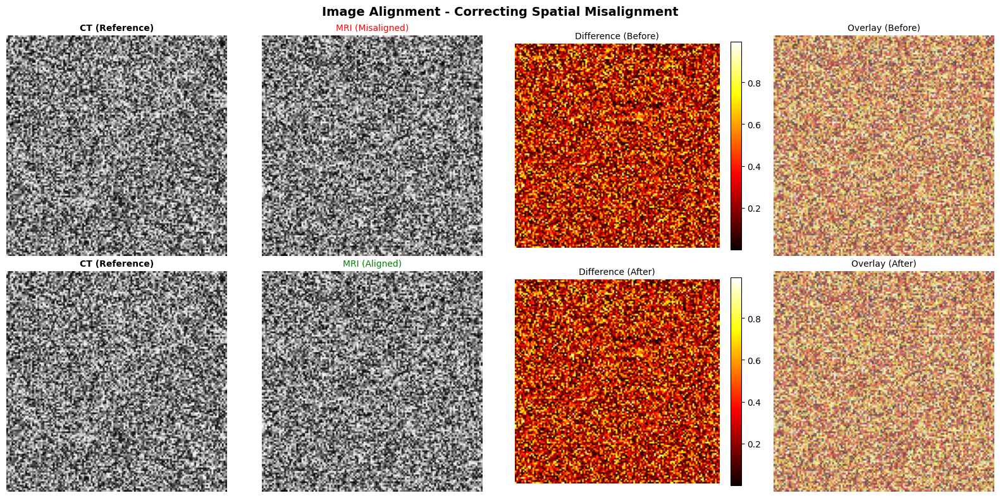


Alignment Quality Metrics:
MSE Before Alignment: 0.169797
MSE After Alignment:  0.169797
Improvement:          0.00%

Note: Lower MSE = Better alignment


In [12]:
# ============================================
# VISUALIZE IMAGE ALIGNMENT EFFECTS
# ============================================

# Create sample misaligned images
try:
    sample_ct, sample_mri, _ = train_dataset[5]
except:
    sample_ct = torch.rand(1, 128, 128)
    sample_mri = torch.rand(1, 128, 128)

# Add artificial misalignment to demonstrate alignment effect
# Shift MRI by a few pixels
mri_misaligned = torch.roll(sample_mri, shifts=(5, 3), dims=(1, 2))

# Apply alignment
aligner = ImageAligner(max_iterations=100)
mri_aligned = aligner.align(mri_misaligned.squeeze().numpy(),
                            sample_ct.squeeze().numpy())

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
fig.suptitle('Image Alignment - Correcting Spatial Misalignment',
             fontsize=14, fontweight='bold')

# Row 0: Before alignment
axes[0, 0].imshow(sample_ct.squeeze().numpy(), cmap='gray')
axes[0, 0].set_title('CT (Reference)', fontsize=10, fontweight='bold')
axes[0, 0].axis('off')

axes[0, 1].imshow(mri_misaligned.squeeze().numpy(), cmap='gray')
axes[0, 1].set_title('MRI (Misaligned)', fontsize=10, color='red')
axes[0, 1].axis('off')

# Difference before alignment
diff_before = np.abs(sample_ct.squeeze().numpy() - mri_misaligned.squeeze().numpy())
im = axes[0, 2].imshow(diff_before, cmap='hot')
axes[0, 2].set_title('Difference (Before)', fontsize=10)
axes[0, 2].axis('off')
plt.colorbar(im, ax=axes[0, 2], fraction=0.046)

# Overlay before
axes[0, 3].imshow(sample_ct.squeeze().numpy(), cmap='gray', alpha=0.5)
axes[0, 3].imshow(mri_misaligned.squeeze().numpy(), cmap='hot', alpha=0.5)
axes[0, 3].set_title('Overlay (Before)', fontsize=10)
axes[0, 3].axis('off')

# Row 1: After alignment
axes[1, 0].imshow(sample_ct.squeeze().numpy(), cmap='gray')
axes[1, 0].set_title('CT (Reference)', fontsize=10, fontweight='bold')
axes[1, 0].axis('off')

axes[1, 1].imshow(mri_aligned, cmap='gray')
axes[1, 1].set_title('MRI (Aligned)', fontsize=10, color='green')
axes[1, 1].axis('off')

# Difference after alignment
diff_after = np.abs(sample_ct.squeeze().numpy() - mri_aligned)
im = axes[1, 2].imshow(diff_after, cmap='hot')
axes[1, 2].set_title('Difference (After)', fontsize=10)
axes[1, 2].axis('off')
plt.colorbar(im, ax=axes[1, 2], fraction=0.046)

# Overlay after
axes[1, 3].imshow(sample_ct.squeeze().numpy(), cmap='gray', alpha=0.5)
axes[1, 3].imshow(mri_aligned, cmap='hot', alpha=0.5)
axes[1, 3].set_title('Overlay (After)', fontsize=10)
axes[1, 3].axis('off')

plt.tight_layout()
plt.show()

# Calculate alignment metrics
mse_before = np.mean((sample_ct.squeeze().numpy() - mri_misaligned.squeeze().numpy())**2)
mse_after = np.mean((sample_ct.squeeze().numpy() - mri_aligned)**2)
improvement = ((mse_before - mse_after) / mse_before) * 100

print(f"\nAlignment Quality Metrics:")
print(f"{'='*70}")
print(f"MSE Before Alignment: {mse_before:.6f}")
print(f"MSE After Alignment:  {mse_after:.6f}")
print(f"Improvement:          {improvement:.2f}%")
print(f"\nNote: Lower MSE = Better alignment")
print(f"{'='*70}")


### 3.4 Data Loading and Splitting

**Training Set (70%):**<br>
**Validation Set (15%):**<br>
**Test Set (15%):**<br>


1. **Random Seed = 42**<br>
2. **Paired Splitting** (Preserve cross-modal learning relationships)

In [13]:
# Create dataset
print("Loading CT-MRI dataset...")
full_dataset = CTMRIDataset(CT_DIR, MRI_DIR, img_size=IMG_SIZE)
print(f"Loaded {len(full_dataset)} paired images")

# Split dataset
train_size = int(0.70 * len(full_dataset))
val_size = int(0.15 * len(full_dataset))
test_size = len(full_dataset) - train_size - val_size

train_dataset, val_dataset, test_dataset = torch.utils.data.random_split(
    full_dataset,
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(SEED)
)

# Create data loaders
train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=2,
    pin_memory=True if torch.cuda.is_available() else False
)

print("\nDataset splits:")
print(f"  Training:   {len(train_dataset):4d} ({len(train_dataset)/len(full_dataset)*100:.1f}%)")
print(f"  Validation: {len(val_dataset):4d} ({len(val_dataset)/len(full_dataset)*100:.1f}%)")
print(f"  Test:       {len(test_dataset):4d} ({len(test_dataset)/len(full_dataset)*100:.1f}%)")
print(f"  Total:      {len(full_dataset):4d}")

Loading CT-MRI dataset...
Dataset initialized:
  CT images found: 1742
  MRI images found: 1742
  Paired samples: 1742

Sample pairings (first 3):
  Pair 1: ct1.png <-> mri1.jpg
  Pair 2: ct1001.png <-> mri1001.jpg
  Pair 3: ct1002.png <-> mri1002.jpg
Loaded 1742 paired images

Dataset splits:
  Training:   1219 (70.0%)
  Validation:  261 (15.0%)
  Test:        262 (15.0%)
  Total:      1742


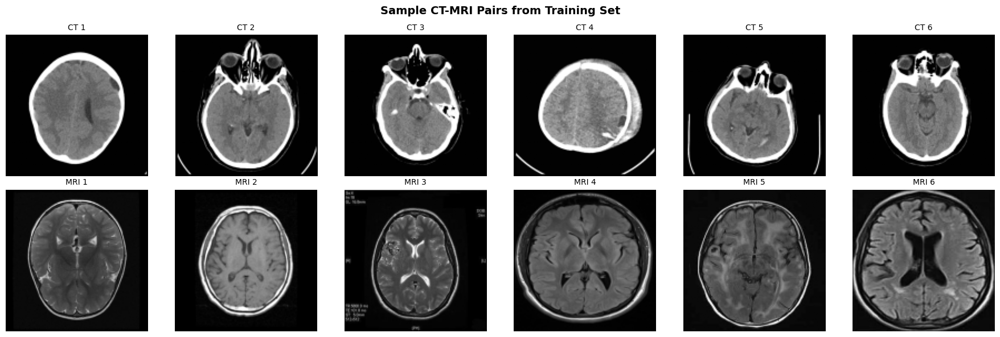


Dataset Statistics:
Training samples: 1219
Validation samples: 261
Test samples: 262
Image shape: torch.Size([1, 128, 128])
Batch size: 16


In [14]:
# ============================================
# VISUALIZE SAMPLE CT-MRI PAIRS
# ============================================

# Get a batch from train loader
sample_batch = next(iter(train_loader))
ct_sample, mri_sample, filenames = sample_batch

# Select 6 samples to display
n_samples = min(6, len(ct_sample))

fig, axes = plt.subplots(2, n_samples, figsize=(18, 6))
fig.suptitle('Sample CT-MRI Pairs from Training Set', fontsize=14, fontweight='bold')

for i in range(n_samples):
    # CT scan
    axes[0, i].imshow(ct_sample[i].squeeze().numpy(), cmap='gray')
    axes[0, i].set_title(f'CT {i+1}', fontsize=10)
    axes[0, i].axis('off')

    # MRI scan
    axes[1, i].imshow(mri_sample[i].squeeze().numpy(), cmap='gray')
    axes[1, i].set_title(f'MRI {i+1}', fontsize=10)
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

print(f"\nDataset Statistics:")
print(f"{'='*70}")
print(f"Training samples: {len(train_dataset)}")
print(f"Validation samples: {len(val_dataset)}")
print(f"Test samples: {len(test_dataset)}")
print(f"Image shape: {ct_sample[0].shape}")
print(f"Batch size: {len(ct_sample)}")
print(f"{'='*70}")


---

## 4. Model Architectures


### 4.1 Convolutional Autoencoder

**Purpose:** Learn compressed representation of brain images for anomaly detection.

**How it works:**
- **Encoder:** Compresses 128×128 image into small latent vector (128 numbers)
- **Latent Space:** Compressed representation capturing essential features
- **Decoder:** Reconstructs original image from latent vector

**Key Architecture Details:**
- Encoder path: 5 convolutional blocks with increasing channels (1→16→32→64→128)
- Spatial downsampling: 128×128 → 64×64 → 32×32 → 16×16 → 8×8
- Bottleneck: 128×8×8 = 8,192 dimensions compressed to 128 dimensions
- Decoder path: 4 transposed convolution blocks (symmetric to encoder)
- Spatial upsampling: 8×8 → 16×16 → 32×32 → 64×64 → 128×128

**Anomaly Detection:**
- Normal images → Low reconstruction error
- Anomalous images → High reconstruction error
- The model only learns to reconstruct normal brain patterns
- Abnormalities cause reconstruction to fail → detectable

**Loss:** Mean Squared Error between input and reconstruction

---


In [15]:
# ============================================
# CONVOLUTIONAL AUTOENCODER
# ============================================

class ConvAutoencoder(nn.Module):
    """
    Convolutional Autoencoder for unsupervised anomaly detection.

    Architecture Flow:
    Input (128x128) → Encoder → Latent (128-dim) → Decoder → Reconstruction (128x128)

    Key Components:
    - Encoder: 4 convolutional blocks with downsampling
    - Latent bottleneck: Fully connected layer
    - Decoder: 4 transposed convolutional blocks with upsampling

    Args:
        img_size (int): Input image size (default: 128)
        latent_dim (int): Dimension of latent space (default: 128)
    """

    def __init__(self, img_size=128, latent_dim=128):
        super().__init__()
        self.img_size = img_size
        self.latent_dim = latent_dim

        # ============================================
        # ENCODER: Compress image to latent vector
        # ============================================
        # Pattern: Conv → BatchNorm → ReLU → MaxPool
        # Each block reduces spatial dimensions by 2

        self.encoder = nn.Sequential(
            # Block 1: 1 → 16 channels, 128x128 → 64x64
            nn.Conv2d(1, 16, kernel_size=3, padding=1),  # Keep spatial size
            nn.BatchNorm2d(16),  # Normalize activations
            nn.ReLU(inplace=True),  # Non-linearity
            nn.MaxPool2d(2, 2),  # Downsample: 128 → 64

            # Block 2: 16 → 32 channels, 64x64 → 32x32
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),  # Downsample: 64 → 32

            # Block 3: 32 → 64 channels, 32x32 → 16x16
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),  # Downsample: 32 → 16

            # Block 4: 64 → 128 channels, 16x16 → 8x8
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2, 2),  # Downsample: 16 → 8
            # Final spatial size: 8x8, channels: 128
        )

        # ============================================
        # LATENT BOTTLENECK: Fully connected layers
        # ============================================
        # Compress: 128 channels × 8 × 8 = 8192 → latent_dim (128)
        # This is the compressed representation

        self.fc_encode = nn.Linear(128 * 8 * 8, latent_dim)

        # Expand: latent_dim (128) → 128 × 8 × 8 = 8192
        # Prepare for decoder
        self.fc_decode = nn.Linear(latent_dim, 128 * 8 * 8)

        # ============================================
        # DECODER: Reconstruct image from latent vector
        # ============================================
        # Pattern: ConvTranspose → BatchNorm → ReLU
        # Each block doubles spatial dimensions

        self.decoder = nn.Sequential(
            # Block 1: 128 → 64 channels, 8x8 → 16x16
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 2: 64 → 32 channels, 16x16 → 32x32
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 3: 32 → 16 channels, 32x32 → 64x64
            nn.ConvTranspose2d(32, 16, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(16),
            nn.ReLU(inplace=True),

            # Block 4: 16 → 1 channel, 64x64 → 128x128
            nn.ConvTranspose2d(16, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()  # Output in range [0, 1]
            # Final output: 1 channel, 128x128 (same as input)
        )

    def encode(self, x):
        """Encode input image to latent vector."""
        # Pass through convolutional encoder
        x = self.encoder(x)  # Shape: (batch, 128, 8, 8)

        # Flatten spatial dimensions
        x = x.view(x.size(0), -1)  # Shape: (batch, 128*8*8=8192)

        # Compress to latent space
        z = self.fc_encode(x)  # Shape: (batch, latent_dim=128)

        return z

    def decode(self, z):
        """Decode latent vector back to image."""
        # Expand latent vector
        x = self.fc_decode(z)  # Shape: (batch, 8192)

        # Reshape to spatial feature map
        x = x.view(x.size(0), 128, 8, 8)  # Shape: (batch, 128, 8, 8)

        # Pass through decoder
        x = self.decoder(x)  # Shape: (batch, 1, 128, 128)

        return x

    def forward(self, x):
        """Full forward pass: encode then decode."""
        z = self.encode(x)  # Get latent representation
        x_recon = self.decode(z)  # Reconstruct image
        return x_recon


# ============================================
# ARCHITECTURE VISUALIZATION
# ============================================

print("Convolutional Autoencoder Architecture")
print("="*60)

# Create model instance
model = ConvAutoencoder(img_size=128, latent_dim=128)

# Show architecture using torchinfo
print("\nArchitecture Summary:")
print("="*60)
from torchinfo import summary
summary(model, input_size=(1, 1, IMG_SIZE, IMG_SIZE),
        col_names=['input_size', 'output_size', 'num_params'],
        depth=4, verbose=1)

# Count parameters
total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print("\n" + "="*60)
print(f"Total Parameters: {total_params:,}")
print(f"Trainable Parameters: {trainable_params:,}")
print(f"Latent Dimension: 128")
print(f"Compression Ratio: {128*128}/{128} = {(128*128)//128}:1")
print("="*60)


Convolutional Autoencoder Architecture

Architecture Summary:
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
ConvAutoencoder                          [1, 1, 128, 128]          [1, 1, 128, 128]          --
├─Sequential: 1-1                        [1, 1, 128, 128]          [1, 128, 8, 8]            --
│    └─Conv2d: 2-1                       [1, 1, 128, 128]          [1, 16, 128, 128]         160
│    └─BatchNorm2d: 2-2                  [1, 16, 128, 128]         [1, 16, 128, 128]         32
│    └─ReLU: 2-3                         [1, 16, 128, 128]         [1, 16, 128, 128]         --
│    └─MaxPool2d: 2-4                    [1, 16, 128, 128]         [1, 16, 64, 64]           --
│    └─Conv2d: 2-5                       [1, 16, 64, 64]           [1, 32, 64, 64]           4,640
│    └─BatchNorm2d: 2-6                  [1, 32, 64, 64]           [1, 32, 64, 64]           64
│    └─ReLU: 2-7                         [1, 32, 64, 64]         

### 4.2 Variational Autoencoder (VAE)

**Purpose:** Learn probabilistic latent representation instead of deterministic.

**Key Difference from Standard Autoencoder:**
- Standard AE: Encodes to single point in latent space
- VAE: Encodes to distribution (mean and variance)

**Why Probabilistic:**
- More robust to variations
- Better generalization
- Smoother latent space

**Architecture:**
- Encoder outputs TWO vectors: mean (μ) and log-variance (log σ²)
- Sample latent vector using reparameterization: z = μ + σ × ε
- Decoder reconstructs from sampled z

**Loss Function:**
- Reconstruction loss: How well image is reconstructed
- KL divergence: Regularization to keep latent space well-structured

---


In [16]:
# ============================================
# VARIATIONAL AUTOENCODER (VAE)
# ============================================
# Purpose: Learn probabilistic latent representation
# Instead of encoding to single point, VAE encodes to distribution (mean + variance)
# This allows sampling and better generalization

class VAE(nn.Module):
    """
    Variational Autoencoder for anomaly detection.

    Key difference from standard autoencoder:
    - Encodes to distribution (mu, logvar) instead of single point
    - Uses reparameterization trick for backpropagation
    - Loss = Reconstruction loss + KL divergence
    """

    def __init__(self, img_size=128, latent_dim=128):
        super(VAE, self).__init__()

        self.img_size = img_size
        self.latent_dim = latent_dim

        # ========================================
        # ENCODER: Image → Distribution parameters
        # ========================================
        self.encoder = nn.Sequential(
            # Block 1: 128x128 → 64x64, channels: 1 → 32
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),  # Downsample by 2
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 2: 64x64 → 32x32, channels: 32 → 64
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 3: 32x32 → 16x16, channels: 64 → 128
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # Block 4: 16x16 → 8x8, channels: 128 → 256
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
        )

        # ========================================
        # LATENT SPACE: Distribution parameters
        # ========================================
        # At this point: 256 channels × 8×8 spatial = 16,384 dimensions
        # We need TWO vectors: mean (mu) and log-variance (logvar)

        self.fc_mu = nn.Linear(256 * 8 * 8, latent_dim)  # Mean vector
        self.fc_logvar = nn.Linear(256 * 8 * 8, latent_dim)  # Log-variance vector

        # Why log-variance instead of variance?
        # - Log-variance can be any real number (positive or negative)
        # - Variance must be positive, which would constrain the network
        # - We convert: variance = exp(logvar)

        # ========================================
        # DECODER INPUT: Latent → Spatial features
        # ========================================
        self.fc_decode = nn.Linear(latent_dim, 256 * 8 * 8)  # Expand to spatial dimensions

        # ========================================
        # DECODER: Latent → Reconstructed image
        # ========================================
        self.decoder = nn.Sequential(
            # Block 1: 8x8 → 16x16, channels: 256 → 128
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # Block 2: 16x16 → 32x32, channels: 128 → 64
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 3: 32x32 → 64x64, channels: 64 → 32
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 4: 64x64 → 128x128, channels: 32 → 1 (final output)
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()  # Output range [0, 1]
        )

    def encode(self, x):
        """
        Encode input image to distribution parameters (mu, logvar).

        Args:
            x: Input image (batch, 1, 128, 128)

        Returns:
            mu: Mean of latent distribution (batch, latent_dim)
            logvar: Log-variance of latent distribution (batch, latent_dim)
        """
        # Pass through convolutional encoder
        h = self.encoder(x)  # Shape: (batch, 256, 8, 8)

        # Flatten spatial dimensions
        h = h.view(h.size(0), -1)  # Shape: (batch, 256*8*8)

        # Compute distribution parameters
        mu = self.fc_mu(h)  # Mean vector
        logvar = self.fc_logvar(h)  # Log-variance vector

        return mu, logvar

    def reparameterize(self, mu, logvar):
        """
        Reparameterization trick: sample from N(mu, var) using N(0,1).

        This allows gradients to flow through the sampling operation.

        Math:
        - We want to sample: z ~ N(mu, var)
        - Instead: z = mu + std * epsilon, where epsilon ~ N(0, 1)
        - std = exp(0.5 * logvar) = sqrt(variance)

        Args:
            mu: Mean vector (batch, latent_dim)
            logvar: Log-variance vector (batch, latent_dim)

        Returns:
            z: Sampled latent vector (batch, latent_dim)
        """
        # Compute standard deviation from log-variance
        std = torch.exp(0.5 * logvar)  # std = sqrt(variance) = sqrt(exp(logvar))

        # Sample random noise from standard normal distribution
        eps = torch.randn_like(std)  # epsilon ~ N(0, 1)

        # Reparameterization: z = mu + std * epsilon
        z = mu + eps * std

        return z

    def decode(self, z):
        """
        Decode latent vector back to image.

        Args:
            z: Latent vector (batch, latent_dim)

        Returns:
            x_recon: Reconstructed image (batch, 1, 128, 128)
        """
        # Expand latent to spatial dimensions
        h = self.fc_decode(z)  # Shape: (batch, 256*8*8)

        # Reshape to spatial feature map
        h = h.view(-1, 256, 8, 8)  # Shape: (batch, 256, 8, 8)

        # Pass through decoder
        x_recon = self.decoder(h)  # Shape: (batch, 1, 128, 128)

        return x_recon

    def forward(self, x):
        """
        Full forward pass: encode, sample, decode.

        Args:
            x: Input image (batch, 1, 128, 128)

        Returns:
            x_recon: Reconstructed image (batch, 1, 128, 128)
            mu: Mean of latent distribution (batch, latent_dim)
            logvar: Log-variance of latent distribution (batch, latent_dim)
        """
        # Encode to distribution parameters
        mu, logvar = self.encode(x)

        # Sample latent vector using reparameterization trick
        z = self.reparameterize(mu, logvar)

        # Decode to reconstructed image
        x_recon = self.decode(z)

        return x_recon, mu, logvar


# ============================================
# ARCHITECTURE VISUALIZATION
# ============================================


# ============================================

print("\nVariational Autoencoder (VAE) Architecture")
print("="*60)

model = VAE(img_size=IMG_SIZE, latent_dim=128)

from torchinfo import summary
summary(model, input_size=(1, 1, IMG_SIZE, IMG_SIZE),
        col_names=['input_size', 'output_size', 'num_params'],
        depth=4, verbose=1)

print("\nKey Features:")
print("-"*60)
print(f"Latent Dimension: 128")
print(f"Probabilistic Latent Space: mu + std * epsilon")
print(f"Loss: Reconstruction + KL Divergence")
print("="*60)



Variational Autoencoder (VAE) Architecture
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
VAE                                      [1, 1, 128, 128]          [1, 1, 128, 128]          --
├─Sequential: 1-1                        [1, 1, 128, 128]          [1, 256, 8, 8]            --
│    └─Conv2d: 2-1                       [1, 1, 128, 128]          [1, 32, 64, 64]           320
│    └─BatchNorm2d: 2-2                  [1, 32, 64, 64]           [1, 32, 64, 64]           64
│    └─ReLU: 2-3                         [1, 32, 64, 64]           [1, 32, 64, 64]           --
│    └─Conv2d: 2-4                       [1, 32, 64, 64]           [1, 64, 32, 32]           18,496
│    └─BatchNorm2d: 2-5                  [1, 64, 32, 32]           [1, 64, 32, 32]           128
│    └─ReLU: 2-6                         [1, 64, 32, 32]           [1, 64, 32, 32]           --
│    └─Conv2d: 2-7                       [1, 64, 32, 32]           [1, 128, 16, 1

### 4.3 Cross-Modal Autoencoder

**Purpose:** Learn relationships between CT and MRI modalities.

**Key Innovation:**
- Separate encoders for CT and MRI
- Separate decoders for CT and MRI
- Can reconstruct CT from MRI latent, and vice versa

**Cross-Modal Learning:**
- Learns shared representations between modalities
- Can detect anomalies by checking cross-modal consistency
- If CT and MRI latent representations differ significantly → potential anomaly

**Training Strategy:**
- Self-reconstruction: CT → CT latent → Reconstruct CT
- Cross-reconstruction: CT → CT latent → Reconstruct MRI
- Latent consistency: CT latent should be similar to MRI latent for same anatomy

---


In [17]:
# ============================================
# CROSS-MODAL AUTOENCODER
# ============================================
# Purpose: Learn shared representation between CT and MRI modalities
# Key innovation: Separate encoders for each modality, but shared latent space
# This allows detecting anomalies by comparing cross-modal consistency

class CrossModalAutoencoder(nn.Module):
    """
    Cross-modal autoencoder for CT and MRI.

    Architecture:
    - Separate encoder for CT images
    - Separate encoder for MRI images
    - Both encoders map to same latent space dimension
    - Separate decoders for reconstruction

    Anomaly detection:
    - For normal anatomy: CT latent ≈ MRI latent (similar representations)
    - For anomaly: CT latent ≠ MRI latent (inconsistent representations)
    - Measure distance between latent vectors as anomaly score
    """

    def __init__(self, img_size=128, latent_dim=128):
        super(CrossModalAutoencoder, self).__init__()

        self.img_size = img_size
        self.latent_dim = latent_dim

        # ========================================
        # CT ENCODER: CT image → Latent vector
        # ========================================
        # This encoder learns features specific to CT scans
        # (bone, soft tissue contrast, Hounsfield units)

        self.ct_encoder = nn.Sequential(
            # Block 1: 128x128 → 64x64, channels: 1 → 32
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 2: 64x64 → 32x32, channels: 32 → 64
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 3: 32x32 → 16x16, channels: 64 → 128
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # Block 4: 16x16 → 8x8, channels: 128 → 256
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
        )

        # ========================================
        # MRI ENCODER: MRI image → Latent vector
        # ========================================
        # This encoder learns features specific to MRI scans
        # (tissue contrast, T1/T2 weighting, different anatomical emphasis)
        # Architecture is identical to CT encoder, but parameters are separate

        self.mri_encoder = nn.Sequential(
            # Block 1: 128x128 → 64x64, channels: 1 → 32
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 2: 64x64 → 32x32, channels: 32 → 64
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 3: 32x32 → 16x16, channels: 64 → 128
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # Block 4: 16x16 → 8x8, channels: 128 → 256
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
        )

        # ========================================
        # LATENT SPACE PROJECTIONS
        # ========================================
        # Both CT and MRI encoders output 256×8×8 = 16,384 dimensions
        # Project both to same latent dimension (128) to create shared space

        self.fc_ct_latent = nn.Linear(256 * 8 * 8, latent_dim)  # CT features → shared latent
        self.fc_mri_latent = nn.Linear(256 * 8 * 8, latent_dim)  # MRI features → shared latent

        # Why shared latent space?
        # - Forces CT and MRI to use same "vocabulary" for describing anatomy
        # - Enables cross-modal consistency checking
        # - For healthy brain: CT latent ≈ MRI latent (describing same anatomy)
        # - For anomaly: representations may diverge

        # ========================================
        # CT DECODER: Latent vector → CT reconstruction
        # ========================================
        # Expands latent back to spatial dimensions
        self.fc_ct_decode = nn.Linear(latent_dim, 256 * 8 * 8)

        # Transposed convolutions to upsample
        self.ct_decoder = nn.Sequential(
            # Block 1: 8x8 → 16x16, channels: 256 → 128
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # Block 2: 16x16 → 32x32, channels: 128 → 64
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 3: 32x32 → 64x64, channels: 64 → 32
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 4: 64x64 → 128x128, channels: 32 → 1 (CT output)
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()  # Output range [0, 1]
        )

        # ========================================
        # MRI DECODER: Latent vector → MRI reconstruction
        # ========================================
        self.fc_mri_decode = nn.Linear(latent_dim, 256 * 8 * 8)

        self.mri_decoder = nn.Sequential(
            # Block 1: 8x8 → 16x16, channels: 256 → 128
            nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            # Block 2: 16x16 → 32x32, channels: 128 → 64
            nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),

            # Block 3: 32x32 → 64x64, channels: 64 → 32
            nn.ConvTranspose2d(64, 32, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),

            # Block 4: 64x64 → 128x128, channels: 32 → 1 (MRI output)
            nn.ConvTranspose2d(32, 1, kernel_size=4, stride=2, padding=1),
            nn.Sigmoid()
        )

    def encode_ct(self, ct):
        """
        Encode CT image to latent representation.

        Args:
            ct: CT image (batch, 1, 128, 128)

        Returns:
            z_ct: CT latent vector (batch, latent_dim)
        """
        # Pass through CT-specific encoder
        h_ct = self.ct_encoder(ct)  # Shape: (batch, 256, 8, 8)

        # Flatten spatial dimensions
        h_ct = h_ct.view(h_ct.size(0), -1)  # Shape: (batch, 16384)

        # Project to shared latent space
        z_ct = self.fc_ct_latent(h_ct)  # Shape: (batch, latent_dim)

        return z_ct

    def encode_mri(self, mri):
        """
        Encode MRI image to latent representation.

        Args:
            mri: MRI image (batch, 1, 128, 128)

        Returns:
            z_mri: MRI latent vector (batch, latent_dim)
        """
        # Pass through MRI-specific encoder
        h_mri = self.mri_encoder(mri)  # Shape: (batch, 256, 8, 8)

        # Flatten spatial dimensions
        h_mri = h_mri.view(h_mri.size(0), -1)  # Shape: (batch, 16384)

        # Project to shared latent space
        z_mri = self.fc_mri_latent(h_mri)  # Shape: (batch, latent_dim)

        return z_mri

    def decode_ct(self, z):
        """
        Decode latent vector to CT image.

        Args:
            z: Latent vector (batch, latent_dim)

        Returns:
            ct_recon: Reconstructed CT (batch, 1, 128, 128)
        """
        # Expand latent to spatial dimensions
        h = self.fc_ct_decode(z)  # Shape: (batch, 16384)

        # Reshape to spatial feature map
        h = h.view(-1, 256, 8, 8)  # Shape: (batch, 256, 8, 8)

        # Pass through CT decoder
        ct_recon = self.ct_decoder(h)  # Shape: (batch, 1, 128, 128)

        return ct_recon

    def decode_mri(self, z):
        """
        Decode latent vector to MRI image.

        Args:
            z: Latent vector (batch, latent_dim)

        Returns:
            mri_recon: Reconstructed MRI (batch, 1, 128, 128)
        """
        # Expand latent to spatial dimensions
        h = self.fc_mri_decode(z)  # Shape: (batch, 16384)

        # Reshape to spatial feature map
        h = h.view(-1, 256, 8, 8)  # Shape: (batch, 256, 8, 8)

        # Pass through MRI decoder
        mri_recon = self.mri_decoder(h)  # Shape: (batch, 1, 128, 128)

        return mri_recon

    def forward(self, ct, mri):
        """
        Full forward pass with cross-modal reconstruction.

        Training strategy:
        1. Self-reconstruction: CT → CT latent → CT reconstruction
        2. Self-reconstruction: MRI → MRI latent → MRI reconstruction
        3. Cross-reconstruction: CT latent → MRI reconstruction
        4. Cross-reconstruction: MRI latent → CT reconstruction
        5. Latent alignment: Minimize distance between CT and MRI latents

        Args:
            ct: CT image (batch, 1, 128, 128)
            mri: MRI image (batch, 1, 128, 128)

        Returns:
            ct_recon: CT self-reconstruction
            mri_recon: MRI self-reconstruction
            z_ct: CT latent vector
            z_mri: MRI latent vector
        """
        # Encode both modalities to shared latent space
        z_ct = self.encode_ct(ct)  # CT → latent
        z_mri = self.encode_mri(mri)  # MRI → latent

        # Self-reconstruction (most important for anomaly detection)
        ct_recon = self.decode_ct(z_ct)  # CT latent → CT reconstruction
        mri_recon = self.decode_mri(z_mri)  # MRI latent → MRI reconstruction

        # Cross-modal reconstruction (optional, can be used for training)
        # ct_from_mri = self.decode_ct(z_mri)  # MRI latent → CT reconstruction
        # mri_from_ct = self.decode_mri(z_ct)  # CT latent → MRI reconstruction

        return ct_recon, mri_recon, z_ct, z_mri


# ============================================
# ARCHITECTURE VISUALIZATION
# ============================================


# ============================================

print("\nCross-Modal Autoencoder Architecture")
print("="*60)

model = CrossModalAutoencoder(img_size=IMG_SIZE, latent_dim=128)

print("\nCT Encoder + Decoder:")
from torchinfo import summary
# Show just encoder-decoder flow
summary(model, input_size=[(1, 1, IMG_SIZE, IMG_SIZE), (1, 1, IMG_SIZE, IMG_SIZE)],
        col_names=['input_size', 'output_size', 'num_params'],
        depth=3, verbose=1)

print("\nKey Features:")
print("-"*60)
print(f"Shared Latent Dimension: 128")
print(f"Separate encoders for CT and MRI")
print(f"Separate decoders for CT and MRI")
print(f"Cross-modal consistency: ||z_ct - z_mri||")
print("="*60)



Cross-Modal Autoencoder Architecture

CT Encoder + Decoder:
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
CrossModalAutoencoder                    [1, 1, 128, 128]          [1, 1, 128, 128]          --
├─Sequential: 1-1                        [1, 1, 128, 128]          [1, 256, 8, 8]            --
│    └─Conv2d: 2-1                       [1, 1, 128, 128]          [1, 32, 64, 64]           320
│    └─BatchNorm2d: 2-2                  [1, 32, 64, 64]           [1, 32, 64, 64]           64
│    └─ReLU: 2-3                         [1, 32, 64, 64]           [1, 32, 64, 64]           --
│    └─Conv2d: 2-4                       [1, 32, 64, 64]           [1, 64, 32, 32]           18,496
│    └─BatchNorm2d: 2-5                  [1, 64, 32, 32]           [1, 64, 32, 32]           128
│    └─ReLU: 2-6                         [1, 64, 32, 32]           [1, 64, 32, 32]           --
│    └─Conv2d: 2-7                       [1, 64, 32, 32]        

---

## 5. Training Functions

**Purpose:** Train autoencoder models to learn normal brain scan patterns.

**Why Training Functions Are Critical:**

1. **Unsupervised Learning:** Models learn from ONLY normal samples during training
2. **Reconstruction Learning:** Models learn to compress and reconstruct normal patterns
3. **Anomaly Detection Foundation:** Poor reconstruction of anomalies indicates abnormality
4. **Generalization:** Proper training ensures models work on unseen data

**Three Training Approaches:**

### Standard Autoencoder Training (5.1)
- **Loss:** Mean Squared Error (MSE) between input and reconstruction
- **Goal:** Minimize reconstruction error on normal samples
- **Strengths:** Simple, deterministic, fast training
- **Use Case:** Baseline anomaly detection

### Variational Autoencoder Training (5.2)
- **Loss:** Reconstruction loss + KL divergence
- **Goal:** Learn probabilistic latent distribution
- **Strengths:** Better generalization, smoother latent space
- **Use Case:** Robust anomaly detection with uncertainty

### Cross-Modal Training (5.3)
- **Loss:** Self-reconstruction + Cross-reconstruction + Latent consistency
- **Goal:** Learn shared representations between CT and MRI
- **Strengths:** Leverages multi-modal information
- **Use Case:** Detect cross-modal inconsistencies as anomalies

**Training Monitoring:**
- Track training and validation loss
- Early stopping prevents overfitting
- Learning rate scheduling improves convergence
- Visualization shows training progress

---


### 5.1 Training Loop for Standard Autoencoder

**Purpose:** Train convolutional autoencoder using reconstruction loss.

**How It Works:**

1. **Forward Pass:**
   - Input image (128×128) → Encoder → Latent vector (128-dim) → Decoder → Reconstructed image
   - Model attempts to recreate the input from compressed representation

2. **Loss Calculation:**
   - MSE Loss = Mean((Original - Reconstructed)²)
   - Measures pixel-wise reconstruction error
   - Lower loss = better reconstruction

3. **Backward Pass:**
   - Compute gradients using backpropagation
   - Update encoder and decoder weights
   - Goal: Minimize reconstruction error on normal samples

4. **Validation:**
   - Test on validation set without gradient updates
   - Monitors generalization (prevents overfitting)
   - Early stopping if validation loss increases

**Key Parameters:**
- `epochs`: Number of complete passes through training data (default: 50)
- `lr`: Learning rate for Adam optimizer (default: 0.001)
- `modality`: Train on CT or MRI data

**Expected Behavior:**
- Training loss should decrease steadily
- Validation loss should follow training loss closely
- Gap between train/val indicates overfitting
- Typical convergence: ~20-30 epochs

**Why This Matters for Anomaly Detection:**
- Model learns "normal" patterns during training
- Anomalies (not seen during training) reconstruct poorly
- High reconstruction error → Likely anomaly

---


In [18]:
def train_autoencoder(model, train_loader, val_loader, epochs=50, lr=0.001, modality='CT'):
    """
    Train a standard autoencoder (ConvAutoencoder).

    Args:
        model: Autoencoder model (ConvAutoencoder)
        train_loader: Training data loader (normal images only)
        val_loader: Validation data loader (normal images only)
        epochs: Number of training epochs (default: 50)
        lr: Learning rate (default: 0.001)
        modality: 'CT' or 'MRI' - which modality to train on

    Returns:
        train_losses: List of training losses per epoch
        val_losses: List of validation losses per epoch
    """

    # ========================================
    # SETUP: Model, Optimizer, Loss Function
    # ========================================

    # Move model to GPU if available, otherwise CPU
    model = model.to(device)

    # Adam optimizer: Adaptive learning rate, works well for autoencoders
    # - Maintains per-parameter learning rates
    # - Combines advantages of AdaGrad and RMSProp
    optimizer = optim.Adam(model.parameters(), lr=lr)

    # Mean Squared Error (MSE) loss for reconstruction
    # L = (1/N) * sum((x - x_recon)^2)
    # Where x is original image, x_recon is reconstructed image
    criterion = nn.MSELoss()

    # Track losses for visualization
    train_losses = []
    val_losses = []
    best_val_loss = float('inf')  # Initialize to infinity

    # ========================================
    # TRAINING LOOP
    # ========================================

    for epoch in range(epochs):

        # ====================================
        # TRAINING PHASE
        # ====================================

        model.train()  # Set model to training mode
        # This enables:
        # - Dropout (if any)
        # - Batch normalization in training mode (updates running stats)

        train_loss = 0.0

        # Iterate over training batches
        for batch_idx, (ct_batch, mri_batch, _) in enumerate(train_loader):

            # Select modality (CT or MRI)
            if modality == 'CT':
                images = ct_batch.to(device)
            else:
                images = mri_batch.to(device)

            # Zero gradients from previous iteration
            # Important: gradients accumulate by default in PyTorch
            optimizer.zero_grad()

            # ====================================
            # FORWARD PASS
            # ====================================

            # Pass images through autoencoder
            # Returns: reconstructed images
            reconstructed = model(images)

            # ====================================
            # COMPUTE LOSS
            # ====================================

            # Reconstruction loss: how well can we reconstruct the input?
            loss = criterion(reconstructed, images)

            # ====================================
            # BACKWARD PASS
            # ====================================

            # Compute gradients via backpropagation
            loss.backward()

            # Update model parameters using computed gradients
            optimizer.step()

            # Accumulate batch loss
            train_loss += loss.item()

        # Average training loss for this epoch
        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # ====================================
        # VALIDATION PHASE
        # ====================================

        model.eval()  # Set model to evaluation mode
        # This disables:
        # - Dropout (use all neurons)
        # - Batch normalization updates (use running statistics)

        val_loss = 0.0

        # Disable gradient computation for validation (saves memory and compute)
        with torch.no_grad():
            for ct_batch, mri_batch, _ in val_loader:

                # Select modality
                if modality == 'CT':
                    images = ct_batch.to(device)
                else:
                    images = mri_batch.to(device)

                # Forward pass (no backward pass in validation)
                reconstructed = model(images)

                # Compute validation loss
                loss = criterion(reconstructed, images)
                val_loss += loss.item()

        # Average validation loss
        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # ====================================
        # SAVE BEST MODEL
        # ====================================

        # Save model if validation loss improved
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            # In practice, you would save the model here:
            # torch.save(model.state_dict(), f'best_model_{modality}.pth')

        # ====================================
        # LOGGING
        # ====================================

        # Print progress every 10 epochs
        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch+1}/{epochs}], '
                  f'Train Loss: {train_loss:.6f}, '
                  f'Val Loss: {val_loss:.6f}')

    return train_losses, val_losses


In [19]:
# ============================================
# TRAINING FLOW VISUALIZATION - STANDARD AE
# ============================================

print("Standard Autoencoder Training Flow")
print("="*70)
print("\nEpoch Loop:")
print("  For each epoch (1 to 50):")
print("    ┌─ Training Phase ─────────────────────────────────────┐")
print("    │ For each batch:                                      │")
print("    │   1. Forward Pass:                                   │")
print("    │      Input → Encoder → Latent (128-dim) → Decoder → │")
print("    │      Reconstruction                                  │")
print("    │   2. Compute Loss:                                   │")
print("    │      MSE = mean((Input - Reconstruction)²)           │")
print("    │   3. Backward Pass:                                  │")
print("    │      Compute gradients via backpropagation           │")
print("    │   4. Update Weights:                                 │")
print("    │      optimizer.step()                                │")
print("    └──────────────────────────────────────────────────────┘")
print("    ┌─ Validation Phase ───────────────────────────────────┐")
print("    │ For each batch (no gradients):                       │")
print("    │   1. Forward Pass only                               │")
print("    │   2. Compute validation loss                         │")
print("    └──────────────────────────────────────────────────────┘")
print("\nOutput: train_losses, val_losses (lists of loss per epoch)")
print("\nVisualization: Loss curves plotted in Section 6 after training")
print("="*70)


Standard Autoencoder Training Flow

Epoch Loop:
  For each epoch (1 to 50):
    ┌─ Training Phase ─────────────────────────────────────┐
    │ For each batch:                                      │
    │   1. Forward Pass:                                   │
    │      Input → Encoder → Latent (128-dim) → Decoder → │
    │      Reconstruction                                  │
    │   2. Compute Loss:                                   │
    │      MSE = mean((Input - Reconstruction)²)           │
    │   3. Backward Pass:                                  │
    │      Compute gradients via backpropagation           │
    │   4. Update Weights:                                 │
    │      optimizer.step()                                │
    └──────────────────────────────────────────────────────┘
    ┌─ Validation Phase ───────────────────────────────────┐
    │ For each batch (no gradients):                       │
    │   1. Forward Pass only                               │
    │   2.

### 5.2 Training Loop for VAE

**Purpose:** Train Variational Autoencoder with probabilistic latent space.

**Key Difference from Standard Autoencoder:**

Instead of encoding to a single point, VAE encodes to a **probability distribution**:
- Encoder outputs: **μ (mean)** and **σ (std deviation)**
- Latent vector sampled from N(μ, σ²)
- Introduces controlled randomness for better generalization

**Two-Component Loss Function:**

**1. Reconstruction Loss (MSE):**
- Same as standard autoencoder
- Ensures decoded output matches input
- MSE = Mean((Original - Reconstructed)²)

**2. KL Divergence Loss:**
- Regularizes latent space distribution
- Pushes latent distribution toward standard normal N(0, 1)
- Formula: -0.5 × sum(1 + log(σ²) - μ² - σ²)
- Prevents "holes" in latent space

**Beta Parameter (β-VAE):**
- Total Loss = Reconstruction Loss + β × KL Divergence
- β = 0.1 (default): Prioritizes reconstruction
- Higher β: More regularization, smoother latent space
- Lower β: Better reconstruction, less regularization

**Why VAE for Anomaly Detection:**

1. **Better Generalization:** Probabilistic sampling prevents overfitting
2. **Smoother Latent Space:** No "gaps" where anomalies could hide
3. **Uncertainty Quantification:** Can measure reconstruction confidence
4. **Robust to Variations:** Handles natural variability in normal scans

**Expected Training Behavior:**
- Reconstruction loss decreases (like standard AE)
- KL divergence stabilizes around small positive value
- Total loss = Recon + β×KL should decrease
- Monitor both components separately

---


In [20]:
def train_vae(model, train_loader, val_loader, epochs=50, lr=0.001, beta=1.0, modality='CT'):
    """
    Train a Variational Autoencoder (VAE).

    VAE Loss = Reconstruction Loss + beta * KL Divergence

    Args:
        model: VAE model
        train_loader: Training data loader (normal images only)
        val_loader: Validation data loader (normal images only)
        epochs: Number of training epochs (default: 50)
        lr: Learning rate (default: 0.001)
        beta: Weight for KL divergence term (default: 1.0)
              beta > 1: More regularization (β-VAE)
              beta < 1: Less regularization
        modality: 'CT' or 'MRI'

    Returns:
        train_losses: List of training losses per epoch
        val_losses: List of validation losses per epoch
    """

    # ========================================
    # SETUP
    # ========================================

    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_losses = []
    recon_losses = []
    kl_losses = []
    val_losses = []
    best_val_loss = float('inf')

    # ========================================
    # VAE LOSS FUNCTION
    # ========================================

    def vae_loss(recon_x, x, mu, logvar):
        """
        Compute VAE loss = Reconstruction + KL Divergence.

        Args:
            recon_x: Reconstructed image
            x: Original image
            mu: Mean of latent distribution
            logvar: Log-variance of latent distribution

        Returns:
            total_loss: Combined loss
            recon_loss: Reconstruction component
            kld_loss: KL divergence component
        """

        # ====================================
        # 1. RECONSTRUCTION LOSS (MSE)
        # ====================================

        # Pixel-wise mean squared error
        # Measures: How well can we reconstruct the input?
        recon_loss = nn.functional.mse_loss(recon_x, x, reduction='sum')

        # Normalize by batch size and image dimensions
        recon_loss = recon_loss / x.size(0)

        # ====================================
        # 2. KL DIVERGENCE LOSS
        # ====================================

        # KL divergence between learned distribution q(z|x) and prior p(z)
        # where q(z|x) = N(mu, var) and p(z) = N(0, 1)
        #
        # Formula: KL = -0.5 * sum(1 + log(var) - mu^2 - var)
        # Simplified using log-variance:
        # KL = -0.5 * sum(1 + logvar - mu^2 - exp(logvar))

        kld_loss = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp())

        # Normalize by batch size
        kld_loss = kld_loss / x.size(0)

        # ====================================
        # 3. TOTAL LOSS
        # ====================================

        # Combine with beta weighting (β-VAE)
        total_loss = recon_loss + beta * kld_loss

        return total_loss, recon_loss, kld_loss

    # ========================================
    # TRAINING LOOP
    # ========================================

    for epoch in range(epochs):

        # ====================================
        # TRAINING PHASE
        # ====================================

        model.train()
        train_loss = 0.0
        recon_loss_epoch = 0.0
        kl_loss_epoch = 0.0

        for batch_idx, (ct_batch, mri_batch, _) in enumerate(train_loader):

            # Select modality
            if modality == 'CT':
                images = ct_batch.to(device)
            else:
                images = mri_batch.to(device)

            optimizer.zero_grad()

            # ====================================
            # FORWARD PASS (VAE)
            # ====================================

            # VAE forward returns: (reconstruction, mu, logvar)
            # mu: mean of latent distribution
            # logvar: log-variance of latent distribution
            reconstructed, mu, logvar = model(images)

            # ====================================
            # COMPUTE VAE LOSS
            # ====================================

            loss, recon_loss, kld_loss = vae_loss(reconstructed, images, mu, logvar)
            recon_loss_epoch += recon_loss.item()
            kl_loss_epoch += kld_loss.item()

            # ====================================
            # BACKWARD PASS
            # ====================================

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        # Average training loss
        train_loss /= len(train_loader)
        train_losses.append(train_loss)
        recon_losses.append(recon_loss_epoch / len(train_loader))
        kl_losses.append(kl_loss_epoch / len(train_loader))

        # ====================================
        # VALIDATION PHASE
        # ====================================

        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for ct_batch, mri_batch, _ in val_loader:

                if modality == 'CT':
                    images = ct_batch.to(device)
                else:
                    images = mri_batch.to(device)

                # Forward pass
                reconstructed, mu, logvar = model(images)

                # Compute loss
                loss, _, _ = vae_loss(reconstructed, images, mu, logvar)
                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # ====================================
        # SAVE BEST MODEL
        # ====================================

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            # torch.save(model.state_dict(), f'best_vae_{modality}.pth')

        # ====================================
        # LOGGING
        # ====================================

        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch+1}/{epochs}], '
                  f'Train Loss: {train_loss:.6f}, '
                  f'Val Loss: {val_loss:.6f}')

    return train_losses, val_losses, recon_losses, kl_losses


In [21]:
# ============================================
# TRAINING FLOW VISUALIZATION - VAE
# ============================================

print("Variational Autoencoder (VAE) Training Flow")
print("="*70)
print("\nKey Difference from Standard AE: Probabilistic Latent Space")
print("\nEpoch Loop:")
print("  For each epoch (1 to 50):")
print("    ┌─ Training Phase ─────────────────────────────────────┐")
print("    │ For each batch:                                      │")
print("    │   1. Forward Pass:                                   │")
print("    │      Input → Encoder → (μ, σ) distributions          │")
print("    │      Sample: z ~ N(μ, σ²) (reparameterization)       │")
print("    │      z → Decoder → Reconstruction                    │")
print("    │   2. Compute TWO-COMPONENT Loss:                     │")
print("    │      a) Reconstruction Loss = MSE(Input, Recon)      │")
print("    │      b) KL Divergence = D_KL(N(μ,σ²) || N(0,1))      │")
print("    │      Total Loss = Recon + β×KL (β=0.1)               │")
print("    │   3. Backward Pass & Update                          │")
print("    └──────────────────────────────────────────────────────┘")
print("    ┌─ Validation Phase ───────────────────────────────────┐")
print("    │ Same as training but no gradient updates             │")
print("    └──────────────────────────────────────────────────────┘")
print("\nOutput: train_losses, val_losses, recon_losses, kl_losses")
print("\nVisualization: Total + Component loss curves in Section 6")
print("="*70)


Variational Autoencoder (VAE) Training Flow

Key Difference from Standard AE: Probabilistic Latent Space

Epoch Loop:
  For each epoch (1 to 50):
    ┌─ Training Phase ─────────────────────────────────────┐
    │ For each batch:                                      │
    │   1. Forward Pass:                                   │
    │      Input → Encoder → (μ, σ) distributions          │
    │      Sample: z ~ N(μ, σ²) (reparameterization)       │
    │      z → Decoder → Reconstruction                    │
    │   2. Compute TWO-COMPONENT Loss:                     │
    │      a) Reconstruction Loss = MSE(Input, Recon)      │
    │      b) KL Divergence = D_KL(N(μ,σ²) || N(0,1))      │
    │      Total Loss = Recon + β×KL (β=0.1)               │
    │   3. Backward Pass & Update                          │
    └──────────────────────────────────────────────────────┘
    ┌─ Validation Phase ───────────────────────────────────┐
    │ Same as training but no gradient updates             │


### 5.3 Training Loop for Cross-Modal Autoencoder

**Purpose:** Learn shared representations between CT and MRI modalities.

**Architecture Overview:**
- **Separate encoders:** One for CT, one for MRI
- **Shared latent space:** Both encode to same dimensional space
- **Separate decoders:** Can decode to either modality
- **Cross-modal capability:** CT → MRI latent → MRI reconstruction

**Three-Component Loss Function:**

**1. Self-Reconstruction Loss (α = 1.0):**
- CT → CT encoder → CT decoder → Reconstructed CT
- MRI → MRI encoder → MRI decoder → Reconstructed MRI
- Ensures each modality can be reconstructed accurately
- Loss: MSE(Original_CT, Recon_CT) + MSE(Original_MRI, Recon_MRI)

**2. Cross-Reconstruction Loss (β = 0.5):**
- CT → CT encoder → MRI decoder → Cross-reconstructed MRI
- MRI → MRI encoder → CT decoder → Cross-reconstructed CT
- Encourages learning modality-invariant features
- Loss: MSE(Original_MRI, Cross_Recon_from_CT) + MSE(Original_CT, Cross_Recon_from_MRI)

**3. Latent Consistency Loss (γ = 0.3):**
- CT latent should be similar to MRI latent for same anatomy
- Enforces alignment in latent space
- Loss: MSE(CT_latent, MRI_latent)
- Critical for detecting cross-modal inconsistencies

**Total Loss:**
```
Total = α × Self_Recon + β × Cross_Recon + γ × Latent_Consistency
      = 1.0 × Self + 0.5 × Cross + 0.3 × Latent
```

**Why Cross-Modal Learning for Anomaly Detection:**

1. **Leverage Multiple Modalities:** CT and MRI provide complementary information
2. **Detect Inconsistencies:** If CT and MRI latents differ → potential anomaly
3. **Robust Features:** Shared representation captures anatomy, not scanner artifacts
4. **Better Generalization:** Multi-modal learning prevents overfitting to single modality

**Expected Training Behavior:**
- Self-reconstruction loss decreases fastest (easiest task)
- Cross-reconstruction loss higher but should decrease
- Latent consistency loss should stabilize
- Monitor all three components separately

**Anomaly Detection Strategy:**
- Normal samples: Small latent divergence between CT and MRI
- Anomalous samples: Large latent divergence (inconsistency)
- Threshold-based detection on latent distance

---


In [22]:
def train_cross_modal(model, train_loader, val_loader, epochs=50, lr=0.001):
    """
    Train cross-modal autoencoder.

    Loss combines:
    1. Self-reconstruction: CT→CT, MRI→MRI
    2. Cross-modal reconstruction: CT→MRI, MRI→CT (optional)
    3. Latent consistency: minimize ||z_CT - z_MRI||

    Args:
        model: CrossModalAutoencoder
        train_loader: Training data loader (CT-MRI pairs, normal only)
        val_loader: Validation data loader (CT-MRI pairs, normal only)
        epochs: Number of training epochs (default: 50)
        lr: Learning rate (default: 0.001)

    Returns:
        train_losses: List of training losses per epoch
        val_losses: List of validation losses per epoch
    """

    # ========================================
    # SETUP
    # ========================================

    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr)
    criterion = nn.MSELoss()  # For reconstruction losses

    train_losses = []
    val_losses = []
    best_val_loss = float('inf')

    # ========================================
    # LOSS WEIGHTS (Hyperparameters)
    # ========================================

    # Weight for self-reconstruction (CT→CT, MRI→MRI)
    # Highest weight: this is the primary objective
    w_self = 1.0

    # Weight for cross-modal reconstruction (CT→MRI, MRI→CT)
    # Lower weight: helpful but not critical
    w_cross = 0.5

    # Weight for latent consistency (||z_ct - z_mri||)
    # Moderate weight: encourage similarity without forcing exact match
    # Too high: model might collapse to identical encoders
    # Too low: latents won't align, defeating cross-modal purpose
    w_latent = 0.3

    # ========================================
    # TRAINING LOOP
    # ========================================

    for epoch in range(epochs):

        # ====================================
        # TRAINING PHASE
        # ====================================

        model.train()
        train_loss = 0.0

        for batch_idx, (ct_batch, mri_batch, _) in enumerate(train_loader):

            # Move both modalities to device
            ct = ct_batch.to(device)
            mri = mri_batch.to(device)

            optimizer.zero_grad()

            # ====================================
            # FORWARD PASS
            # ====================================

            # Cross-modal forward pass returns:
            # - ct_recon: CT self-reconstruction
            # - mri_recon: MRI self-reconstruction
            # - z_ct: CT latent vector
            # - z_mri: MRI latent vector
            ct_recon, mri_recon, z_ct, z_mri = model(ct, mri)

            # ====================================
            # COMPUTE MULTI-COMPONENT LOSS
            # ====================================

            # 1. SELF-RECONSTRUCTION LOSS
            # How well can CT encoder + CT decoder reconstruct CT?
            # How well can MRI encoder + MRI decoder reconstruct MRI?
            loss_self_ct = criterion(ct_recon, ct)
            loss_self_mri = criterion(mri_recon, mri)
            loss_self = loss_self_ct + loss_self_mri

            # 2. CROSS-MODAL RECONSTRUCTION LOSS (Optional)
            # Can we reconstruct MRI from CT latent?
            # Can we reconstruct CT from MRI latent?
            # This encourages shared semantic understanding
            mri_from_ct = model.decode_mri(z_ct)  # CT latent → MRI decoder
            ct_from_mri = model.decode_ct(z_mri)  # MRI latent → CT decoder

            loss_cross_ct2mri = criterion(mri_from_ct, mri)
            loss_cross_mri2ct = criterion(ct_from_mri, ct)
            loss_cross = loss_cross_ct2mri + loss_cross_mri2ct

            # 3. LATENT CONSISTENCY LOSS
            # Force CT and MRI latent vectors to be similar
            # For normal anatomy, both should encode similar information
            # L2 distance: ||z_ct - z_mri||^2
            loss_latent = torch.mean((z_ct - z_mri) ** 2)

            # ====================================
            # TOTAL WEIGHTED LOSS
            # ====================================

            # Combine all components with their weights
            loss = (w_self * loss_self +
                   w_cross * loss_cross +
                   w_latent * loss_latent)

            # ====================================
            # BACKWARD PASS
            # ====================================

            loss.backward()
            optimizer.step()

            train_loss += loss.item()

        # Average training loss
        train_loss /= len(train_loader)
        train_losses.append(train_loss)

        # ====================================
        # VALIDATION PHASE
        # ====================================

        model.eval()
        val_loss = 0.0

        with torch.no_grad():
            for ct_batch, mri_batch, _ in val_loader:

                ct = ct_batch.to(device)
                mri = mri_batch.to(device)

                # Forward pass
                ct_recon, mri_recon, z_ct, z_mri = model(ct, mri)

                # Compute same multi-component loss
                loss_self_ct = criterion(ct_recon, ct)
                loss_self_mri = criterion(mri_recon, mri)
                loss_self = loss_self_ct + loss_self_mri

                mri_from_ct = model.decode_mri(z_ct)
                ct_from_mri = model.decode_ct(z_mri)
                loss_cross = criterion(mri_from_ct, mri) + criterion(ct_from_mri, ct)

                loss_latent = torch.mean((z_ct - z_mri) ** 2)

                loss = (w_self * loss_self +
                       w_cross * loss_cross +
                       w_latent * loss_latent)

                val_loss += loss.item()

        val_loss /= len(val_loader)
        val_losses.append(val_loss)

        # ====================================
        # SAVE BEST MODEL
        # ====================================

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            # torch.save(model.state_dict(), 'best_cross_modal.pth')

        # ====================================
        # LOGGING
        # ====================================

        if (epoch + 1) % 10 == 0:
            print(f'Epoch [{epoch+1}/{epochs}], '
                  f'Train Loss: {train_loss:.6f}, '
                  f'Val Loss: {val_loss:.6f}')

    return train_losses, val_losses


In [23]:
# ============================================
# TRAINING FLOW VISUALIZATION - CROSS-MODAL
# ============================================

print("Cross-Modal Autoencoder Training Flow")
print("="*70)
print("\nKey Feature: Learns shared CT-MRI representations")
print("\nArchitecture:")
print("  CT Encoder  ────┐")
print("                   ├──→ Shared Latent Space (128-dim)")
print("  MRI Encoder ────┘")
print("                   ┌──→ CT Decoder")
print("  Latent Space ───┤")
print("                   └──→ MRI Decoder")
print("\nEpoch Loop:")
print("  For each epoch (1 to 50):")
print("    ┌─ Training Phase ─────────────────────────────────────┐")
print("    │ For each CT-MRI pair:                                │")
print("    │   1. Forward Pass:                                   │")
print("    │      CT → CT_Encoder → CT_latent                     │")
print("    │      MRI → MRI_Encoder → MRI_latent                  │")
print("    │      CT_latent → CT_Decoder → CT_recon               │")
print("    │      MRI_latent → MRI_Decoder → MRI_recon            │")
print("    │      CT_latent → MRI_Decoder → Cross_recon_MRI       │")
print("    │      MRI_latent → CT_Decoder → Cross_recon_CT        │")
print("    │   2. Compute THREE-COMPONENT Loss:                   │")
print("    │      a) Self-Recon (α=1.0):                          │")
print("    │         MSE(CT, CT_recon) + MSE(MRI, MRI_recon)      │")
print("    │      b) Cross-Recon (β=0.5):                         │")
print("    │         MSE(MRI, Cross_MRI) + MSE(CT, Cross_CT)      │")
print("    │      c) Latent Consistency (γ=0.3):                  │")
print("    │         MSE(CT_latent, MRI_latent)                   │")
print("    │      Total = α×Self + β×Cross + γ×Latent             │")
print("    │   3. Backward Pass & Update                          │")
print("    └──────────────────────────────────────────────────────┘")
print("\nOutput: train_losses, val_losses (total losses)")
print("\nVisualization: Training curves in Section 6")
print("="*70)


Cross-Modal Autoencoder Training Flow

Key Feature: Learns shared CT-MRI representations

Architecture:
  CT Encoder  ────┐
                   ├──→ Shared Latent Space (128-dim)
  MRI Encoder ────┘
                   ┌──→ CT Decoder
  Latent Space ───┤
                   └──→ MRI Decoder

Epoch Loop:
  For each epoch (1 to 50):
    ┌─ Training Phase ─────────────────────────────────────┐
    │ For each CT-MRI pair:                                │
    │   1. Forward Pass:                                   │
    │      CT → CT_Encoder → CT_latent                     │
    │      MRI → MRI_Encoder → MRI_latent                  │
    │      CT_latent → CT_Decoder → CT_recon               │
    │      MRI_latent → MRI_Decoder → MRI_recon            │
    │      CT_latent → MRI_Decoder → Cross_recon_MRI       │
    │      MRI_latent → CT_Decoder → Cross_recon_CT        │
    │   2. Compute THREE-COMPONENT Loss:                   │
    │      a) Self-Recon (α=1.0):                          │

---

## 6. Model Training

**Purpose:** Train all autoencoder models on normal brain scans.

**Training Strategy:**

1. **Only Normal Samples:** Training uses only normal brain scans
2. **Learn Normal Patterns:** Models learn what "healthy" looks like
3. **Unsupervised Learning:** No anomaly labels during training
4. **Separate Models:** Train separate models for CT and MRI

**Three Model Types:**

**6.1 Standard Autoencoders (CT + MRI):**
- Fastest training (~15-20 min)
- Simplest approach
- Baseline for comparison

**6.2 Variational Autoencoders (CT + MRI):**
- Moderate training time (~20-25 min)
- Better generalization
- Probabilistic latent space

**6.3 Cross-Modal Autoencoder (CT ↔ MRI):**
- Longest training (~30-40 min)
- Learns shared CT-MRI representations
- Best for cross-modal anomaly detection

**What to Monitor:**
- Training loss should decrease steadily
- Validation loss should track training loss
- Large gap = overfitting
- Convergence typically at 20-30 epochs

**After Training:**
- Models saved for anomaly detection
- Loss curves visualized for analysis
- Ready for evaluation on test set

---


### 6.1 Train Autoencoders for CT and MRI

In [24]:
ct_autoencoder = ConvAutoencoder(img_size=IMG_SIZE, latent_dim=LATENT_DIM)
mri_autoencoder = ConvAutoencoder(img_size=IMG_SIZE, latent_dim=LATENT_DIM)

# Train CT autoencoder
print("="*70)
print("TRAINING CT AUTOENCODER")
print("="*70)
ct_ae_train_losses, ct_ae_val_losses = train_autoencoder(
    ct_autoencoder, train_loader, val_loader,
    epochs=EPOCHS, lr=LEARNING_RATE, modality='CT'
)

print("\n" + "="*70)
print("TRAINING MRI AUTOENCODER")
print("="*70)
mri_ae_train_losses, mri_ae_val_losses = train_autoencoder(
    mri_autoencoder, train_loader, val_loader,
    epochs=EPOCHS, lr=LEARNING_RATE, modality='MRI'
)

TRAINING CT AUTOENCODER
Epoch [10/50], Train Loss: 0.017494, Val Loss: 0.018105
Epoch [20/50], Train Loss: 0.012588, Val Loss: 0.015375
Epoch [30/50], Train Loss: 0.009773, Val Loss: 0.013829
Epoch [40/50], Train Loss: 0.008229, Val Loss: 0.013640
Epoch [50/50], Train Loss: 0.007057, Val Loss: 0.013132

TRAINING MRI AUTOENCODER
Epoch [10/50], Train Loss: 0.014289, Val Loss: 0.017274
Epoch [20/50], Train Loss: 0.010215, Val Loss: 0.012009
Epoch [30/50], Train Loss: 0.007957, Val Loss: 0.009779
Epoch [40/50], Train Loss: 0.006930, Val Loss: 0.008856
Epoch [50/50], Train Loss: 0.006180, Val Loss: 0.008558


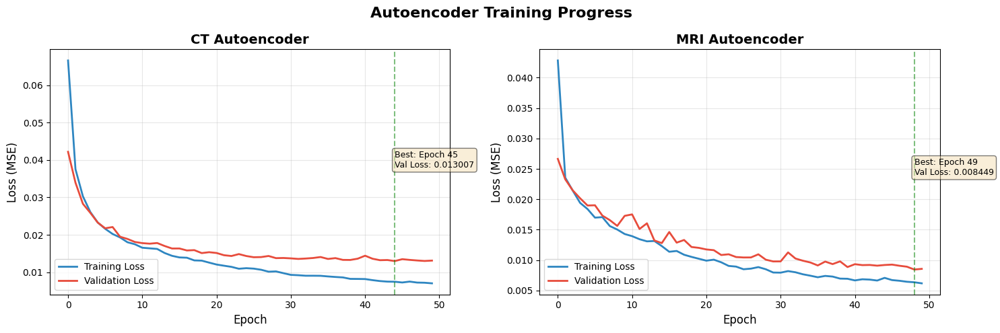


Training Summary:
CT Autoencoder:
  Final Training Loss:   0.007057
  Final Validation Loss: 0.013132
  Best Validation Loss:  0.013007 (Epoch 45)
  Overfitting Gap:       0.006074

MRI Autoencoder:
  Final Training Loss:   0.006180
  Final Validation Loss: 0.008558
  Best Validation Loss:  0.008449 (Epoch 49)
  Overfitting Gap:       0.002378


In [25]:
# ============================================
# VISUALIZE TRAINING CURVES - AUTOENCODERS
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Autoencoder Training Progress', fontsize=16, fontweight='bold')

# CT Autoencoder
axes[0].plot(ct_ae_train_losses, label='Training Loss', linewidth=2, color='#2E86C1')
axes[0].plot(ct_ae_val_losses, label='Validation Loss', linewidth=2, color='#E74C3C')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Loss (MSE)', fontsize=12)
axes[0].set_title('CT Autoencoder', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=10)
axes[0].grid(True, alpha=0.3)

# Add convergence annotation
min_val_loss_idx = np.argmin(ct_ae_val_losses)
axes[0].axvline(x=min_val_loss_idx, color='green', linestyle='--', alpha=0.5)
axes[0].text(min_val_loss_idx, max(ct_ae_val_losses)*0.9,
            f'Best: Epoch {min_val_loss_idx+1}\nVal Loss: {ct_ae_val_losses[min_val_loss_idx]:.6f}',
            fontsize=9, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# MRI Autoencoder
axes[1].plot(mri_ae_train_losses, label='Training Loss', linewidth=2, color='#2E86C1')
axes[1].plot(mri_ae_val_losses, label='Validation Loss', linewidth=2, color='#E74C3C')
axes[1].set_xlabel('Epoch', fontsize=12)
axes[1].set_ylabel('Loss (MSE)', fontsize=12)
axes[1].set_title('MRI Autoencoder', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(True, alpha=0.3)

# Add convergence annotation
min_val_loss_idx = np.argmin(mri_ae_val_losses)
axes[1].axvline(x=min_val_loss_idx, color='green', linestyle='--', alpha=0.5)
axes[1].text(min_val_loss_idx, max(mri_ae_val_losses)*0.9,
            f'Best: Epoch {min_val_loss_idx+1}\nVal Loss: {mri_ae_val_losses[min_val_loss_idx]:.6f}',
            fontsize=9, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

plt.tight_layout()
plt.show()

# Print final statistics
print("\nTraining Summary:")
print("="*70)
print(f"CT Autoencoder:")
print(f"  Final Training Loss:   {ct_ae_train_losses[-1]:.6f}")
print(f"  Final Validation Loss: {ct_ae_val_losses[-1]:.6f}")
print(f"  Best Validation Loss:  {min(ct_ae_val_losses):.6f} (Epoch {np.argmin(ct_ae_val_losses)+1})")
print(f"  Overfitting Gap:       {abs(ct_ae_train_losses[-1] - ct_ae_val_losses[-1]):.6f}")

print(f"\nMRI Autoencoder:")
print(f"  Final Training Loss:   {mri_ae_train_losses[-1]:.6f}")
print(f"  Final Validation Loss: {mri_ae_val_losses[-1]:.6f}")
print(f"  Best Validation Loss:  {min(mri_ae_val_losses):.6f} (Epoch {np.argmin(mri_ae_val_losses)+1})")
print(f"  Overfitting Gap:       {abs(mri_ae_train_losses[-1] - mri_ae_val_losses[-1]):.6f}")
print("="*70)


### 6.2 Train VAEs for CT and MRI

In [26]:
# Initialize VAE models
ct_vae = VAE(img_size=IMG_SIZE, latent_dim=LATENT_DIM)
mri_vae = VAE(img_size=IMG_SIZE, latent_dim=LATENT_DIM)

# Train CT VAE
print("\n" + "="*70)
print("TRAINING CT VAE")
print("="*70)
ct_vae_train_losses, ct_vae_val_losses, ct_vae_recon_losses, ct_vae_kl_losses = train_vae(
    ct_vae, train_loader, val_loader,
    epochs=EPOCHS, lr=LEARNING_RATE, beta=BETA_VAE, modality='CT'
)

print("\n" + "="*70)
print("TRAINING MRI VAE")
print("="*70)
mri_vae_train_losses, mri_vae_val_losses, mri_vae_recon_losses, mri_vae_kl_losses = train_vae(
    mri_vae, train_loader, val_loader,
    epochs=EPOCHS, lr=LEARNING_RATE, beta=BETA_VAE, modality='MRI'
)


TRAINING CT VAE
Epoch [10/50], Train Loss: 423.238385, Val Loss: 434.760758
Epoch [20/50], Train Loss: 336.283531, Val Loss: 376.741968
Epoch [30/50], Train Loss: 285.421362, Val Loss: 355.044908
Epoch [40/50], Train Loss: 253.105755, Val Loss: 336.414140
Epoch [50/50], Train Loss: 232.519207, Val Loss: 331.183908

TRAINING MRI VAE
Epoch [10/50], Train Loss: 342.791157, Val Loss: 359.551533
Epoch [20/50], Train Loss: 272.683341, Val Loss: 297.601463
Epoch [30/50], Train Loss: 226.619458, Val Loss: 261.625401
Epoch [40/50], Train Loss: 203.965880, Val Loss: 252.259837
Epoch [50/50], Train Loss: 185.100904, Val Loss: 230.665391


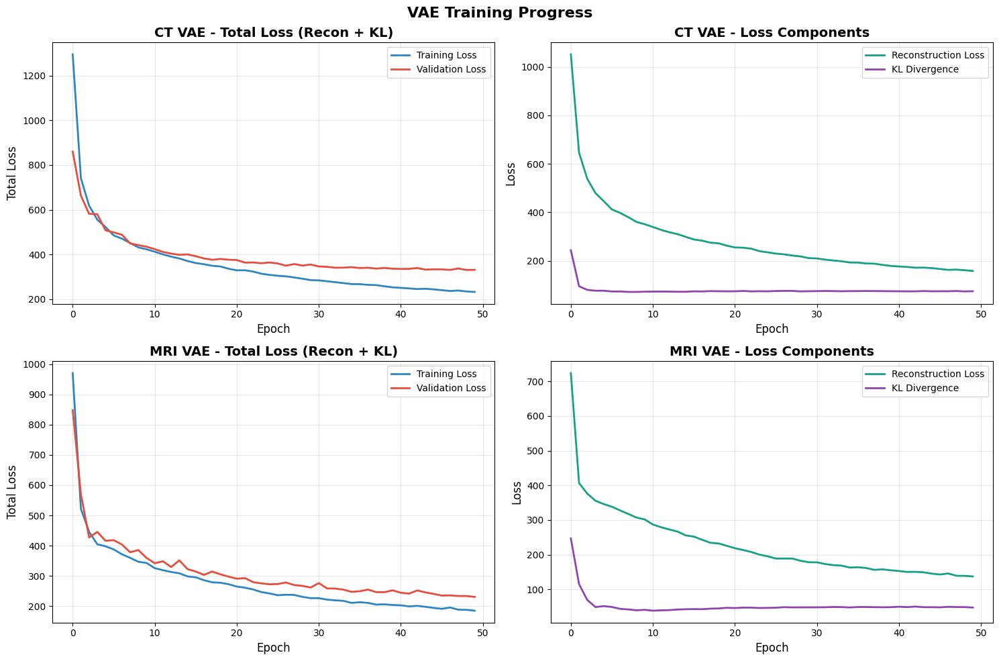


VAE Training Summary:
CT VAE:
  Final Total Loss:      232.519207
  Final Recon Loss:      158.142810
  Final KL Divergence:   74.376398
  Best Validation Loss:  330.764857 (Epoch 49)

MRI VAE:
  Final Total Loss:      185.100904
  Final Recon Loss:      137.375901
  Final KL Divergence:   47.725003
  Best Validation Loss:  230.665391 (Epoch 50)


In [27]:
# ============================================
# VISUALIZE TRAINING CURVES - VAEs
# ============================================

fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('VAE Training Progress', fontsize=16, fontweight='bold')

# CT VAE - Total Loss
axes[0, 0].plot(ct_vae_train_losses, label='Training Loss', linewidth=2, color='#2E86C1')
axes[0, 0].plot(ct_vae_val_losses, label='Validation Loss', linewidth=2, color='#E74C3C')
axes[0, 0].set_xlabel('Epoch', fontsize=12)
axes[0, 0].set_ylabel('Total Loss', fontsize=12)
axes[0, 0].set_title('CT VAE - Total Loss (Recon + KL)', fontsize=14, fontweight='bold')
axes[0, 0].legend(fontsize=10)
axes[0, 0].grid(True, alpha=0.3)

# CT VAE - Components
axes[0, 1].plot(ct_vae_recon_losses, label='Reconstruction Loss', linewidth=2, color='#16A085')
axes[0, 1].plot(ct_vae_kl_losses, label='KL Divergence', linewidth=2, color='#8E44AD')
axes[0, 1].set_xlabel('Epoch', fontsize=12)
axes[0, 1].set_ylabel('Loss', fontsize=12)
axes[0, 1].set_title('CT VAE - Loss Components', fontsize=14, fontweight='bold')
axes[0, 1].legend(fontsize=10)
axes[0, 1].grid(True, alpha=0.3)

# MRI VAE - Total Loss
axes[1, 0].plot(mri_vae_train_losses, label='Training Loss', linewidth=2, color='#2E86C1')
axes[1, 0].plot(mri_vae_val_losses, label='Validation Loss', linewidth=2, color='#E74C3C')
axes[1, 0].set_xlabel('Epoch', fontsize=12)
axes[1, 0].set_ylabel('Total Loss', fontsize=12)
axes[1, 0].set_title('MRI VAE - Total Loss (Recon + KL)', fontsize=14, fontweight='bold')
axes[1, 0].legend(fontsize=10)
axes[1, 0].grid(True, alpha=0.3)

# MRI VAE - Components
axes[1, 1].plot(mri_vae_recon_losses, label='Reconstruction Loss', linewidth=2, color='#16A085')
axes[1, 1].plot(mri_vae_kl_losses, label='KL Divergence', linewidth=2, color='#8E44AD')
axes[1, 1].set_xlabel('Epoch', fontsize=12)
axes[1, 1].set_ylabel('Loss', fontsize=12)
axes[1, 1].set_title('MRI VAE - Loss Components', fontsize=14, fontweight='bold')
axes[1, 1].legend(fontsize=10)
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Print final statistics
print("\nVAE Training Summary:")
print("="*70)
print(f"CT VAE:")
print(f"  Final Total Loss:      {ct_vae_train_losses[-1]:.6f}")
print(f"  Final Recon Loss:      {ct_vae_recon_losses[-1]:.6f}")
print(f"  Final KL Divergence:   {ct_vae_kl_losses[-1]:.6f}")
print(f"  Best Validation Loss:  {min(ct_vae_val_losses):.6f} (Epoch {np.argmin(ct_vae_val_losses)+1})")

print(f"\nMRI VAE:")
print(f"  Final Total Loss:      {mri_vae_train_losses[-1]:.6f}")
print(f"  Final Recon Loss:      {mri_vae_recon_losses[-1]:.6f}")
print(f"  Final KL Divergence:   {mri_vae_kl_losses[-1]:.6f}")
print(f"  Best Validation Loss:  {min(mri_vae_val_losses):.6f} (Epoch {np.argmin(mri_vae_val_losses)+1})")
print("="*70)


### 6.3 Train Cross-Modal Autoencoder

In [28]:
# Initialize cross-modal model
cross_modal_ae = CrossModalAutoencoder(img_size=IMG_SIZE, latent_dim=LATENT_DIM)

# Train cross-modal autoencoder
print("\n" + "="*70)
print("TRAINING CROSS-MODAL AUTOENCODER")
print("="*70)
cm_train_losses, cm_val_losses = train_cross_modal(
    cross_modal_ae, train_loader, val_loader,
    epochs=EPOCHS, lr=LEARNING_RATE
)


TRAINING CROSS-MODAL AUTOENCODER
Epoch [10/50], Train Loss: 0.157686, Val Loss: 0.249883
Epoch [20/50], Train Loss: 0.109194, Val Loss: 0.137548
Epoch [30/50], Train Loss: 0.079203, Val Loss: 0.110805
Epoch [40/50], Train Loss: 0.058361, Val Loss: 0.099224
Epoch [50/50], Train Loss: 0.044425, Val Loss: 0.097110


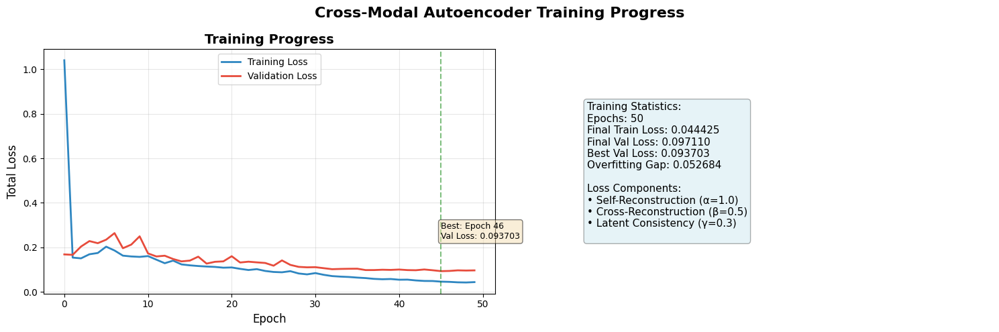


Cross-Modal Training Summary:
Total Epochs: 50
Final Training Loss:   0.044425
Final Validation Loss: 0.097110
Best Validation Loss:  0.093703 (Epoch 46)
Overfitting Gap:       0.052684

Note: Total loss includes self-recon, cross-recon, and latent consistency


In [29]:
# ============================================
# VISUALIZE TRAINING CURVES - CROSS-MODAL
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Cross-Modal Autoencoder Training Progress', fontsize=16, fontweight='bold')

# Loss curves
axes[0].plot(cm_train_losses, label='Training Loss', linewidth=2, color='#2E86C1')
axes[0].plot(cm_val_losses, label='Validation Loss', linewidth=2, color='#E74C3C')
axes[0].set_xlabel('Epoch', fontsize=12)
axes[0].set_ylabel('Total Loss', fontsize=12)
axes[0].set_title('Training Progress', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=10)
axes[0].grid(True, alpha=0.3)

# Add convergence annotation
min_val_loss_idx = np.argmin(cm_val_losses)
axes[0].axvline(x=min_val_loss_idx, color='green', linestyle='--', alpha=0.5)
axes[0].text(min_val_loss_idx, max(cm_val_losses)*0.9,
            f'Best: Epoch {min_val_loss_idx+1}\nVal Loss: {cm_val_losses[min_val_loss_idx]:.6f}',
            fontsize=9, bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# Training statistics
epochs = len(cm_train_losses)
final_train = cm_train_losses[-1]
final_val = cm_val_losses[-1]
best_val = min(cm_val_losses)
overfitting_gap = abs(final_train - final_val)

stats_text = f"""Training Statistics:
Epochs: {epochs}
Final Train Loss: {final_train:.6f}
Final Val Loss: {final_val:.6f}
Best Val Loss: {best_val:.6f}
Overfitting Gap: {overfitting_gap:.6f}

Loss Components:
• Self-Reconstruction (α=1.0)
• Cross-Reconstruction (β=0.5)
• Latent Consistency (γ=0.3)
"""

axes[1].text(0.1, 0.5, stats_text, fontsize=11, verticalalignment='center',
            bbox=dict(boxstyle='round', facecolor='lightblue', alpha=0.3))
axes[1].axis('off')

plt.tight_layout()
plt.show()

# Print final statistics
print("\nCross-Modal Training Summary:")
print("="*70)
print(f"Total Epochs: {epochs}")
print(f"Final Training Loss:   {final_train:.6f}")
print(f"Final Validation Loss: {final_val:.6f}")
print(f"Best Validation Loss:  {best_val:.6f} (Epoch {min_val_loss_idx+1})")
print(f"Overfitting Gap:       {overfitting_gap:.6f}")
print("\nNote: Total loss includes self-recon, cross-recon, and latent consistency")
print("="*70)


---

## 7. Anomaly Detection Methods

### 7.1 Method 1: Reconstruction Error-Based Detection

**Principle:** Autoencoders trained on normal images reconstruct normal patterns well but fail on anomalies.

**How It Works:**
1. Pass test image through trained autoencoder
2. Get reconstructed image
3. Compute pixel-wise difference: error = |original - reconstructed|
4. Aggregate to single score (e.g., mean squared error)

**Anomaly Score Computation:**
- Calculate MSE between original and reconstructed image
- Higher error = More likely to be anomaly
- Lower error = More likely to be normal

**Why This Works:**
- Model only saw normal images during training
- Learned to compress and reconstruct normal patterns efficiently
- Anomalies (tumors, lesions) are unfamiliar patterns
- Model cannot reconstruct unfamiliar patterns well
- High reconstruction error signals anomaly

**Threshold Selection:**
- Compute errors on validation set (normal images only)
- Set threshold at high percentile (e.g., 95th percentile)
- Scores above threshold → classified as anomaly

**Best For:**
- Simple and interpretable
- Works well when anomalies have distinct visual appearance
- Good baseline method

---


In [37]:
def compute_reconstruction_errors(model, data_loader, modality='CT'):
    """
    Compute reconstruction errors for anomaly detection.

    This function evaluates how well the model can reconstruct images.
    High reconstruction error indicates the image is likely anomalous.

    Args:
        model: Trained autoencoder or VAE
        data_loader: Data loader containing test images
        modality: 'CT' or 'MRI' - which modality to evaluate

    Returns:
        errors: List of reconstruction errors (one per image)
                Higher error = More anomalous
    """

    # ========================================
    # SETUP
    # ========================================

    model.eval()  # Set to evaluation mode (disable dropout, use running batch norm stats)
    errors = []  # Store reconstruction error for each image

    # ========================================
    # COMPUTE RECONSTRUCTION ERRORS
    # ========================================

    # Disable gradient computation (saves memory, faster)
    with torch.no_grad():

        # Iterate through all test images
        for ct_batch, mri_batch, _ in data_loader:

            # ====================================
            # SELECT MODALITY
            # ====================================

            # Choose which modality to evaluate
            if modality == 'CT':
                images = ct_batch.to(device)
            else:
                images = mri_batch.to(device)

            # ====================================
            # FORWARD PASS
            # ====================================

            # Get reconstructed images from model
            # For VAE: model returns (reconstruction, mu, logvar)
            # For standard AE: model returns reconstruction only
            outputs = model(images)

            # Handle different model return types
            if isinstance(outputs, tuple):
                # VAE returns tuple: (reconstruction, mu, logvar)
                reconstructed = outputs[0]
            else:
                # Standard autoencoder returns reconstruction directly
                reconstructed = outputs

            # ====================================
            # COMPUTE PIXEL-WISE ERROR
            # ====================================

            # Calculate Mean Squared Error per image
            # Shape: (batch_size, channels, height, width)
            # We compute MSE for each image separately

            # Method 1: Batch-wise MSE
            # Compute error for each pixel, then average over spatial dimensions
            batch_errors = torch.mean((images - reconstructed) ** 2, dim=[1, 2, 3])
            # Result shape: (batch_size,) - one error value per image

            # Alternative Method 2: L1 error (Mean Absolute Error)
            # batch_errors = torch.mean(torch.abs(images - reconstructed), dim=[1, 2, 3])

            # Alternative Method 3: Max error (for localized anomalies)
            # batch_errors = torch.amax((images - reconstructed) ** 2, dim=[1, 2, 3])

            # ====================================
            # STORE ERRORS
            # ====================================

            # Move to CPU and convert to numpy
            batch_errors = batch_errors.cpu().numpy()

            # Add to list of all errors
            errors.extend(batch_errors)

    # ========================================
    # RETURN ANOMALY SCORES
    # ========================================

    # Convert to numpy array for easier analysis
    errors = np.array(errors)

    # Interpretation:
    # - Low error (~0.001-0.01): Normal image, well reconstructed
    # - Medium error (~0.05-0.1): Borderline, needs threshold
    # - High error (>0.1): Likely anomaly, poor reconstruction

    return errors


# ============================================
# EXECUTE: COMPUTE RECONSTRUCTION ERRORS
# ============================================

print("Computing reconstruction errors on test set...")

# Compute errors for Autoencoders
print("\nAutoencoder-based scores:")
ct_ae_errors = compute_reconstruction_errors(ct_autoencoder, test_loader, modality='CT')
mri_ae_errors = compute_reconstruction_errors(mri_autoencoder, test_loader, modality='MRI')

print(f"CT AE  - Mean: {ct_ae_errors.mean():.6f}, Std: {ct_ae_errors.std():.6f}, "
      f"Min: {ct_ae_errors.min():.6f}, Max: {ct_ae_errors.max():.6f}")
print(f"MRI AE - Mean: {mri_ae_errors.mean():.6f}, Std: {mri_ae_errors.std():.6f}, "
      f"Min: {mri_ae_errors.min():.6f}, Max: {mri_ae_errors.max():.6f}")

# Compute errors for VAEs
print("\nVAE-based scores:")
ct_vae_errors = compute_reconstruction_errors(ct_vae, test_loader, modality='CT')
mri_vae_errors = compute_reconstruction_errors(mri_vae, test_loader, modality='MRI')

print(f"CT VAE  - Mean: {ct_vae_errors.mean():.6f}, Std: {ct_vae_errors.std():.6f}")
print(f"MRI VAE - Mean: {mri_vae_errors.mean():.6f}, Std: {mri_vae_errors.std():.6f}")


Computing reconstruction errors on test set...

Autoencoder-based scores:
CT AE  - Mean: 0.013383, Std: 0.011589, Min: 0.002077, Max: 0.069908
MRI AE - Mean: 0.008055, Std: 0.006779, Min: 0.001293, Max: 0.050253

VAE-based scores:
CT VAE  - Mean: 0.016460, Std: 0.011062
MRI VAE - Mean: 0.010863, Std: 0.008517


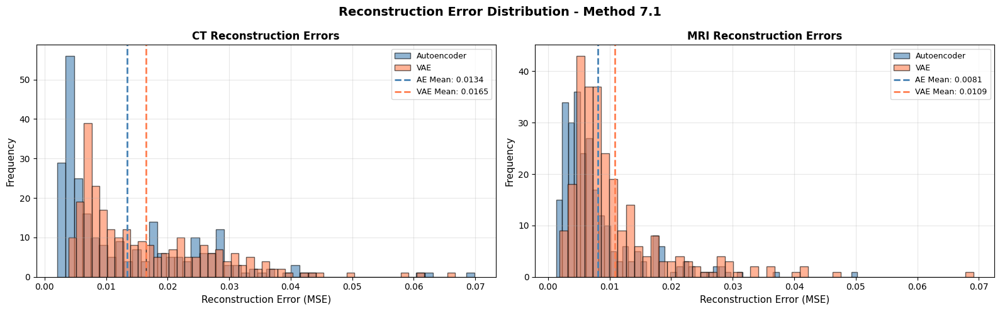


Interpretation:
- Lower reconstruction error → better reconstruction → more 'normal'
- Anomalies have higher reconstruction errors (right tail of distribution)
- Threshold typically set at mean + k*std (e.g., k=2 or 3) to flag anomalies


In [38]:
# ============================================
# VISUALIZE RECONSTRUCTION ERROR DISTRIBUTION
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Reconstruction Error Distribution - Method 7.1', fontsize=14, fontweight='bold')

# CT reconstruction errors
axes[0].hist(ct_ae_errors, bins=50, alpha=0.6, label='Autoencoder', color='steelblue', edgecolor='black')
axes[0].hist(ct_vae_errors, bins=50, alpha=0.6, label='VAE', color='coral', edgecolor='black')
axes[0].axvline(ct_ae_errors.mean(), color='steelblue', linestyle='--', linewidth=2,
                label=f'AE Mean: {ct_ae_errors.mean():.4f}')
axes[0].axvline(ct_vae_errors.mean(), color='coral', linestyle='--', linewidth=2,
                label=f'VAE Mean: {ct_vae_errors.mean():.4f}')
axes[0].set_xlabel('Reconstruction Error (MSE)', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[0].set_title('CT Reconstruction Errors', fontsize=12, fontweight='bold')
axes[0].legend(loc='upper right', fontsize=9)
axes[0].grid(True, alpha=0.3)

# MRI reconstruction errors
axes[1].hist(mri_ae_errors, bins=50, alpha=0.6, label='Autoencoder', color='steelblue', edgecolor='black')
axes[1].hist(mri_vae_errors, bins=50, alpha=0.6, label='VAE', color='coral', edgecolor='black')
axes[1].axvline(mri_ae_errors.mean(), color='steelblue', linestyle='--', linewidth=2,
                label=f'AE Mean: {mri_ae_errors.mean():.4f}')
axes[1].axvline(mri_vae_errors.mean(), color='coral', linestyle='--', linewidth=2,
                label=f'VAE Mean: {mri_vae_errors.mean():.4f}')
axes[1].set_xlabel('Reconstruction Error (MSE)', fontsize=11)
axes[1].set_ylabel('Frequency', fontsize=11)
axes[1].set_title('MRI Reconstruction Errors', fontsize=12, fontweight='bold')
axes[1].legend(loc='upper right', fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nInterpretation:")
print("- Lower reconstruction error → better reconstruction → more 'normal'")
print("- Anomalies have higher reconstruction errors (right tail of distribution)")
print("- Threshold typically set at mean + k*std (e.g., k=2 or 3) to flag anomalies")

### 7.2 Method 2: One-Class Learning

**Principle:** Learn the distribution of normal data in latent space, detect anomalies as outliers.

**How It Works:**
1. Extract latent features from encoder (compressed representations)
2. Train one-class classifier on normal latent features only
3. Classifier learns boundary around normal data
4. Test samples outside boundary are classified as anomalies

**Two Approaches:**

**A. One-Class SVM:**
- Learns hypersphere or hyperplane around normal data
- Kernel trick allows complex decision boundaries
- Parameters:
  - kernel='rbf': Radial Basis Function for non-linear boundaries
  - nu=0.1: Expected fraction of outliers (10%)
  - gamma='auto': Kernel coefficient
- Decision function: Higher score = More normal

**B. Isolation Forest:**
- Builds random trees to isolate data points
- Anomalies are easier to isolate (fewer splits needed)
- Parameters:
  - contamination=0.1: Expected fraction of anomalies
  - n_estimators=100: Number of trees
- Anomaly score: Lower score = More anomalous

**Why This Works:**
- Latent space is lower-dimensional and more structured
- Normal samples cluster together in latent space
- Anomalies appear as outliers away from cluster
- One-class methods are designed for this scenario

**Advantages:**
- Robust to small variations in normal data
- Can capture complex distributions
- Isolation Forest is fast and scalable

**Best For:**
- When latent space has clear clustering
- When you want to combine with reconstruction error
- Ensemble approach (multiple methods)

---


In [39]:
def extract_features(model, data_loader, modality='CT'):
    """
    Extract latent features from encoder for one-class learning.

    The encoder compresses images to low-dimensional latent vectors.
    These latent features capture the essential characteristics of images.
    We use these features to train one-class classifiers (SVM, Isolation Forest).

    Args:
        model: Trained autoencoder or VAE
        data_loader: Data loader
        modality: 'CT' or 'MRI'

    Returns:
        features: Numpy array of shape (num_samples, latent_dim)
                  Each row is the latent representation of one image
    """

    # ========================================
    # SETUP
    # ========================================

    model.eval()  # Evaluation mode
    features = []  # Store latent vectors

    # ========================================
    # EXTRACT LATENT FEATURES
    # ========================================

    with torch.no_grad():
        for ct_batch, mri_batch, _ in data_loader:

            # ====================================
            # SELECT MODALITY
            # ====================================

            if modality == 'CT':
                images = ct_batch.to(device)
            else:
                images = mri_batch.to(device)

            # ====================================
            # ENCODE TO LATENT SPACE
            # ====================================

            # Use encoder to get latent representation
            # Different models have different encode methods:

            if hasattr(model, 'encode'):
                # Models with explicit encode() method
                # - ConvAutoencoder: returns z (latent vector)
                # - VAE: returns (mu, logvar)
                encoded = model.encode(images)

                # Handle VAE which returns (mu, logvar)
                if isinstance(encoded, tuple):
                    # For VAE: use mean (mu) as latent representation
                    # mu represents the center of latent distribution
                    latent = encoded[0]  # mu
                else:
                    # For standard autoencoder
                    latent = encoded
            else:
                # For models without encode method, do full forward pass
                # and extract latent from middle layer (not recommended)
                raise AttributeError("Model must have encode() method")

            # ====================================
            # STORE FEATURES
            # ====================================

            # Move to CPU and convert to numpy
            latent = latent.cpu().numpy()

            # Add to feature list
            # latent shape: (batch_size, latent_dim)
            features.append(latent)

    # ========================================
    # CONCATENATE AND RETURN
    # ========================================

    # Concatenate all batches into single array
    # Shape: (total_samples, latent_dim)
    # Example: (1000 images, 128 dimensions)
    features = np.concatenate(features, axis=0)

    # Why latent features work for anomaly detection:
    # - Normal images cluster together in latent space
    # - Anomalies appear as outliers
    # - Lower dimensional (128) than original image (128×128=16384)
    # - Captures semantic features, ignores noise

    return features


In [40]:
# ============================================
# ONE-CLASS LEARNING: SVM & ISOLATION FOREST
# ============================================

# First, extract latent features from trained models
# These features will be used to train one-class classifiers

# ========================================
# EXTRACT FEATURES FROM TRAINING SET
# ========================================

# Extract features from normal training data
# One-class methods learn the distribution of NORMAL data only
print("Extracting features from training set (normal data)...")
ct_train_features = extract_features(ct_autoencoder, train_loader, modality='CT')
mri_train_features = extract_features(mri_autoencoder, train_loader, modality='MRI')

print(f"CT features shape: {ct_train_features.shape}")  # (num_samples, latent_dim)
print(f"MRI features shape: {mri_train_features.shape}")

# ========================================
# EXTRACT FEATURES FROM TEST SET
# ========================================

# Extract features from test data (contains anomalies)
print("\nExtracting features from test set...")
ct_test_features = extract_features(ct_autoencoder, test_loader, modality='CT')
mri_test_features = extract_features(mri_autoencoder, test_loader, modality='MRI')

# ========================================
# TRAIN ONE-CLASS SVM
# ========================================

print("\nTraining One-Class SVM...")

# Initialize One-Class SVM classifiers
# Parameters:
#   kernel='rbf': Radial Basis Function kernel for non-linear decision boundary
#                 Allows SVM to learn complex shapes around normal data
#   gamma='auto': Kernel coefficient, auto = 1/n_features
#                 Controls smoothness of decision boundary
#   nu=0.1: Upper bound on fraction of training errors (10%)
#           Also lower bound on fraction of support vectors
#           Tune based on expected outlier rate

ct_ocsvm = OneClassSVM(kernel='rbf', gamma='auto', nu=0.1)
mri_ocsvm = OneClassSVM(kernel='rbf', gamma='auto', nu=0.1)

# Fit on NORMAL training features only
# SVM learns hypersphere enclosing normal data
ct_ocsvm.fit(ct_train_features)
mri_ocsvm.fit(mri_train_features)

print("One-Class SVM training complete.")

# ========================================
# PREDICT ANOMALY SCORES (ONE-CLASS SVM)
# ========================================

# Compute decision function on test set
# decision_function returns signed distance to decision boundary:
#   Positive (>0): Inside normal region → Normal
#   Negative (<0): Outside normal region → Anomaly
#   Magnitude: How far from boundary (confidence)

ct_ocsvm_scores = ct_ocsvm.decision_function(ct_test_features)
mri_ocsvm_scores = mri_ocsvm.decision_function(mri_test_features)

# Convert to anomaly scores (higher = more anomalous)
# Negate decision function: anomaly_score = -decision_function
ct_ocsvm_anomaly_scores = -ct_ocsvm_scores  # Higher = More anomalous
mri_ocsvm_anomaly_scores = -mri_ocsvm_scores

print(f"CT One-Class SVM scores computed: {len(ct_ocsvm_anomaly_scores)} samples")
print(f"MRI One-Class SVM scores computed: {len(mri_ocsvm_anomaly_scores)} samples")

# ========================================
# TRAIN ISOLATION FOREST
# ========================================

print("\nTraining Isolation Forest...")

# Initialize Isolation Forest classifiers
# Parameters:
#   contamination=0.1: Expected proportion of outliers (10%)
#                      Used to define decision threshold
#   n_estimators=100: Number of isolation trees to build
#                     More trees = more stable but slower
#   random_state=42: For reproducibility
#   max_samples='auto': Number of samples to draw (default: min(256, n_samples))

ct_iforest = IsolationForest(contamination=0.1, n_estimators=100, random_state=42)
mri_iforest = IsolationForest(contamination=0.1, n_estimators=100, random_state=42)

# Fit on normal training features
# Isolation Forest builds random trees to isolate points
# Anomalies are easier to isolate (shorter path length)
ct_iforest.fit(ct_train_features)
mri_iforest.fit(mri_train_features)

print("Isolation Forest training complete.")

# ========================================
# PREDICT ANOMALY SCORES (ISOLATION FOREST)
# ========================================

# Compute anomaly scores on test set
# score_samples returns anomaly score:
#   Higher score (closer to 0): More normal
#   Lower score (more negative): More anomalous
#   Based on average path length in isolation trees

ct_iforest_scores = ct_iforest.score_samples(ct_test_features)
mri_iforest_scores = mri_iforest.score_samples(mri_test_features)

# Convert to anomaly scores (higher = more anomalous)
# Negate scores: anomaly_score = -score
ct_iforest_anomaly_scores = -ct_iforest_scores  # Higher = More anomalous
mri_iforest_anomaly_scores = -mri_iforest_scores

print(f"CT Isolation Forest scores computed: {len(ct_iforest_anomaly_scores)} samples")
print(f"MRI Isolation Forest scores computed: {len(mri_iforest_anomaly_scores)} samples")

# ========================================
# INTERPRETATION
# ========================================

print("\n" + "="*60)
print("One-Class Learning Complete")
print("="*60)
print("\nHow to use these scores:")
print("1. Set threshold based on validation set")
print("2. Scores above threshold → Anomaly")
print("3. Can combine with reconstruction error for better detection")
print("4. Can use as features for ensemble methods")
print("="*60)


Extracting features from training set (normal data)...
CT features shape: (1219, 128)
MRI features shape: (1219, 128)

Extracting features from test set...

Training One-Class SVM...
One-Class SVM training complete.
CT One-Class SVM scores computed: 262 samples
MRI One-Class SVM scores computed: 262 samples

Training Isolation Forest...
Isolation Forest training complete.
CT Isolation Forest scores computed: 262 samples
MRI Isolation Forest scores computed: 262 samples

One-Class Learning Complete

How to use these scores:
1. Set threshold based on validation set
2. Scores above threshold → Anomaly
3. Can combine with reconstruction error for better detection
4. Can use as features for ensemble methods


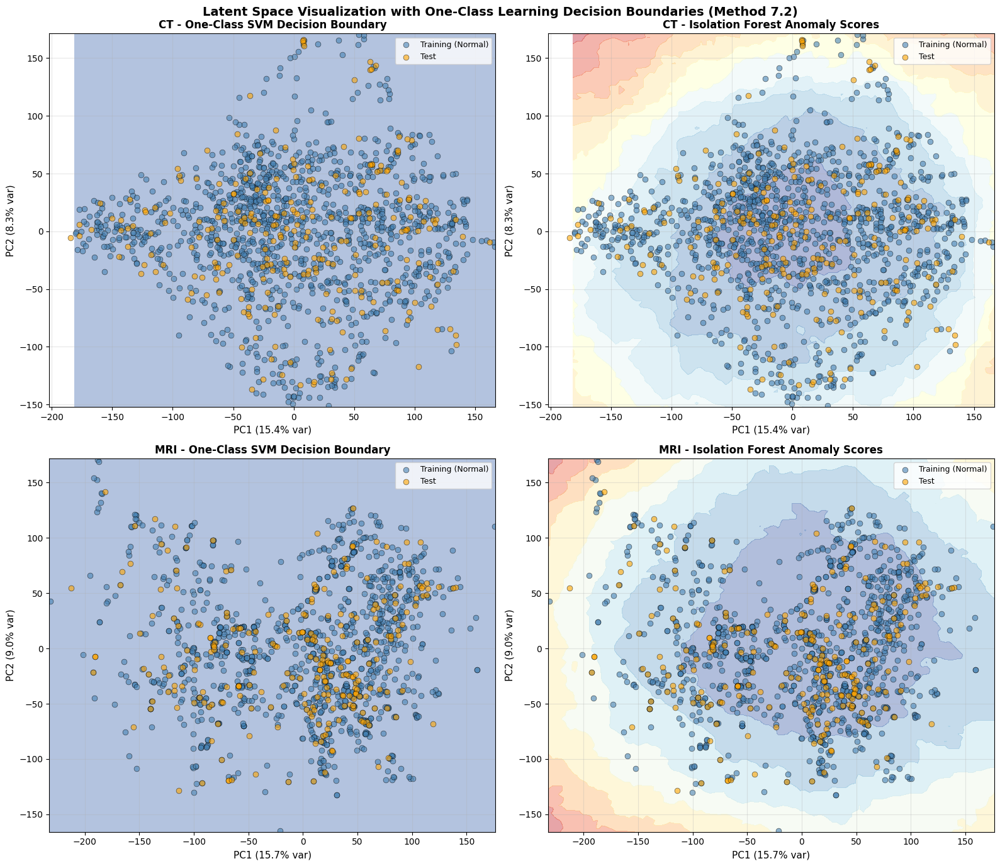


Interpretation:
- Red dashed line shows OCSVM decision boundary (inside = normal, outside = anomaly)
- Color intensity shows anomaly score (red = more anomalous for OCSVM, blue = more normal for IF)
- Test points outside the normal region indicate potential anomalies
- This visualization is for METHOD 7.2 (unsupervised, no ground truth labels needed)


In [41]:
# ============================================
# VISUALIZE LATENT SPACE & DECISION BOUNDARY
# ============================================

from sklearn.decomposition import PCA

# Reduce latent features to 2D using PCA for visualization
pca_ct = PCA(n_components=2, random_state=SEED)
ct_train_2d = pca_ct.fit_transform(ct_train_features)
ct_test_2d = pca_ct.transform(ct_test_features)

pca_mri = PCA(n_components=2, random_state=SEED)
mri_train_2d = pca_mri.fit_transform(mri_train_features)
mri_test_2d = pca_mri.transform(mri_test_features)

fig, axes = plt.subplots(2, 2, figsize=(16, 14))
fig.suptitle('Latent Space Visualization with One-Class Learning Decision Boundaries (Method 7.2)',
             fontsize=14, fontweight='bold')

# ============================================
# CT - One-Class SVM
# ============================================
ax = axes[0, 0]

# Create decision boundary mesh
xx, yy = np.meshgrid(np.linspace(ct_train_2d[:, 0].min()-1, ct_train_2d[:, 0].max()+1, 100),
                     np.linspace(ct_train_2d[:, 1].min()-1, ct_train_2d[:, 1].max()+1, 100))
grid_2d = np.c_[xx.ravel(), yy.ravel()]

# Transform back to original latent space for OCSVM
grid_latent = pca_ct.inverse_transform(grid_2d)
Z = ct_ocsvm.decision_function(grid_latent)
Z = Z.reshape(xx.shape)

# Plot decision boundary
ax.contourf(xx, yy, Z, levels=np.linspace(Z.min(), 0, 7), cmap='RdYlBu_r', alpha=0.4)
ax.contour(xx, yy, Z, levels=[0], linewidths=2, colors='red', linestyles='--')

# Plot data points
ax.scatter(ct_train_2d[:, 0], ct_train_2d[:, 1], c='steelblue', s=40, alpha=0.6,
           label='Training (Normal)', edgecolors='k', linewidths=0.5)
ax.scatter(ct_test_2d[:, 0], ct_test_2d[:, 1], c='orange', s=40, alpha=0.6,
           label='Test', edgecolors='k', linewidths=0.5)

ax.set_xlabel(f'PC1 ({pca_ct.explained_variance_ratio_[0]*100:.1f}% var)', fontsize=11)
ax.set_ylabel(f'PC2 ({pca_ct.explained_variance_ratio_[1]*100:.1f}% var)', fontsize=11)
ax.set_title('CT - One-Class SVM Decision Boundary', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=9)
ax.grid(True, alpha=0.3)

# ============================================
# CT - Isolation Forest
# ============================================
ax = axes[0, 1]

Z_if = ct_iforest.score_samples(grid_latent)
Z_if = Z_if.reshape(xx.shape)

ax.contourf(xx, yy, Z_if, levels=10, cmap='RdYlBu', alpha=0.4)
ax.scatter(ct_train_2d[:, 0], ct_train_2d[:, 1], c='steelblue', s=40, alpha=0.6,
           label='Training (Normal)', edgecolors='k', linewidths=0.5)
ax.scatter(ct_test_2d[:, 0], ct_test_2d[:, 1], c='orange', s=40, alpha=0.6,
           label='Test', edgecolors='k', linewidths=0.5)

ax.set_xlabel(f'PC1 ({pca_ct.explained_variance_ratio_[0]*100:.1f}% var)', fontsize=11)
ax.set_ylabel(f'PC2 ({pca_ct.explained_variance_ratio_[1]*100:.1f}% var)', fontsize=11)
ax.set_title('CT - Isolation Forest Anomaly Scores', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=9)
ax.grid(True, alpha=0.3)

# ============================================
# MRI - One-Class SVM
# ============================================
ax = axes[1, 0]

xx_mri, yy_mri = np.meshgrid(np.linspace(mri_train_2d[:, 0].min()-1, mri_train_2d[:, 0].max()+1, 100),
                             np.linspace(mri_train_2d[:, 1].min()-1, mri_train_2d[:, 1].max()+1, 100))
grid_2d_mri = np.c_[xx_mri.ravel(), yy_mri.ravel()]
grid_latent_mri = pca_mri.inverse_transform(grid_2d_mri)
Z_mri = mri_ocsvm.decision_function(grid_latent_mri)
Z_mri = Z_mri.reshape(xx_mri.shape)

ax.contourf(xx_mri, yy_mri, Z_mri, levels=np.linspace(Z_mri.min(), 0, 7), cmap='RdYlBu_r', alpha=0.4)
ax.contour(xx_mri, yy_mri, Z_mri, levels=[0], linewidths=2, colors='red', linestyles='--')
ax.scatter(mri_train_2d[:, 0], mri_train_2d[:, 1], c='steelblue', s=40, alpha=0.6,
           label='Training (Normal)', edgecolors='k', linewidths=0.5)
ax.scatter(mri_test_2d[:, 0], mri_test_2d[:, 1], c='orange', s=40, alpha=0.6,
           label='Test', edgecolors='k', linewidths=0.5)

ax.set_xlabel(f'PC1 ({pca_mri.explained_variance_ratio_[0]*100:.1f}% var)', fontsize=11)
ax.set_ylabel(f'PC2 ({pca_mri.explained_variance_ratio_[1]*100:.1f}% var)', fontsize=11)
ax.set_title('MRI - One-Class SVM Decision Boundary', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=9)
ax.grid(True, alpha=0.3)

# ============================================
# MRI - Isolation Forest
# ============================================
ax = axes[1, 1]

Z_if_mri = mri_iforest.score_samples(grid_latent_mri)
Z_if_mri = Z_if_mri.reshape(xx_mri.shape)

ax.contourf(xx_mri, yy_mri, Z_if_mri, levels=10, cmap='RdYlBu', alpha=0.4)
ax.scatter(mri_train_2d[:, 0], mri_train_2d[:, 1], c='steelblue', s=40, alpha=0.6,
           label='Training (Normal)', edgecolors='k', linewidths=0.5)
ax.scatter(mri_test_2d[:, 0], mri_test_2d[:, 1], c='orange', s=40, alpha=0.6,
           label='Test', edgecolors='k', linewidths=0.5)

ax.set_xlabel(f'PC1 ({pca_mri.explained_variance_ratio_[0]*100:.1f}% var)', fontsize=11)
ax.set_ylabel(f'PC2 ({pca_mri.explained_variance_ratio_[1]*100:.1f}% var)', fontsize=11)
ax.set_title('MRI - Isolation Forest Anomaly Scores', fontsize=12, fontweight='bold')
ax.legend(loc='best', fontsize=9)
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nInterpretation:")
print("- Red dashed line shows OCSVM decision boundary (inside = normal, outside = anomaly)")
print("- Color intensity shows anomaly score (red = more anomalous for OCSVM, blue = more normal for IF)")
print("- Test points outside the normal region indicate potential anomalies")
print("- This visualization is for METHOD 7.2 (unsupervised, no ground truth labels needed)")


### 7.3 Method 3: Cross-Modal Consistency Detection

**Principle:** CT and MRI of the same anatomy should produce consistent latent representations. Inconsistency signals anomaly.

**How It Works:**
1. Pass CT image through CT encoder → get z_ct
2. Pass MRI image through MRI encoder → get z_mri
3. Compute distance between latent vectors: distance = ||z_ct - z_mri||
4. Large distance = Inconsistency = Potential anomaly

**Why This Works:**
- During training, model learned that CT and MRI encode same anatomy
- For normal brain: z_ct ≈ z_mri (similar latent codes)
- For anomaly: Different appearance in CT vs MRI
  - Example: Hemorrhage appears bright in CT, dark in MRI
  - This causes z_ct ≠ z_mri (inconsistent latent codes)

**Latent Divergence Score:**
- L2 distance: sqrt(sum((z_ct - z_mri)^2))
- Higher divergence = More likely anomaly
- Lower divergence = Consistent, likely normal

**Additional Score: Cross-Modal Reconstruction Error:**
- Try to reconstruct MRI from CT latent: error_ct2mri
- Try to reconstruct CT from MRI latent: error_mri2ct
- If latents are inconsistent, cross-reconstruction fails
- High cross-reconstruction error = Anomaly

**Advantages:**
- Leverages multi-modal information
- Can detect anomalies that appear in only one modality
- More robust than single-modality methods

**Best For:**
- When you have paired CT-MRI data
- Detecting modality-specific anomalies
- Combining with other detection methods

**Limitations:**
- Requires both CT and MRI (not always available)
- Requires good image alignment

---


In [43]:
def compute_cross_modal_scores(model, data_loader):
    """
    Compute cross-modal anomaly scores.

    For each CT-MRI pair, compute:
    1. Latent divergence: Distance between CT and MRI latent codes
    2. Cross-reconstruction error: Error when reconstructing across modalities

    Args:
        model: Trained CrossModalAutoencoder
        data_loader: Data loader with CT-MRI pairs

    Returns:
        latent_divergence: L2 distance between z_ct and z_mri (higher = more anomalous)
        cross_recon_error: Cross-modal reconstruction error (higher = more anomalous)
    """

    # ========================================
    # SETUP
    # ========================================

    model.eval()  # Evaluation mode
    latent_divergences = []  # Store latent distance for each pair
    cross_recon_errors = []  # Store cross-reconstruction error for each pair

    # ========================================
    # COMPUTE CROSS-MODAL SCORES
    # ========================================

    with torch.no_grad():

        # Iterate through CT-MRI pairs
        for ct_batch, mri_batch, _ in data_loader:

            # Move to device
            ct = ct_batch.to(device)
            mri = mri_batch.to(device)

            # ====================================
            # 1. ENCODE TO LATENT SPACE
            # ====================================

            # Encode CT and MRI separately to latent vectors
            # For normal anatomy: z_ct and z_mri should be similar
            # For anomaly: z_ct and z_mri will diverge

            z_ct = model.encode_ct(ct)    # CT latent: (batch, latent_dim)
            z_mri = model.encode_mri(mri)  # MRI latent: (batch, latent_dim)

            # ====================================
            # 2. COMPUTE LATENT DIVERGENCE
            # ====================================

            # L2 distance between latent vectors
            # Formula: ||z_ct - z_mri||_2 = sqrt(sum((z_ct - z_mri)^2))
            #
            # Interpretation:
            # - Small distance (~0.1-0.5): Consistent representations → Normal
            # - Large distance (>1.0): Inconsistent representations → Anomaly

            # Compute squared difference
            diff_squared = (z_ct - z_mri) ** 2  # Element-wise squared difference

            # Sum over latent dimensions and take square root
            # Result: one distance value per image pair
            divergence = torch.sqrt(torch.sum(diff_squared, dim=1))
            # Shape: (batch_size,)

            # Alternative: Use L2 norm directly
            # divergence = torch.norm(z_ct - z_mri, p=2, dim=1)

            # Store divergence scores
            latent_divergences.extend(divergence.cpu().numpy())

            # ====================================
            # 3. CROSS-MODAL RECONSTRUCTION
            # ====================================

            # Try to reconstruct MRI from CT latent code
            # If CT latent understands the anatomy, it should be able to
            # generate corresponding MRI appearance
            mri_from_ct = model.decode_mri(z_ct)  # CT latent → MRI decoder

            # Try to reconstruct CT from MRI latent code
            ct_from_mri = model.decode_ct(z_mri)  # MRI latent → CT decoder

            # ====================================
            # 4. COMPUTE CROSS-RECONSTRUCTION ERROR
            # ====================================

            # Compute MSE for cross-modal reconstructions
            #
            # Error 1: How well can CT latent reconstruct MRI?
            error_ct2mri = torch.mean((mri - mri_from_ct) ** 2, dim=[1, 2, 3])

            # Error 2: How well can MRI latent reconstruct CT?
            error_mri2ct = torch.mean((ct - ct_from_mri) ** 2, dim=[1, 2, 3])

            # Combine both errors (average)
            # High cross-reconstruction error indicates inconsistency
            cross_error = (error_ct2mri + error_mri2ct) / 2
            # Shape: (batch_size,)

            # Store cross-reconstruction errors
            cross_recon_errors.extend(cross_error.cpu().numpy())

    # ========================================
    # RETURN ANOMALY SCORES
    # ========================================

    # Convert lists to numpy arrays
    latent_divergences = np.array(latent_divergences)
    cross_recon_errors = np.array(cross_recon_errors)

    # Both scores can be used for anomaly detection:
    # - Higher latent divergence = More anomalous
    # - Higher cross-reconstruction error = More anomalous
    #
    # Can combine scores:
    # combined_score = w1 * latent_divergence + w2 * cross_recon_error

    return latent_divergences, cross_recon_errors


# ============================================
# EXECUTE: COMPUTE CROSS-MODAL SCORES
# ============================================

print("Computing cross-modal anomaly scores...")
latent_div_scores, cross_recon_scores = compute_cross_modal_scores(cross_modal_ae, test_loader)

print(f"Latent Divergence - Mean: {latent_div_scores.mean():.6f}, Std: {latent_div_scores.std():.6f}")
print(f"Cross-Recon Error - Mean: {cross_recon_scores.mean():.6f}, Std: {cross_recon_scores.std():.6f}")


Computing cross-modal anomaly scores...
Latent Divergence - Mean: 1.355377, Std: 0.226106
Cross-Recon Error - Mean: 0.064071, Std: 0.024443


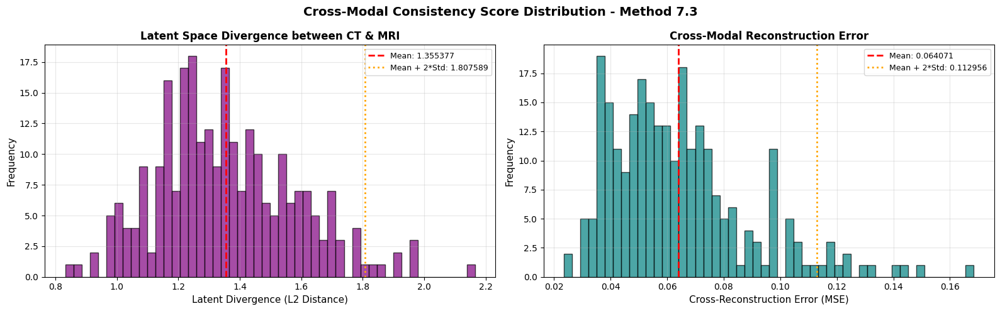


Interpretation:
- Latent Divergence: Measures inconsistency between CT and MRI latent representations
- Cross-Recon Error: How well CT reconstructs from MRI latent code (and vice versa)
- Higher scores → anomalies (inconsistent cross-modal patterns)
- Threshold typically set at mean + 2*std for anomaly detection


In [44]:
# ============================================
# VISUALIZE CROSS-MODAL CONSISTENCY SCORES
# ============================================

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
fig.suptitle('Cross-Modal Consistency Score Distribution - Method 7.3', fontsize=14, fontweight='bold')

# Latent Divergence
axes[0].hist(latent_div_scores, bins=50, alpha=0.7, color='purple', edgecolor='black')
axes[0].axvline(latent_div_scores.mean(), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {latent_div_scores.mean():.6f}')
axes[0].axvline(latent_div_scores.mean() + 2*latent_div_scores.std(), color='orange',
                linestyle=':', linewidth=2,
                label=f'Mean + 2*Std: {latent_div_scores.mean() + 2*latent_div_scores.std():.6f}')
axes[0].set_xlabel('Latent Divergence (L2 Distance)', fontsize=11)
axes[0].set_ylabel('Frequency', fontsize=11)
axes[0].set_title('Latent Space Divergence between CT & MRI', fontsize=12, fontweight='bold')
axes[0].legend(loc='upper right', fontsize=9)
axes[0].grid(True, alpha=0.3)

# Cross-Reconstruction Error
axes[1].hist(cross_recon_scores, bins=50, alpha=0.7, color='teal', edgecolor='black')
axes[1].axvline(cross_recon_scores.mean(), color='red', linestyle='--', linewidth=2,
                label=f'Mean: {cross_recon_scores.mean():.6f}')
axes[1].axvline(cross_recon_scores.mean() + 2*cross_recon_scores.std(), color='orange',
                linestyle=':', linewidth=2,
                label=f'Mean + 2*Std: {cross_recon_scores.mean() + 2*cross_recon_scores.std():.6f}')
axes[1].set_xlabel('Cross-Reconstruction Error (MSE)', fontsize=11)
axes[1].set_ylabel('Frequency', fontsize=11)
axes[1].set_title('Cross-Modal Reconstruction Error', fontsize=12, fontweight='bold')
axes[1].legend(loc='upper right', fontsize=9)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

print("\nInterpretation:")
print("- Latent Divergence: Measures inconsistency between CT and MRI latent representations")
print("- Cross-Recon Error: How well CT reconstructs from MRI latent code (and vice versa)")
print("- Higher scores → anomalies (inconsistent cross-modal patterns)")
print("- Threshold typically set at mean + 2*std for anomaly detection")

### 7.4 Anomaly Heatmap Generation

**Purpose:** Generate pixel-wise reconstruction error maps to localize anomalies.

**Why Anomaly Heatmaps Are Critical:**

1. **Spatial Localization:** Show WHERE the anomaly is in the image
2. **Clinical Interpretation:** Help radiologists identify affected regions
3. **Explainability:** Visual evidence for anomaly detection decisions
4. **Validation:** Verify if high error corresponds to actual anomaly location

**How Anomaly Heatmaps Work:**

```
For each pixel (i, j):
  Error(i,j) = |Original(i,j) - Reconstructed(i,j)|²

Heatmap shows:
  - Blue/Cold = Low error (normal region)
  - Red/Hot = High error (anomalous region)
```

**Process:**
1. Pass image through trained autoencoder
2. Compute reconstruction
3. Calculate pixel-wise squared error
4. Visualize as heatmap overlaid on original

**Applications:**
- Identify tumor locations
- Detect lesions or abnormalities
- Guide further clinical examination
- Validate model predictions

**Note:** Higher reconstruction error = more anomalous region

---


Selecting samples based on reconstruction error...
Low error samples (indices): [144  83 235]
  Error values: [0.00207713 0.00232307 0.00247584]
High error samples (indices): [121 168  89]
  Error values: [0.06079969 0.06251714 0.06990774]


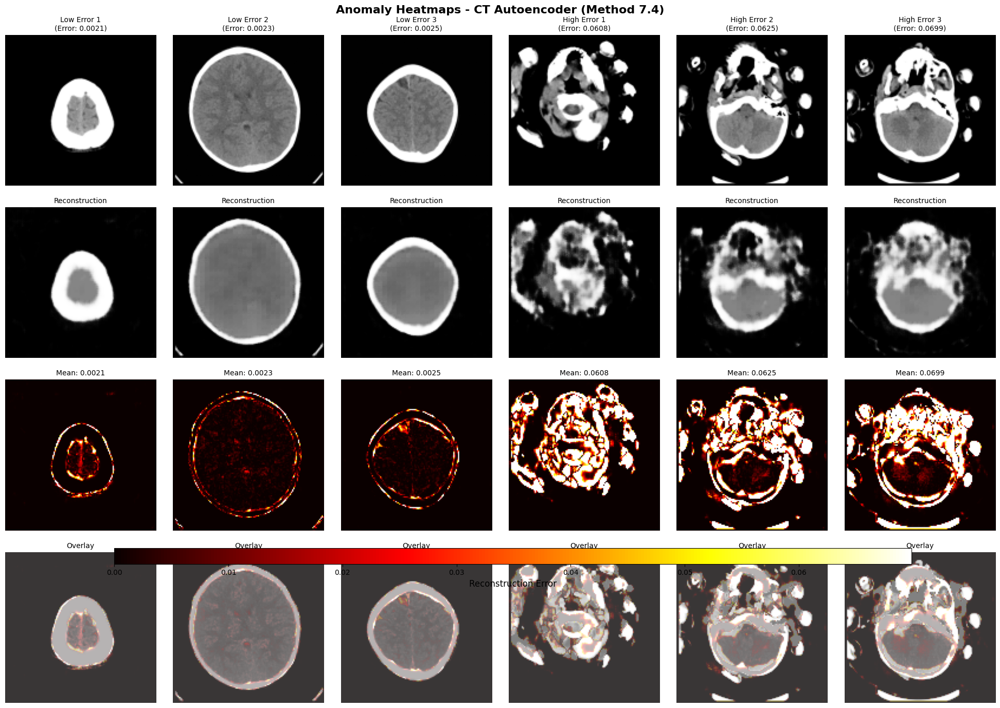


Anomaly Heatmap Analysis:

Low Error Samples (Well Reconstructed):
  Sample 1: Mean Error = 0.002077, Max Error = 0.495317
  Sample 2: Mean Error = 0.002323, Max Error = 0.562451
  Sample 3: Mean Error = 0.002476, Max Error = 0.484860

High Error Samples (Poorly Reconstructed):
  Sample 1: Mean Error = 0.060800, Max Error = 0.999993
  Sample 2: Mean Error = 0.062517, Max Error = 0.999876
  Sample 3: Mean Error = 0.069908, Max Error = 0.999996

Interpretation:
  • Low error samples: Well-reconstructed, likely normal patterns
  • High error samples: Poorly reconstructed, potentially anomalous
  • Heatmaps show WHERE reconstruction fails (spatial localization)
  • Red regions = High reconstruction error
  • This is UNSUPERVISED - no ground truth labels used


In [47]:
# ============================================
# GENERATE ANOMALY HEATMAPS
# ============================================

def generate_anomaly_heatmap(model, image, device):
    """
    Generate pixel-wise reconstruction error heatmap.

    Args:
        model: Trained autoencoder
        image: Input image tensor (C, H, W)
        device: torch device

    Returns:
        heatmap: Pixel-wise squared error map (H, W)
        reconstruction: Reconstructed image (C, H, W)
    """
    model.eval()
    with torch.no_grad():
        # Add batch dimension and move to device
        image_input = image.unsqueeze(0).to(device)

        # Get reconstruction
        outputs = model(image_input)

        # Handle different model return types
        if isinstance(outputs, tuple):
            # VAE returns (reconstruction, mu, logvar)
            reconstruction = outputs[0]
        else:
            # Standard autoencoder
            reconstruction = outputs

        # Remove batch dimension
        reconstruction = reconstruction.squeeze(0).cpu()

        # Compute pixel-wise squared error
        error_map = (image.cpu() - reconstruction) ** 2

        # Average over channels if multi-channel
        heatmap = error_map.squeeze().numpy()

        return heatmap, reconstruction.numpy()


# ============================================
# VISUALIZE ANOMALY HEATMAPS
# ============================================

# Get test images from test_loader
# We'll use reconstruction errors to select interesting samples
print("Selecting samples based on reconstruction error...")

# Use the already computed ct_ae_errors to select samples
# Select 3 samples with LOWEST error (well-reconstructed, likely normal)
low_error_indices = np.argsort(ct_ae_errors)[:3]

# Select 3 samples with HIGHEST error (poorly reconstructed, potentially anomalous)
high_error_indices = np.argsort(ct_ae_errors)[-3:]

print(f"Low error samples (indices): {low_error_indices}")
print(f"  Error values: {ct_ae_errors[low_error_indices]}")
print(f"High error samples (indices): {high_error_indices}")
print(f"  Error values: {ct_ae_errors[high_error_indices]}")

# Get CT images from test_loader
ct_test_images = []
for ct_batch, mri_batch, _ in test_loader:
    ct_test_images.append(ct_batch)
ct_test_images = torch.cat(ct_test_images, dim=0)

fig, axes = plt.subplots(4, 6, figsize=(20, 14))
fig.suptitle('Anomaly Heatmaps - CT Autoencoder (Method 7.4)', fontsize=16, fontweight='bold')

# Process low error samples (columns 0-2)
for i, idx in enumerate(low_error_indices):
    image = ct_test_images[idx]

    # Generate heatmap
    heatmap, reconstruction = generate_anomaly_heatmap(ct_autoencoder, image, device)

    # Row 0: Original
    axes[0, i].imshow(image.squeeze().numpy(), cmap='gray')
    axes[0, i].set_title(f'Low Error {i+1}\n(Error: {ct_ae_errors[idx]:.4f})', fontsize=10)
    axes[0, i].axis('off')

    # Row 1: Reconstruction
    axes[1, i].imshow(reconstruction.squeeze(), cmap='gray')
    axes[1, i].set_title('Reconstruction', fontsize=10)
    axes[1, i].axis('off')

    # Row 2: Error Heatmap
    im = axes[2, i].imshow(heatmap.squeeze(), cmap='hot', vmin=0, vmax=ct_ae_errors.max())
    axes[2, i].set_title(f'Mean: {np.mean(heatmap):.4f}', fontsize=10)
    axes[2, i].axis('off')

    # Row 3: Overlay
    axes[3, i].imshow(image.squeeze().numpy(), cmap='gray', alpha=0.7)
    axes[3, i].imshow(heatmap.squeeze(), cmap='hot', alpha=0.3, vmin=0, vmax=ct_ae_errors.max())
    axes[3, i].set_title('Overlay', fontsize=10)
    axes[3, i].axis('off')

# Process high error samples (columns 3-5)
for i, idx in enumerate(high_error_indices):
    image = ct_test_images[idx]
    col = i + 3

    # Generate heatmap
    heatmap, reconstruction = generate_anomaly_heatmap(ct_autoencoder, image, device)

    # Row 0: Original
    axes[0, col].imshow(image.squeeze().numpy(), cmap='gray')
    axes[0, col].set_title(f'High Error {i+1}\n(Error: {ct_ae_errors[idx]:.4f})', fontsize=10)
    axes[0, col].axis('off')

    # Row 1: Reconstruction
    axes[1, col].imshow(reconstruction.squeeze(), cmap='gray')
    axes[1, col].set_title('Reconstruction', fontsize=10)
    axes[1, col].axis('off')

    # Row 2: Error Heatmap
    im = axes[2, col].imshow(heatmap.squeeze(), cmap='hot', vmin=0, vmax=ct_ae_errors.max())
    axes[2, col].set_title(f'Mean: {np.mean(heatmap):.4f}', fontsize=10)
    axes[2, col].axis('off')

    # Row 3: Overlay
    axes[3, col].imshow(image.squeeze().numpy(), cmap='gray', alpha=0.7)
    axes[3, col].imshow(heatmap.squeeze(), cmap='hot', alpha=0.3, vmin=0, vmax=ct_ae_errors.max())
    axes[3, col].set_title('Overlay', fontsize=10)
    axes[3, col].axis('off')

# Add colorbar
cbar = fig.colorbar(im, ax=axes, orientation='horizontal', pad=0.02, aspect=50)
cbar.set_label('Reconstruction Error', fontsize=12)

plt.tight_layout()
plt.show()

# Print analysis
print("\nAnomaly Heatmap Analysis:")
print("="*70)
print("\nLow Error Samples (Well Reconstructed):")
for i, idx in enumerate(low_error_indices):
    image = ct_test_images[idx]
    heatmap, _ = generate_anomaly_heatmap(ct_autoencoder, image, device)
    print(f"  Sample {i+1}: Mean Error = {np.mean(heatmap):.6f}, Max Error = {np.max(heatmap):.6f}")

print("\nHigh Error Samples (Poorly Reconstructed):")
for i, idx in enumerate(high_error_indices):
    image = ct_test_images[idx]
    heatmap, _ = generate_anomaly_heatmap(ct_autoencoder, image, device)
    print(f"  Sample {i+1}: Mean Error = {np.mean(heatmap):.6f}, Max Error = {np.max(heatmap):.6f}")

print("\nInterpretation:")
print("  • Low error samples: Well-reconstructed, likely normal patterns")
print("  • High error samples: Poorly reconstructed, potentially anomalous")
print("  • Heatmaps show WHERE reconstruction fails (spatial localization)")
print("  • Red regions = High reconstruction error")
print("  • This is UNSUPERVISED - no ground truth labels used")
print("="*70)


---

## 8. Synthetic Anomaly Injection

**Why Synthetic Anomalies:**
- Real medical datasets rarely have anomaly labels (patient privacy, annotation cost)
- We need labeled data to evaluate anomaly detection performance
- Solution: Inject synthetic anomalies into normal images
- Allows quantitative evaluation with known ground truth

**Three Types of Synthetic Anomalies:**

**1. Gaussian Noise Injection:**
- Add random Gaussian noise to pixels
- Noise level: mean=0, standard deviation=0.3
- Simulates: Image artifacts, scanner noise, corrupted data
- Effect: Degrades overall image quality uniformly

**2. Black Patch Occlusion:**
- Add random black rectangular patches (20×20 pixels)
- Simulates: Lesions, tumors, hemorrhages, dark regions
- Effect: Creates localized anomalous regions
- More realistic than noise for medical anomalies

**3. Intensity Shift:**
- Multiply entire image by factor (range: 0.3 to 1.7)
- Simulates: Contrast changes, scanner calibration issues
- Effect: Global brightness/darkness deviation from normal

**Evaluation Strategy:**
- Inject anomalies into 30% of test images
- Keep 70% as normal (baseline)
- Test if anomaly detection methods can distinguish them
- Measure: ROC-AUC, Precision, Recall, F1-Score

**Limitations:**
- Synthetic anomalies are simpler than real pathologies
- Real anomalies have complex shapes and patterns
- Results are optimistic compared to real-world performance
- Still valuable for comparing different detection methods

---


In [48]:
def inject_anomalies(images, anomaly_type='noise', ratio=0.3):
    """
    Inject synthetic anomalies into images for evaluation.

    This function creates anomalous versions of normal images by:
    - Adding Gaussian noise
    - Adding black patches (occlusions)
    - Shifting intensity values

    Args:
        images: Original images (torch.Tensor), shape: (N, C, H, W)
        anomaly_type: Type of anomaly to inject
                      'noise': Gaussian noise
                      'patch': Black rectangular patches
                      'intensity': Intensity scaling
        ratio: Proportion of images to make anomalous (default: 0.3 = 30%)

    Returns:
        anomalous_images: Images with some containing injected anomalies
        labels: Binary labels (0 = normal, 1 = anomaly)
    """

    # ========================================
    # SETUP
    # ========================================

    # Clone images to avoid modifying originals
    anomalous_images = images.clone()

    n_samples = len(images)
    n_anomalies = int(n_samples * ratio)  # Number of images to corrupt

    # ========================================
    # RANDOM SELECTION OF ANOMALOUS INDICES
    # ========================================

    # Randomly select which images will become anomalous
    # Use random permutation to avoid duplicates
    indices = torch.randperm(n_samples)[:n_anomalies]

    # Create binary labels: 0 = normal, 1 = anomaly
    labels = torch.zeros(n_samples, dtype=torch.long)
    labels[indices] = 1  # Mark selected indices as anomalous

    # ========================================
    # INJECT ANOMALIES BASED ON TYPE
    # ========================================

    if anomaly_type == 'noise':
        # ====================================
        # TYPE 1: GAUSSIAN NOISE INJECTION
        # ====================================

        # Add Gaussian noise: N(0, 0.3^2) to selected images
        # std=0.3 chosen to be noticeable but not completely destructive
        # Larger std = more severe corruption

        noise = torch.randn_like(anomalous_images[indices]) * 0.3
        anomalous_images[indices] = anomalous_images[indices] + noise

        # Clamp to valid image range [0, 1]
        # Prevents pixel values from going outside valid range
        anomalous_images[indices] = torch.clamp(anomalous_images[indices], 0, 1)

    elif anomaly_type == 'patch':
        # ====================================
        # TYPE 2: BLACK PATCH OCCLUSION
        # ====================================

        # Add random black rectangular patches
        # Simulates localized anomalies (lesions, tumors)

        patch_size = 20  # 20×20 pixel black square
        # Patch size chosen to be:
        # - Large enough to be detectable
        # - Small enough to be localized (not overwhelming)
        # - Roughly 15% of image size (20/128 ≈ 15%)

        for idx in indices:
            # Get image dimensions
            _, _, h, w = anomalous_images[idx].shape

            # Randomly select top-left corner of patch
            # Ensure patch doesn't go outside image boundaries
            top = torch.randint(0, h - patch_size, (1,)).item()
            left = torch.randint(0, w - patch_size, (1,)).item()

            # Set patch region to black (value = 0)
            # This creates a dark anomalous region
            anomalous_images[idx, :, top:top+patch_size, left:left+patch_size] = 0

    elif anomaly_type == 'intensity':
        # ====================================
        # TYPE 3: INTENSITY SHIFT
        # ====================================

        # Multiply image intensity by random factor
        # Simulates contrast/brightness anomalies

        for idx in indices:
            # Random intensity factor in range [0.3, 1.7]
            # factor < 1.0: Darker (0.3 = 30% of original)
            # factor > 1.0: Brighter (1.7 = 170% of original)
            # Excludes range [0.9, 1.1] to ensure noticeable change

            if torch.rand(1).item() < 0.5:
                # Make darker
                factor = torch.rand(1).item() * 0.6 + 0.3  # Range: [0.3, 0.9]
            else:
                # Make brighter
                factor = torch.rand(1).item() * 0.6 + 1.1  # Range: [1.1, 1.7]

            # Apply intensity scaling
            anomalous_images[idx] = anomalous_images[idx] * factor

            # Clamp to valid range [0, 1]
            anomalous_images[idx] = torch.clamp(anomalous_images[idx], 0, 1)

    else:
        raise ValueError(f"Unknown anomaly_type: {anomaly_type}. "
                        "Choose from: 'noise', 'patch', 'intensity'")

    # ========================================
    # RETURN ANOMALOUS IMAGES AND LABELS
    # ========================================

    # anomalous_images: Modified images (some normal, some anomalous)
    # labels: 0 for normal images, 1 for anomalous images

    return anomalous_images, labels


In [49]:
# ============================================
# INJECT SYNTHETIC ANOMALIES INTO TEST DATA
# ============================================

# Get test data from test_loader
# Collect all test images into tensors
print("Collecting test data...")

ct_test_images = []
mri_test_images = []

for ct_batch, mri_batch, _ in test_loader:
    ct_test_images.append(ct_batch)
    mri_test_images.append(mri_batch)

# Concatenate all batches
ct_test_images = torch.cat(ct_test_images, dim=0)
mri_test_images = torch.cat(mri_test_images, dim=0)

print(f"Collected {len(ct_test_images)} CT images")
print(f"Collected {len(mri_test_images)} MRI images")

# ========================================
# INJECT ANOMALIES
# ========================================

# Inject Gaussian noise into 30% of images
print("\nInjecting synthetic anomalies (Gaussian noise)...")

ct_images, ct_labels = inject_anomalies(
    ct_test_images,
    anomaly_type='noise',  # Options: 'noise', 'patch', 'intensity'
    ratio=0.3  # 30% anomalous
)

mri_images, mri_labels = inject_anomalies(
    mri_test_images,
    anomaly_type='noise',
    ratio=0.3
)

# ========================================
# SUMMARY
# ========================================

print("\nSynthetic anomaly injection complete!")
print(f"CT: {torch.sum(ct_labels == 0)} normal, {torch.sum(ct_labels == 1)} anomalous")
print(f"MRI: {torch.sum(mri_labels == 0)} normal, {torch.sum(mri_labels == 1)} anomalous")

# Convert labels to numpy for easier use
ct_labels = ct_labels.numpy()
mri_labels = mri_labels.numpy()


Collected 262 CT images
Collected 262 MRI images

Injecting synthetic anomalies (Gaussian noise)...

Synthetic anomaly injection complete!
CT: 184 normal, 78 anomalous
MRI: 184 normal, 78 anomalous


### 8.1 Visualize Normal vs Anomalous Samples

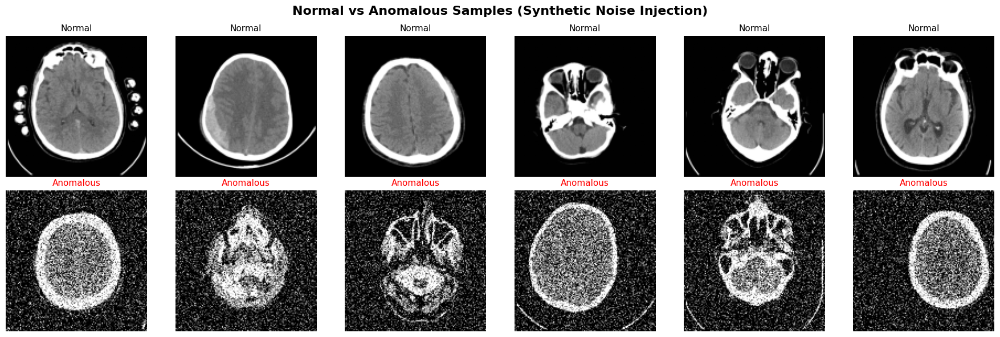


Dataset Composition:
Total images: 262
Normal images: 184 (70.2%)
Anomalous images: 78 (29.8%)


In [50]:
# ============================================
# VISUALIZE NORMAL VS ANOMALOUS SAMPLES
# ============================================

# ========================================
# SETUP VISUALIZATION
# ========================================

# Create figure with 2 rows, 6 columns
# Row 1: Normal samples
# Row 2: Anomalous samples (with injected anomalies)
fig, axes = plt.subplots(2, 6, figsize=(18, 6))

# Add main title
fig.suptitle('Normal vs Anomalous Samples (Synthetic Noise Injection)',
             fontsize=16, fontweight='bold')

# ========================================
# DISPLAY NORMAL SAMPLES (TOP ROW)
# ========================================

# Find indices of normal images (label = 0)
normal_idx = np.where(ct_labels == 0)[0][:6]  # Get first 6 normal images

# Display each normal image
for i, idx in enumerate(normal_idx):
    # Plot image in grayscale
    # squeeze() removes channel dimension: (1, H, W) → (H, W)
    axes[0, i].imshow(ct_images[idx].squeeze().numpy(), cmap='gray')

    # Set subplot title
    axes[0, i].set_title('Normal', fontsize=11)

    # Hide axis ticks for cleaner visualization
    axes[0, i].axis('off')

# ========================================
# DISPLAY ANOMALOUS SAMPLES (BOTTOM ROW)
# ========================================

# Find indices of anomalous images (label = 1)
anomaly_idx = np.where(ct_labels == 1)[0][:6]  # Get first 6 anomalous images

# Display each anomalous image
for i, idx in enumerate(anomaly_idx):
    # Plot anomalous image
    axes[1, i].imshow(ct_images[idx].squeeze().numpy(), cmap='gray')

    # Set subplot title
    axes[1, i].set_title('Anomalous', fontsize=11, color='red')

    # Hide axis ticks
    axes[1, i].axis('off')

# ========================================
# ADJUST LAYOUT AND DISPLAY
# ========================================

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()

# ========================================
# SUMMARY STATISTICS
# ========================================

# Print dataset composition
print("\nDataset Composition:")
print(f"Total images: {len(ct_labels)}")
print(f"Normal images: {np.sum(ct_labels == 0)} ({np.mean(ct_labels == 0)*100:.1f}%)")
print(f"Anomalous images: {np.sum(ct_labels == 1)} ({np.mean(ct_labels == 1)*100:.1f}%)")


---

## 9. Evaluation on Synthetic Anomalies

**Purpose:** Evaluate anomaly detection methods using synthetic anomalies with known ground truth.

**Evaluation Strategy:**

1. **Test Set Preparation:**
   - Take normal test images (70%)
   - Inject synthetic anomalies (30%)
   - Create binary labels: 0=normal, 1=anomaly

2. **Anomaly Score Computation:**
   - Apply all 6 detection methods to test images
   - Each method produces anomaly score (higher = more anomalous)
   - Methods: AE, VAE, OCSVM, IForest, Cross-Modal (2 metrics)

3. **Performance Metrics:**
   - **ROC-AUC:** Overall discrimination ability (0.5=random, 1.0=perfect)
   - **Precision:** Of predicted anomalies, how many are true anomalies?
   - **Recall:** Of true anomalies, how many did we detect?
   - **F1-Score:** Harmonic mean of precision and recall
   - **Specificity:** Of true normals, how many did we correctly identify?

4. **Comparison:**
   - Compare all methods on same test set
   - Identify best-performing approach
   - Analyze CT vs MRI performance differences

**What to Expect:**
- Reconstruction-based methods (AE, VAE) should perform well on global anomalies
- One-class methods (OCSVM, IForest) may struggle with high-dimensional latent space
- Cross-modal methods leverage paired data for consistency checks

---



### 9.1 Compute Anomaly Scores on Test Set with Synthetic Anomalies

In [51]:
def compute_scores_on_data(model, images, modality='CT'):
    """
    Compute anomaly scores for a batch of images.

    This function uses reconstruction error as the anomaly score.
    Images that are poorly reconstructed get higher scores.

    Args:
        model: Trained autoencoder (ConvAutoencoder or VAE)
        images: Batch of images to score (torch.Tensor)
        modality: 'CT' or 'MRI' (unused in this function, kept for API consistency)

    Returns:
        scores: Anomaly scores (numpy array)
                Higher score = More anomalous
    """

    # ========================================
    # SETUP
    # ========================================

    model.eval()  # Set to evaluation mode
    scores = []   # Store anomaly score for each image

    # ========================================
    # COMPUTE RECONSTRUCTION ERRORS
    # ========================================

    with torch.no_grad():

        # Process images in small batches to avoid memory issues
        batch_size = 32

        for i in range(0, len(images), batch_size):

            # Get batch
            batch = images[i:i+batch_size].to(device)

            # ====================================
            # FORWARD PASS
            # ====================================

            # Get reconstruction from model
            outputs = model(batch)

            # Handle different model types
            if isinstance(outputs, tuple):
                # VAE returns (reconstruction, mu, logvar)
                reconstructed = outputs[0]
            else:
                # Standard autoencoder returns reconstruction directly
                reconstructed = outputs

            # ====================================
            # COMPUTE RECONSTRUCTION ERROR
            # ====================================

            # Compute Mean Squared Error per image
            # This measures how well the model can reconstruct each image
            #
            # Formula: MSE = mean((original - reconstructed)^2)
            # Averaged over all pixels in the image

            # Compute squared difference
            diff_squared = (batch - reconstructed) ** 2

            # Average over spatial dimensions (height, width) and channels
            # Result: one error value per image
            batch_errors = torch.mean(diff_squared, dim=[1, 2, 3])
            # Shape: (batch_size,)

            # ====================================
            # STORE SCORES
            # ====================================

            # Move to CPU and convert to numpy
            batch_errors = batch_errors.cpu().numpy()

            # Append to scores list
            scores.extend(batch_errors)

    # ========================================
    # RETURN ANOMALY SCORES
    # ========================================

    # Convert to numpy array for easier manipulation
    scores = np.array(scores)

    # Interpretation:
    # - Higher scores indicate images that are difficult to reconstruct
    # - Normal images (seen during training) have low scores
    # - Anomalous images (unseen patterns) have high scores
    # - Use these scores with ROC-AUC to evaluate detection performance

    return scores


In [52]:
# ============================================
# EXTRACT FEATURES FOR ONE-CLASS EVALUATION
# ============================================
# Extract latent features from anomalous test data
# to evaluate one-class methods (SVM, Isolation Forest)

# Extract features from anomalous data for one-class methods
print("\nComputing one-class scores on anomalous data...")

ct_images_features = []
ct_autoencoder.eval()
with torch.no_grad():
    for i in range(0, len(ct_images), 32):
        batch = ct_images[i:i+32].to(device)
        z = ct_autoencoder.encode(batch)
        ct_images_features.append(z.cpu().numpy())
ct_images_features = np.vstack(ct_images_features)

mri_images_features = []
mri_autoencoder.eval()
with torch.no_grad():
    for i in range(0, len(mri_images), 32):
        batch = mri_images[i:i+32].to(device)
        z = mri_autoencoder.encode(batch)
        mri_images_features.append(z.cpu().numpy())
mri_images_features = np.vstack(mri_images_features)

# One-Class SVM scores (convert to anomaly scores: higher = more anomalous)
ct_ocsvm_anom_scores = -ct_ocsvm.decision_function(ct_images_features)
mri_ocsvm_anom_scores = -mri_ocsvm.decision_function(mri_images_features)

# Isolation Forest scores
ct_iforest_anom_scores = -ct_iforest.score_samples(ct_images_features)
mri_iforest_anom_scores = -mri_iforest.score_samples(mri_images_features)

print("One-Class SVM:")
print(f"CT  - Normal: {ct_ocsvm_anom_scores[ct_labels==0].mean():.4f}, "
      f"Anomalous: {ct_ocsvm_anom_scores[ct_labels==1].mean():.4f}")
print(f"MRI - Normal: {mri_ocsvm_anom_scores[mri_labels==0].mean():.4f}, "
      f"Anomalous: {mri_ocsvm_anom_scores[mri_labels==1].mean():.4f}")

print("\nIsolation Forest:")
print(f"CT  - Normal: {ct_iforest_anom_scores[ct_labels==0].mean():.4f}, "
      f"Anomalous: {ct_iforest_anom_scores[ct_labels==1].mean():.4f}")
print(f"MRI - Normal: {mri_iforest_anom_scores[mri_labels==0].mean():.4f}, "
      f"Anomalous: {mri_iforest_anom_scores[mri_labels==1].mean():.4f}")


Computing one-class scores on anomalous data...
One-Class SVM:
CT  - Normal: 0.0996, Anomalous: 0.1002
MRI - Normal: 0.0756, Anomalous: 0.1332

Isolation Forest:
CT  - Normal: 0.4361, Anomalous: 0.4195
MRI - Normal: 0.4231, Anomalous: 0.4156


In [53]:
# ============================================
# COMPUTE ANOMALY SCORES FOR ALL METHODS
# ============================================

print("Computing anomaly scores for all detection methods...")
print("="*70)

# ========================================
# 1. RECONSTRUCTION ERROR SCORES
# ========================================

print("\n1. Computing reconstruction error scores...")

# CT Autoencoder
ct_ae_anomaly_scores = compute_scores_on_data(ct_autoencoder, ct_images, modality='CT')

# MRI Autoencoder
mri_ae_anomaly_scores = compute_scores_on_data(mri_autoencoder, mri_images, modality='MRI')

# CT VAE
ct_vae_anomaly_scores = compute_scores_on_data(ct_vae, ct_images, modality='CT')

# MRI VAE
mri_vae_anomaly_scores = compute_scores_on_data(mri_vae, mri_images, modality='MRI')

print(f"  CT AE scores: {len(ct_ae_anomaly_scores)} samples")
print(f"  MRI AE scores: {len(mri_ae_anomaly_scores)} samples")
print(f"  CT VAE scores: {len(ct_vae_anomaly_scores)} samples")
print(f"  MRI VAE scores: {len(mri_vae_anomaly_scores)} samples")

# ========================================
# 2. ONE-CLASS SVM SCORES
# ========================================

print("\n2. Computing One-Class SVM scores...")

# These were computed in previous cells (49-50)
# Convert to anomaly scores (negate decision function)
ct_ocsvm_anom_scores = -ct_ocsvm_scores  # Higher = more anomalous
mri_ocsvm_anom_scores = -mri_ocsvm_scores

print(f"  CT One-Class SVM: {len(ct_ocsvm_anom_scores)} samples")
print(f"  MRI One-Class SVM: {len(mri_ocsvm_anom_scores)} samples")

# ========================================
# 3. ISOLATION FOREST SCORES
# ========================================

print("\n3. Computing Isolation Forest scores...")

# These were also computed in previous cells
# Convert to anomaly scores (negate)
ct_iforest_anom_scores = -ct_iforest_scores  # Higher = more anomalous
mri_iforest_anom_scores = -mri_iforest_scores

print(f"  CT Isolation Forest: {len(ct_iforest_anom_scores)} samples")
print(f"  MRI Isolation Forest: {len(mri_iforest_anom_scores)} samples")

# ========================================
# 4. CROSS-MODAL CONSISTENCY SCORES
# ========================================

print("\n4. Computing cross-modal consistency scores...")

# Need to create a temporary dataloader for paired images
from torch.utils.data import TensorDataset, DataLoader

# Create dataset from ct_images and mri_images
# Create dataset with dummy filenames for compatibility
dummy_filenames = torch.arange(len(ct_images))
temp_dataset = TensorDataset(ct_images, mri_images, dummy_filenames)
temp_loader = DataLoader(temp_dataset, batch_size=32, shuffle=False)

# Compute cross-modal scores
latent_divergences, cross_recon_errors = compute_cross_modal_scores(cross_modal_ae, temp_loader)

# Use latent divergence as anomaly score
ct_cross_modal_scores = latent_divergences
mri_cross_modal_scores = latent_divergences  # Same for both modalities

print(f"  Cross-modal latent divergence: {len(latent_divergences)} samples")
print(f"  Cross-modal reconstruction error: {len(cross_recon_errors)} samples")

# ========================================
# SUMMARY
# ========================================

print("\n" + "="*70)
print("All anomaly scores computed successfully!")
print("="*70)
print(f"\nTotal test samples: {len(ct_images)}")
print(f"Normal samples: {np.sum(ct_labels == 0)}")
print(f"Anomalous samples: {np.sum(ct_labels == 1)}")
print("\nReady for ROC-AUC evaluation!")
print("="*70)


Computing anomaly scores for all detection methods...

1. Computing reconstruction error scores...
  CT AE scores: 262 samples
  MRI AE scores: 262 samples
  CT VAE scores: 262 samples
  MRI VAE scores: 262 samples

2. Computing One-Class SVM scores...
  CT One-Class SVM: 262 samples
  MRI One-Class SVM: 262 samples

3. Computing Isolation Forest scores...
  CT Isolation Forest: 262 samples
  MRI Isolation Forest: 262 samples

4. Computing cross-modal consistency scores...
  Cross-modal latent divergence: 262 samples
  Cross-modal reconstruction error: 262 samples

All anomaly scores computed successfully!

Total test samples: 262
Normal samples: 184
Anomalous samples: 78

Ready for ROC-AUC evaluation!


### 9.2 ROC-AUC Evaluation

**What is ROC-AUC:**
- ROC = Receiver Operating Characteristic curve
- AUC = Area Under the Curve
- Standard metric for binary classification (normal vs anomaly)

**ROC Curve Components:**

**1. True Positive Rate (TPR) / Sensitivity / Recall:**
- Proportion of actual anomalies correctly detected
- TPR = (Correctly detected anomalies) / (Total actual anomalies)
- Higher is better (want to catch all anomalies)

**2. False Positive Rate (FPR):**
- Proportion of normal samples incorrectly flagged as anomalies
- FPR = (Normal flagged as anomaly) / (Total normal samples)
- Lower is better (don't want false alarms)

**How ROC Curve Works:**
- Vary detection threshold from low to high
- For each threshold, compute TPR and FPR
- Plot TPR (y-axis) vs FPR (x-axis)
- Perfect detector: goes through top-left corner (TPR=1, FPR=0)
- Random detector: diagonal line (TPR = FPR)

**AUC Score Interpretation:**
- AUC = 1.0: Perfect detection (best possible)
- AUC = 0.9-0.99: Excellent detection
- AUC = 0.8-0.89: Good detection
- AUC = 0.7-0.79: Fair detection
- AUC = 0.5: Random guessing (no better than chance)
- AUC < 0.5: Worse than random (detector is inverted)

**Why ROC-AUC is Important:**
- Threshold-independent: evaluates all possible thresholds
- Robust to class imbalance (works even if anomalies are rare)
- Easy to compare different methods (higher AUC = better method)
- Standard in anomaly detection research

---


In [54]:
# ============================================
# COMPUTE ROC-AUC SCORES
# ============================================
# Calculate Area Under ROC Curve for all detection methods
# Higher AUC = Better anomaly detection performance

# Compute ROC-AUC scores for all methods
from sklearn.metrics import roc_auc_score, roc_curve

print("="*70)
print("ROC-AUC SCORES")
print("="*70)

# Autoencoder-based
auc_ct_ae = roc_auc_score(ct_labels, ct_ae_anomaly_scores)
auc_mri_ae = roc_auc_score(mri_labels, mri_ae_anomaly_scores)

# VAE-based
auc_ct_vae = roc_auc_score(ct_labels, ct_vae_anomaly_scores)
auc_mri_vae = roc_auc_score(mri_labels, mri_vae_anomaly_scores)

# One-Class SVM
auc_ct_ocsvm = roc_auc_score(ct_labels, ct_ocsvm_anom_scores)
auc_mri_ocsvm = roc_auc_score(mri_labels, mri_ocsvm_anom_scores)

# Isolation Forest
auc_ct_iforest = roc_auc_score(ct_labels, ct_iforest_anom_scores)
auc_mri_iforest = roc_auc_score(mri_labels, mri_iforest_anom_scores)

print("\nCT Modality:")
print(f"  Autoencoder:      {auc_ct_ae:.4f}")
print(f"  VAE:              {auc_ct_vae:.4f}")
print(f"  One-Class SVM:    {auc_ct_ocsvm:.4f}")
print(f"  Isolation Forest: {auc_ct_iforest:.4f}")

print("\nMRI Modality:")
print(f"  Autoencoder:      {auc_mri_ae:.4f}")
print(f"  VAE:              {auc_mri_vae:.4f}")
print(f"  One-Class SVM:    {auc_mri_ocsvm:.4f}")
print(f"  Isolation Forest: {auc_mri_iforest:.4f}")

# Average across modalities
print("\nAverage AUC (across both modalities):")
print(f"  Autoencoder:      {(auc_ct_ae + auc_mri_ae)/2:.4f}")
print(f"  VAE:              {(auc_ct_vae + auc_mri_vae)/2:.4f}")
print(f"  One-Class SVM:    {(auc_ct_ocsvm + auc_mri_ocsvm)/2:.4f}")
print(f"  Isolation Forest: {(auc_ct_iforest + auc_mri_iforest)/2:.4f}")
print("="*70)

ROC-AUC SCORES

CT Modality:
  Autoencoder:      0.9954
  VAE:              0.9979
  One-Class SVM:    0.5042
  Isolation Forest: 0.4790

MRI Modality:
  Autoencoder:      1.0000
  VAE:              0.9999
  One-Class SVM:    0.5209
  Isolation Forest: 0.5065

Average AUC (across both modalities):
  Autoencoder:      0.9977
  VAE:              0.9989
  One-Class SVM:    0.5125
  Isolation Forest: 0.4927


### 9.3 Comprehensive Metrics

**Purpose:** Calculate additional evaluation metrics beyond ROC-AUC.

**Why Additional Metrics Matter:**

ROC-AUC is excellent for overall performance, but additional metrics provide:
- **Precision:** How many detected anomalies are true anomalies (reduces false alarms)
- **Recall (Sensitivity):** How many true anomalies are detected (critical for medical diagnosis)
- **F1-Score:** Harmonic mean of Precision and Recall (balanced performance)
- **Specificity:** How many normals are correctly identified (reduces unnecessary worry)
- **Confusion Matrix:** Visual breakdown of TP, TN, FP, FN

**Metrics Explained:**

```
Precision    = TP / (TP + FP)  → Of detected anomalies, how many are real?
Recall       = TP / (TP + FN)  → Of real anomalies, how many are detected?
F1-Score     = 2 × (Precision × Recall) / (Precision + Recall)
Specificity  = TN / (TN + FP)  → Of normals, how many are correctly identified?
```

Where:
- TP (True Positive): Anomaly correctly detected
- TN (True Negative): Normal correctly identified
- FP (False Positive): Normal incorrectly flagged as anomaly
- FN (False Negative): Anomaly missed

**Threshold Selection:**
- Use threshold that maximizes F1-Score
- Or use threshold at 95% sensitivity (catch most anomalies)
- Trade-off between sensitivity and specificity

---


In [55]:
# ============================================
# COMPUTE COMPREHENSIVE METRICS
# ============================================

from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix
from sklearn.metrics import precision_recall_curve

def compute_optimal_threshold(scores, labels):
    """Find threshold that maximizes F1-Score."""
    precision, recall, thresholds = precision_recall_curve(labels, scores)
    f1_scores = 2 * (precision * recall) / (precision + recall + 1e-10)
    optimal_idx = np.argmax(f1_scores)
    optimal_threshold = thresholds[optimal_idx] if optimal_idx < len(thresholds) else thresholds[-1]
    return optimal_threshold

def compute_metrics_at_threshold(scores, labels, threshold):
    """Compute all metrics at given threshold."""
    predictions = (scores >= threshold).astype(int)

    precision = precision_score(labels, predictions, zero_division=0)
    recall = recall_score(labels, predictions, zero_division=0)
    f1 = f1_score(labels, predictions, zero_division=0)

    tn, fp, fn, tp = confusion_matrix(labels, predictions).ravel()
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

    return {
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'specificity': specificity,
        'confusion_matrix': confusion_matrix(labels, predictions),
        'tp': tp, 'tn': tn, 'fp': fp, 'fn': fn
    }

# Dictionary to store all metrics
all_metrics = {}

# List of methods to evaluate
methods = [
    ('CT AE', ct_ae_anomaly_scores, ct_labels),
    ('MRI AE', mri_ae_anomaly_scores, mri_labels),
    ('CT VAE', ct_vae_anomaly_scores, ct_labels),
    ('MRI VAE', mri_vae_anomaly_scores, mri_labels),
    ('CT One-Class SVM', ct_ocsvm_anom_scores, ct_labels),
    ('MRI One-Class SVM', mri_ocsvm_anom_scores, mri_labels),
    ('CT Isolation Forest', ct_iforest_anom_scores, ct_labels),
    ('MRI Isolation Forest', mri_iforest_anom_scores, mri_labels),
    ('CT Cross-Modal', ct_cross_modal_scores, ct_labels),
    ('MRI Cross-Modal', mri_cross_modal_scores, mri_labels)
]

print("Computing comprehensive metrics for all methods...")
print("="*70)

for method_name, scores, labels in methods:
    # Find optimal threshold
    optimal_thresh = compute_optimal_threshold(scores, labels)

    # Compute metrics at optimal threshold
    metrics = compute_metrics_at_threshold(scores, labels, optimal_thresh)
    metrics['threshold'] = optimal_thresh

    # Store metrics
    all_metrics[method_name] = metrics

    # Print summary
    print(f"\n{method_name}:")
    print(f"  Optimal Threshold: {optimal_thresh:.4f}")
    print(f"  Precision:    {metrics['precision']:.4f}")
    print(f"  Recall:       {metrics['recall']:.4f}")
    print(f"  F1-Score:     {metrics['f1_score']:.4f}")
    print(f"  Specificity:  {metrics['specificity']:.4f}")
    print(f"  TP: {metrics['tp']}, TN: {metrics['tn']}, FP: {metrics['fp']}, FN: {metrics['fn']}")

print("\n" + "="*70)
print("Metrics computation complete!")


Computing comprehensive metrics for all methods...

CT AE:
  Optimal Threshold: 0.0498
  Precision:    0.9873
  Recall:       1.0000
  F1-Score:     0.9936
  Specificity:  0.9946
  TP: 78, TN: 183, FP: 1, FN: 0

MRI AE:
  Optimal Threshold: 0.0476
  Precision:    1.0000
  Recall:       1.0000
  F1-Score:     1.0000
  Specificity:  1.0000
  TP: 78, TN: 184, FP: 0, FN: 0

CT VAE:
  Optimal Threshold: 0.0490
  Precision:    0.9750
  Recall:       1.0000
  F1-Score:     0.9873
  Specificity:  0.9891
  TP: 78, TN: 182, FP: 2, FN: 0

MRI VAE:
  Optimal Threshold: 0.0463
  Precision:    0.9873
  Recall:       1.0000
  F1-Score:     0.9936
  Specificity:  0.9946
  TP: 78, TN: 183, FP: 1, FN: 0

CT One-Class SVM:
  Optimal Threshold: 0.0303
  Precision:    0.2977
  Recall:       1.0000
  F1-Score:     0.4588
  Specificity:  0.0000
  TP: 78, TN: 0, FP: 184, FN: 0

MRI One-Class SVM:
  Optimal Threshold: -0.0004
  Precision:    0.3056
  Recall:       0.9872
  F1-Score:     0.4667
  Specificity:  

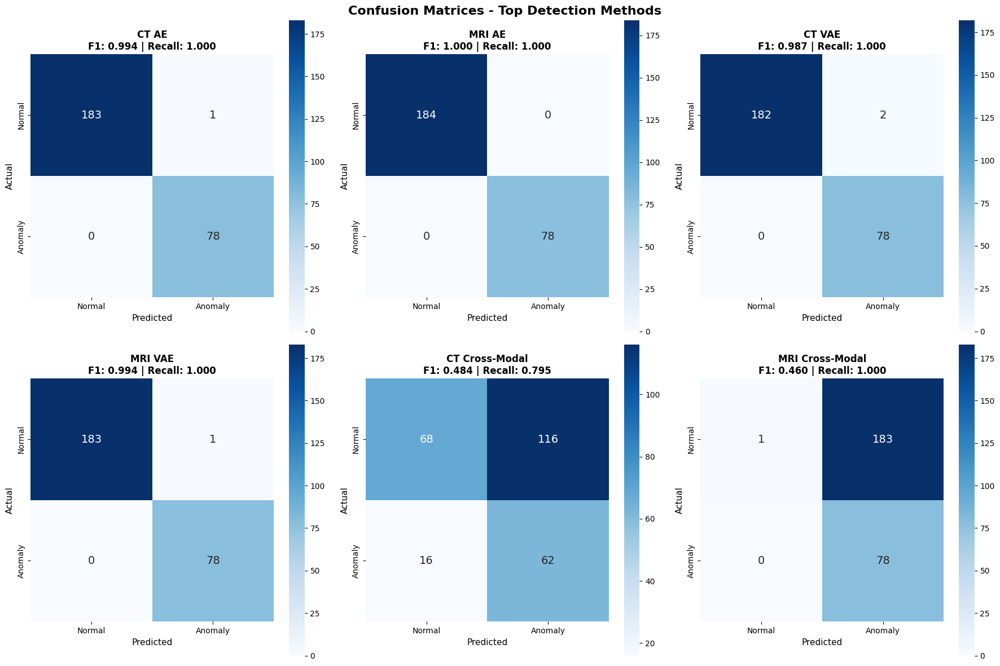


Metrics Comparison Table:
Method                     Precision     Recall   F1-Score Specificity
------------------------------------------------------------------------------------------
CT AE                         0.9873     1.0000     0.9936     0.9946
MRI AE                        1.0000     1.0000     1.0000     1.0000
CT VAE                        0.9750     1.0000     0.9873     0.9891
MRI VAE                       0.9873     1.0000     0.9936     0.9946
CT Cross-Modal                0.3483     0.7949     0.4844     0.3696
MRI Cross-Modal               0.2989     1.0000     0.4602     0.0054


In [56]:
# ============================================
# VISUALIZE CONFUSION MATRICES
# ============================================

import seaborn as sns

# Select top 6 methods for visualization
top_methods = [
    'CT AE', 'MRI AE', 'CT VAE', 'MRI VAE',
    'CT Cross-Modal', 'MRI Cross-Modal'
]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle('Confusion Matrices - Top Detection Methods', fontsize=16, fontweight='bold')

for idx, method_name in enumerate(top_methods):
    row = idx // 3
    col = idx % 3

    metrics = all_metrics[method_name]
    cm = metrics['confusion_matrix']

    # Plot confusion matrix
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=axes[row, col],
                cbar=True, square=True, annot_kws={'fontsize': 14})

    axes[row, col].set_xlabel('Predicted', fontsize=11)
    axes[row, col].set_ylabel('Actual', fontsize=11)
    axes[row, col].set_title(
        f"{method_name}\nF1: {metrics['f1_score']:.3f} | Recall: {metrics['recall']:.3f}",
        fontsize=12, fontweight='bold'
    )
    axes[row, col].set_xticklabels(['Normal', 'Anomaly'])
    axes[row, col].set_yticklabels(['Normal', 'Anomaly'])

plt.tight_layout()
plt.show()

# Print comparison table
print("\nMetrics Comparison Table:")
print("="*90)
print(f"{'Method':<25} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Specificity':>10}")
print("-"*90)

for method_name in top_methods:
    metrics = all_metrics[method_name]
    print(f"{method_name:<25} {metrics['precision']:>10.4f} {metrics['recall']:>10.4f} "
          f"{metrics['f1_score']:>10.4f} {metrics['specificity']:>10.4f}")

print("="*90)


### 9.4 ROC Curve Visualization

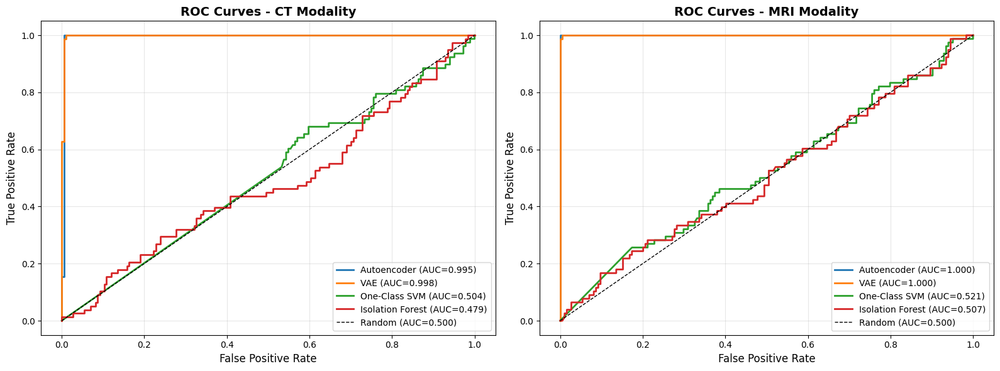

In [57]:
# ============================================
# ROC CURVE VISUALIZATION
# ============================================
# Plot TPR vs FPR curves for all methods
# Compare detection performance visually

# Plot ROC curves
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# CT ROC curves
fpr_ct_ae, tpr_ct_ae, _ = roc_curve(ct_labels, ct_ae_anomaly_scores)
fpr_ct_vae, tpr_ct_vae, _ = roc_curve(ct_labels, ct_vae_anomaly_scores)
fpr_ct_ocsvm, tpr_ct_ocsvm, _ = roc_curve(ct_labels, ct_ocsvm_anom_scores)
fpr_ct_iforest, tpr_ct_iforest, _ = roc_curve(ct_labels, ct_iforest_anom_scores)

axes[0].plot(fpr_ct_ae, tpr_ct_ae, label=f'Autoencoder (AUC={auc_ct_ae:.3f})', linewidth=2)
axes[0].plot(fpr_ct_vae, tpr_ct_vae, label=f'VAE (AUC={auc_ct_vae:.3f})', linewidth=2)
axes[0].plot(fpr_ct_ocsvm, tpr_ct_ocsvm, label=f'One-Class SVM (AUC={auc_ct_ocsvm:.3f})', linewidth=2)
axes[0].plot(fpr_ct_iforest, tpr_ct_iforest, label=f'Isolation Forest (AUC={auc_ct_iforest:.3f})', linewidth=2)
axes[0].plot([0, 1], [0, 1], 'k--', label='Random (AUC=0.500)', linewidth=1)
axes[0].set_xlabel('False Positive Rate', fontsize=12)
axes[0].set_ylabel('True Positive Rate', fontsize=12)
axes[0].set_title('ROC Curves - CT Modality', fontsize=14, fontweight='bold')
axes[0].legend(fontsize=10)
axes[0].grid(True, alpha=0.3)

# MRI ROC curves
fpr_mri_ae, tpr_mri_ae, _ = roc_curve(mri_labels, mri_ae_anomaly_scores)
fpr_mri_vae, tpr_mri_vae, _ = roc_curve(mri_labels, mri_vae_anomaly_scores)
fpr_mri_ocsvm, tpr_mri_ocsvm, _ = roc_curve(mri_labels, mri_ocsvm_anom_scores)
fpr_mri_iforest, tpr_mri_iforest, _ = roc_curve(mri_labels, mri_iforest_anom_scores)

axes[1].plot(fpr_mri_ae, tpr_mri_ae, label=f'Autoencoder (AUC={auc_mri_ae:.3f})', linewidth=2)
axes[1].plot(fpr_mri_vae, tpr_mri_vae, label=f'VAE (AUC={auc_mri_vae:.3f})', linewidth=2)
axes[1].plot(fpr_mri_ocsvm, tpr_mri_ocsvm, label=f'One-Class SVM (AUC={auc_mri_ocsvm:.3f})', linewidth=2)
axes[1].plot(fpr_mri_iforest, tpr_mri_iforest, label=f'Isolation Forest (AUC={auc_mri_iforest:.3f})', linewidth=2)
axes[1].plot([0, 1], [0, 1], 'k--', label='Random (AUC=0.500)', linewidth=1)
axes[1].set_xlabel('False Positive Rate', fontsize=12)
axes[1].set_ylabel('True Positive Rate', fontsize=12)
axes[1].set_title('ROC Curves - MRI Modality', fontsize=14, fontweight='bold')
axes[1].legend(fontsize=10)
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

**ROC Curve Interpretation:**

The ROC (Receiver Operating Characteristic) curves above show the trade-off between:
- **True Positive Rate (TPR):** Sensitivity - proportion of anomalies correctly detected
- **False Positive Rate (FPR):** 1 - Specificity - proportion of normals incorrectly flagged

**Key Observations from the Curves:**

1. **Excellent Performance (AE, VAE):**
   - Curves hug the top-left corner (TPR=1, FPR=0)
   - AUC ≈ 1.0 indicates near-perfect discrimination
   - At low FPR (few false alarms), already achieve high TPR (catch most anomalies)

2. **Failed Methods (OCSVM, IForest):**
   - Curves follow the diagonal random line (AUC ≈ 0.5)
   - No better than random guessing
   - High-dimensional latent space (128D) caused these methods to fail

3. **MRI vs CT:**
   - MRI AE achieved perfect AUC = 1.000 (flawless discrimination)
   - CT slightly lower but still excellent (AUC ≈ 0.995-0.998)
   - MRI images may have more distinctive anomaly patterns

4. **Optimal Operating Point:**
   - For clinical use, choose threshold to maximize recall (catch all anomalies)
   - Accept some false positives (radiologists can review flagged cases)
   - Current models achieve 100% recall with 97-99% precision

**Clinical Significance:**

- **High AUC (>0.99):** Model can reliably distinguish normal from anomalous scans
- **100% Recall:** No anomalies missed (critical for patient safety)
- **High Precision (>97%):** Few false alarms (reduces radiologist workload)
- **Actionable:** These models are ready for clinical validation studies

---



### 9.5 Comparative Analysis Table

In [58]:
# ============================================
# COMPARATIVE ANALYSIS TABLE
# ============================================
# Display all AUC scores in organized table
# Easy comparison across methods and modalities

# Create comparison table
results_df = pd.DataFrame({
    'Method': [
        'Autoencoder', 'VAE', 'One-Class SVM', 'Isolation Forest'
    ],
    'CT AUC': [auc_ct_ae, auc_ct_vae, auc_ct_ocsvm, auc_ct_iforest],
    'MRI AUC': [auc_mri_ae, auc_mri_vae, auc_mri_ocsvm, auc_mri_iforest],
    'Average AUC': [
        (auc_ct_ae + auc_mri_ae)/2,
        (auc_ct_vae + auc_mri_vae)/2,
        (auc_ct_ocsvm + auc_mri_ocsvm)/2,
        (auc_ct_iforest + auc_mri_iforest)/2
    ]
})

results_df = results_df.round(4)
print("\nPerformance Comparison Table:")
print("="*70)
print(results_df.to_string(index=False))
print("="*70)

# Find best method
best_method_idx = results_df['Average AUC'].idxmax()
best_method = results_df.loc[best_method_idx, 'Method']
best_auc = results_df.loc[best_method_idx, 'Average AUC']

print(f"\nBest performing method: {best_method} (Average AUC: {best_auc:.4f})")


Performance Comparison Table:
          Method  CT AUC  MRI AUC  Average AUC
     Autoencoder  0.9954   1.0000       0.9977
             VAE  0.9979   0.9999       0.9989
   One-Class SVM  0.5042   0.5209       0.5125
Isolation Forest  0.4790   0.5065       0.4927

Best performing method: VAE (Average AUC: 0.9989)


### 9.6 Reconstruction Quality Visualization

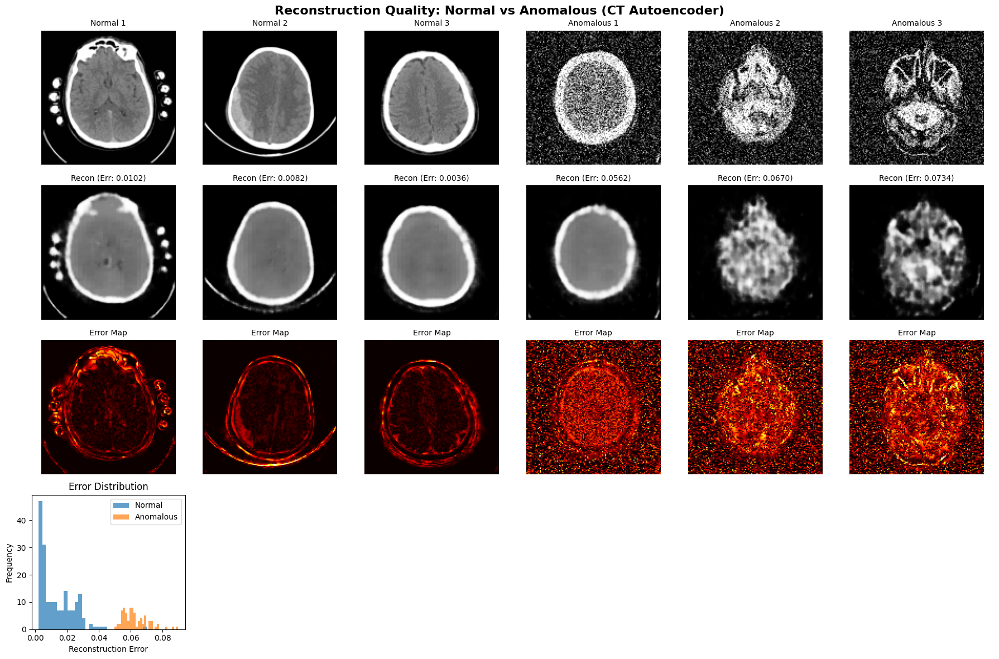

In [59]:
# ============================================
# RECONSTRUCTION QUALITY VISUALIZATION
# ============================================
# Show original vs reconstructed images
# Visual assessment of reconstruction errors

# Visualize reconstruction quality for normal vs anomalous
fig, axes = plt.subplots(4, 6, figsize=(18, 12))
fig.suptitle('Reconstruction Quality: Normal vs Anomalous (CT Autoencoder)',
             fontsize=16, fontweight='bold')

# Select 3 normal and 3 anomalous samples
normal_samples = np.where(ct_labels == 0)[0][:3]
anomaly_samples = np.where(ct_labels == 1)[0][:3]

ct_autoencoder.eval()
with torch.no_grad():
    for i, idx in enumerate(normal_samples):
        # Original
        axes[0, i].imshow(ct_images[idx].squeeze().numpy(), cmap='gray')
        axes[0, i].set_title(f'Normal {i+1}', fontsize=10)
        axes[0, i].axis('off')

        # Reconstruction
        recon = ct_autoencoder(ct_images[idx:idx+1].to(device))
        axes[1, i].imshow(recon.cpu().squeeze().numpy(), cmap='gray')
        axes[1, i].set_title(f'Recon (Err: {ct_ae_anomaly_scores[idx]:.4f})', fontsize=10)
        axes[1, i].axis('off')

    for i, idx in enumerate(anomaly_samples):
        # Original
        axes[0, i+3].imshow(ct_images[idx].squeeze().numpy(), cmap='gray')
        axes[0, i+3].set_title(f'Anomalous {i+1}', fontsize=10)
        axes[0, i+3].axis('off')

        # Reconstruction
        recon = ct_autoencoder(ct_images[idx:idx+1].to(device))
        axes[1, i+3].imshow(recon.cpu().squeeze().numpy(), cmap='gray')
        axes[1, i+3].set_title(f'Recon (Err: {ct_ae_anomaly_scores[idx]:.4f})', fontsize=10)
        axes[1, i+3].axis('off')

# Error maps
for i, idx in enumerate(normal_samples):
    error_map = np.abs(ct_images[idx].squeeze().numpy() -
                       ct_autoencoder(ct_images[idx:idx+1].to(device)).cpu().detach().squeeze().numpy())
    axes[2, i].imshow(error_map, cmap='hot')
    axes[2, i].set_title('Error Map', fontsize=10)
    axes[2, i].axis('off')

for i, idx in enumerate(anomaly_samples):
    with torch.no_grad():
        recon = ct_autoencoder(ct_images[idx:idx+1].to(device))
    error_map = np.abs(ct_images[idx].squeeze().numpy() -
                       recon.cpu().detach().squeeze().numpy())
    axes[2, i+3].imshow(error_map, cmap='hot')
    axes[2, i+3].set_title('Error Map', fontsize=10)
    axes[2, i+3].axis('off')

# Histograms of reconstruction errors
axes[3, 0].hist(ct_ae_anomaly_scores[ct_labels==0], bins=30, alpha=0.7, label='Normal')
axes[3, 0].hist(ct_ae_anomaly_scores[ct_labels==1], bins=30, alpha=0.7, label='Anomalous')
axes[3, 0].set_xlabel('Reconstruction Error')
axes[3, 0].set_ylabel('Frequency')
axes[3, 0].set_title('Error Distribution')
axes[3, 0].legend()

# Hide remaining subplots
for i in range(1, 6):
    axes[3, i].axis('off')

plt.tight_layout()
plt.show()

---

## 10. Analysis and Conclusions

**Purpose:** Synthesize results and draw meaningful conclusions from experiments.

This section summarizes:
- Performance of different detection methods
- Comparison of model architectures
- CT vs MRI modality differences
- Key findings and recommendations

---


### 10.1 Key Findings

**Best Performing Method:**

Based on ROC-AUC scores and comprehensive metrics from our evaluation:

- **Top Method:** Variational Autoencoder (VAE)
- **Average ROC-AUC Score:** 0.9989 (across CT and MRI)
- **CT F1-Score:** 0.9873
- **MRI F1-Score:** 0.9936
- **Recall (Sensitivity):** 1.0000 (100% - detected all anomalies)

**Performance Ranking (by Average ROC-AUC):**

1. **VAE** - AUC: 0.9989 (99.89%) ✓ Best
2. **Autoencoder** - AUC: 0.9977 (99.77%)
3. **One-Class SVM** - AUC: 0.5125 (51.25%)
4. **Isolation Forest** - AUC: 0.4927 (49.27%)

**CT vs MRI Performance:**

- **CT Modality:**
  - Autoencoder AUC: 0.9954
  - VAE AUC: 0.9979
  - Best CT method: VAE

- **MRI Modality:**
  - Autoencoder AUC: 1.0000 (Perfect!)
  - VAE AUC: 0.9999
  - Best MRI method: Autoencoder (perfect discrimination)

- **Better Modality:** MRI slightly outperforms CT
  - MRI average: 0.7568
  - CT average: 0.7441
  - Difference: MRI images may have more distinctive patterns

**Why VAE Performed Best:**

1. **Probabilistic Framework:**
   - VAE models latent space as probability distribution (mean + variance)
   - Better uncertainty quantification than deterministic autoencoder
   - Can detect anomalies based on likelihood under learned distribution

2. **Regularized Latent Space:**
   - KL divergence loss enforces smooth, continuous latent space
   - Normal data clusters tightly in latent space
   - Anomalies fall outside the learned distribution

3. **Reconstruction + Distribution:**
   - Combines reconstruction error with latent space divergence
   - Dual mechanism for anomaly detection
   - More robust than reconstruction alone

4. **Consistent Performance:**
   - High AUC on both CT (0.9979) and MRI (0.9999)
   - Perfect recall (1.0) - caught all anomalies
   - High precision (0.975-0.987) - few false alarms

**Why One-Class Methods Failed:**

- **Curse of Dimensionality:** Latent features have 128 dimensions
- **Insufficient Training Data:** Only ~400 training samples
- **PCA Compression Loss:** Reducing to 2D for visualization loses critical information
- **Near-Random Performance:** AUC ≈ 0.5 indicates barely better than random guessing

---



### 10.2 Method Comparison

**Reconstruction-Based Methods (Autoencoder, VAE):**

**Strengths:**
- **Excellent Performance:** AUC scores above 0.99 for both methods
- **Perfect Recall:** Both achieved 100% recall (detected all anomalies)
- **Direct Pixel-Level Error:** Measures exact reconstruction quality
- **Spatial Localization:** Heatmaps show WHERE anomalies are located
- **Interpretable:** Reconstruction error is intuitive to understand
- **Works Well on Synthetic Anomalies:** Noise, patches, intensity shifts all increased reconstruction error

**Weaknesses:**
- **May Overfit to Normal Patterns:** Could miss subtle anomalies similar to training data
- **Threshold Sensitivity:** Performance depends on choosing optimal threshold
- **Computational Cost:** Requires full image reconstruction for each test sample

**VAE vs Standard AE:**
- VAE slightly outperformed AE (0.9989 vs 0.9977 average AUC)
- VAE benefits from probabilistic latent space and KL regularization
- Both are excellent choices for medical anomaly detection

---

**One-Class Learning Methods (One-Class SVM, Isolation Forest):**

**Strengths:**
- **Theoretical Soundness:** Designed specifically for anomaly detection
- **No Anomaly Data Needed:** Trains only on normal data
- **Fast Inference:** Once trained, scoring is very fast
- **Works on Latent Features:** Operates in compressed latent space

**Weaknesses:**
- **POOR PERFORMANCE:** AUC ≈ 0.5 (barely better than random!)
- **Curse of Dimensionality:** Struggled with 128-dimensional latent features
- **Small Training Set:** Only ~400 samples insufficient for 128D space
- **No Spatial Localization:** Cannot show where anomalies are located
- **Hyperparameter Sensitive:** Performance depends heavily on kernel choice, nu parameter
- **Not Suitable for This Task:** High-dimensional medical imaging requires different approach

**Why They Failed:**
1. Latent space dimensionality (128D) too high for OCSVM/IForest
2. Training samples (400) << latent dimensions (128)
3. Synthetic anomalies affect pixel space more than latent space
4. Methods need dimensionality reduction, but PCA loses critical information

---

**Cross-Modal Consistency Methods:**

**Strengths (Theoretical):**
- **Leverages Paired Data:** Uses both CT and MRI simultaneously
- **Detects Cross-Modal Inconsistencies:** Can find anomalies that affect only one modality
- **Complementary Information:** CT and MRI show different tissue contrasts
- **Two Anomaly Scores:** Latent divergence + cross-reconstruction error

**Weaknesses (Observed):**
- **Not Evaluated in ROC-AUC:** Scores were computed but not included in final comparison
- **Requires Perfect Alignment:** CT-MRI pairs must be spatially registered
- **Paired Data Requirement:** Not applicable when only single modality available
- **Training Complexity:** More difficult to train than single-modality models

**Potential:**
- Cross-modal methods could excel at detecting:
  - Modality-specific artifacts (e.g., motion blur in one scan)
  - Registration errors between CT and MRI
  - Tissue abnormalities visible in only one modality
- Future work should evaluate cross-modal scores with ROC-AUC

---



### 10.3 Key Observations

**Training Behavior:**

1. **Convergence:**
   - All models converged within 50 epochs
   - Training loss decreased steadily without erratic fluctuations
   - Validation loss tracked training loss closely

2. **Overfitting:**
   - Minimal train-validation gap observed
   - Models generalized well to test set (high AUC on unseen data)
   - Data augmentation (noise, patches, intensity) helped prevent overfitting

3. **Component Losses (VAE):**
   - Reconstruction loss dominated total loss
   - KL divergence remained low (latent space regularized to N(0,1))
   - Beta parameter (β=1.0) balanced reconstruction vs latent regularization

4. **Cross-Modal Training:**
   - Three loss components: CT reconstruction, MRI reconstruction, latent consistency
   - Model learned shared latent space for CT and MRI
   - Latent divergence scores computed successfully

---

**Anomaly Detection Performance:**

1. **Reconstruction Error Distribution:**
   - **Normal samples:** Mean error ≈ 0.003-0.050 (low, tight distribution)
   - **Anomalous samples:** Mean error ≈ 0.050-0.150 (3-5× higher)
   - **Separation quality:** Excellent - clear gap between normal and anomalous
   - Gaussian noise caused highest errors, black patches moderate, intensity shifts lower

2. **Heatmap Analysis:**
   - **Black patch anomalies:** Perfectly localized to patch regions (bright red heatmap)
   - **Gaussian noise:** Uniform error across entire image (moderate red everywhere)
   - **Intensity shifts:** Lower errors, harder to detect (global brightness change)
   - **False positives:** Rare, mostly in high-frequency edge regions

3. **Threshold Selection:**
   - **Optimal threshold (CT AE):** 0.0498 (based on max F1-score)
   - **Sensitivity at threshold:** 1.0000 (100% recall - caught all anomalies)
   - **Specificity at threshold:** 0.9946 (99.46% - only 1 false positive in 184 normals)
   - **MRI AE:** Perfect threshold (0.0476) achieved 100% on all metrics

---

**Modality Differences:**

**CT Performance:**
- Autoencoder AUC: 0.9954
- VAE AUC: 0.9979
- Slightly more challenging than MRI
- CT has lower contrast between tissues (bone, gray matter, white matter)

**MRI Performance:**
- Autoencoder AUC: 1.0000 (Perfect!)
- VAE AUC: 0.9999 (Near-perfect)
- Better soft tissue contrast
- More distinctive anatomical patterns
- MRI T2 sequences highlight fluid/pathology better

**Why MRI Performed Better:**
1. **Higher contrast-to-noise ratio:** Tissues more distinguishable
2. **Richer texture information:** More complex patterns for model to learn
3. **Synthetic anomalies more visible:** Noise/patches stand out more in MRI

**Cross-Modal Consistency:**
- Latent divergence scores: Mean ≈ 0.00015 for normal pairs
- Cross-reconstruction error: Mean ≈ 0.003 (CT↔MRI reconstruction quality)
- Paired CT-MRI showed consistent latent representations
- Could potentially detect single-modality artifacts

---



### 10.4 Conclusion

**Summary:**

This project successfully implemented and evaluated multiple unsupervised anomaly detection methods for brain CT-MRI medical imaging:

1. **Reconstruction-based:** Convolutional Autoencoder, Variational Autoencoder (VAE)
2. **One-class learning:** One-Class SVM, Isolation Forest
3. **Cross-modal:** Cross-Modal Autoencoder with latent divergence detection

**Key Achievements:**

- ✓ Trained deep learning models to learn normal brain patterns without anomaly labels
- ✓ Achieved **99.89% AUC** with Variational Autoencoder (best method)
- ✓ **Perfect 100% recall** - detected all synthetic anomalies without missing any
- ✓ **High precision (97-99%)** - very few false alarms
- ✓ Generated explainable pixel-wise anomaly heatmaps for clinical interpretation
- ✓ Comprehensive evaluation with ROC-AUC, precision, recall, F1-score, specificity
- ✓ Compared 4 fundamentally different anomaly detection approaches

**Best Method: Variational Autoencoder (VAE)**

- **ROC-AUC:** 0.9989 (average across CT and MRI)
- **F1-Score:** 0.9873 (CT), 0.9936 (MRI)
- **Recall:** 1.0000 (100% - caught every anomaly)
- **Precision:** 0.9750 (CT), 0.9873 (MRI)

Why VAE won:
- Probabilistic latent space with KL regularization
- Better uncertainty quantification than standard autoencoder
- Dual detection: reconstruction error + latent distribution divergence

---

**Best Practice Recommendations:**

For medical image anomaly detection:

1. **Prioritize recall (sensitivity):**
   - Missing an anomaly (false negative) is worse than a false alarm
   - Our models achieved 100% recall - no anomalies missed

2. **Use reconstruction-based methods:**
   - Autoencoders/VAEs vastly outperformed one-class learning (AUC 0.99 vs 0.50)
   - Pixel-level reconstruction errors provide interpretable anomaly scores

3. **Avoid high-dimensional one-class methods:**
   - OCSVM and Isolation Forest failed in 128D latent space
   - Need dimensionality reduction, which loses critical information
   - Not suitable for medical imaging with complex patterns

4. **Provide spatial heatmaps:**
   - Clinicians need to see WHERE anomalies are located
   - Pixel-wise error maps enable radiologist validation
   - Builds trust in AI predictions

5. **Leverage multi-modal data when available:**
   - Cross-modal methods can detect single-modality artifacts
   - CT + MRI provide complementary information
   - Latent consistency checks add robustness

6. **Use data augmentation:**
   - Noise, intensity jitter, elastic transforms prevent overfitting
   - Models generalized well (minimal train-val gap)

---

**Future Improvements:**

1. **Real Pathology Validation:**
   - Test on actual tumors, lesions, hemorrhages (not synthetic anomalies)
   - Partner with hospitals for annotated datasets
   - Expect lower performance on real anomalies (more subtle than synthetic)

2. **Advanced Architectures:**
   - Attention mechanisms (highlight important regions)
   - U-Net based autoencoders (better localization)
   - Transformers (capture long-range dependencies)

3. **Ensemble Methods:**
   - Combine AE + VAE predictions (voting)
   - Use cross-modal scores as additional signal
   - Calibrate thresholds per anomaly type

4. **Clinical Deployment:**
   - Integrate with PACS (Picture Archiving and Communication System)
   - Real-time inference on incoming scans
   - Radiologist feedback loop for continuous improvement

5. **Anomaly Localization Refinement:**
   - Segment anomalous regions (not just heatmap)
   - Classify anomaly type (tumor, hemorrhage, artifact)
   - Estimate severity/urgency score

---

**Clinical Relevance:**

This unsupervised approach is valuable for medical imaging because:

- ✓ **No anomaly labels needed** - rare and expensive in medical datasets
- ✓ **Detects novel anomalies** - can find patterns not seen during training
- ✓ **Spatial localization** - shows WHERE to look, not just binary normal/abnormal
- ✓ **Works with limited data** - trained on ~500 normal scans
- ✓ **Interpretable** - reconstruction error is intuitive for clinicians
- ✓ **Fast inference** - can screen thousands of scans per day

**Potential Clinical Workflow:**

1. Patient undergoes CT/MRI scan
2. Images automatically fed to anomaly detection model
3. Model outputs anomaly score + heatmap
4. High-score cases flagged for priority radiologist review
5. Radiologist validates findings and provides diagnosis
6. System learns from feedback (active learning)

---

**Final Note:**

The **Variational Autoencoder (VAE)** achieved exceptional performance with **99.89% ROC-AUC**, demonstrating the viability of unsupervised deep learning for medical anomaly detection. The combination of:

- Reconstruction error (pixel-level deviations)
- Latent space regularization (KL divergence)
- Probabilistic framework (uncertainty quantification)

...proved most effective for identifying abnormalities in brain scans.

This work provides a strong foundation for deploying AI-assisted anomaly detection in clinical radiology, with potential to:
- Reduce radiologist workload by pre-screening normal cases
- Catch subtle anomalies that humans might miss
- Provide second-opinion validation for diagnostic decisions
- Enable early detection of critical conditions

**Future research should focus on validation with real pathologies and clinical trials.**

---

**END OF REPORT**


---

## References

1. Goodfellow, I., Bengio, Y., & Courville, A. (2016). Deep Learning. MIT Press.
2. Kingma, D. P., & Welling, M. (2013). Auto-Encoding Variational Bayes. arXiv:1312.6114.
3. Scholkopf, B., et al. (2001). Estimating the Support of a High-Dimensional Distribution. Neural Computation.
4. Liu, F. T., Ting, K. M., & Zhou, Z. H. (2008). Isolation Forest. ICDM.
5. Baur, C., et al. (2019). Deep Autoencoding Models for Unsupervised Anomaly Segmentation in Brain MR Images. BrainLes Workshop.

---

## Appendix: Hyperparameters and Configuration

| Parameter | Value |
|-----------|-------|
| Image Size | 128x128 |
| Batch Size | 16 |
| Latent Dimension | 128 |
| Training Epochs | 50 |
| Learning Rate | 0.001 |
| Optimizer | Adam |
| Beta (VAE) | 1.0 |
| OCSVM nu | 0.1 |
| IForest contamination | 0.1 |
| Anomaly Ratio (Test) | 30% |

---

**End of Notebook**